Evaluating Thiruvananthapuram


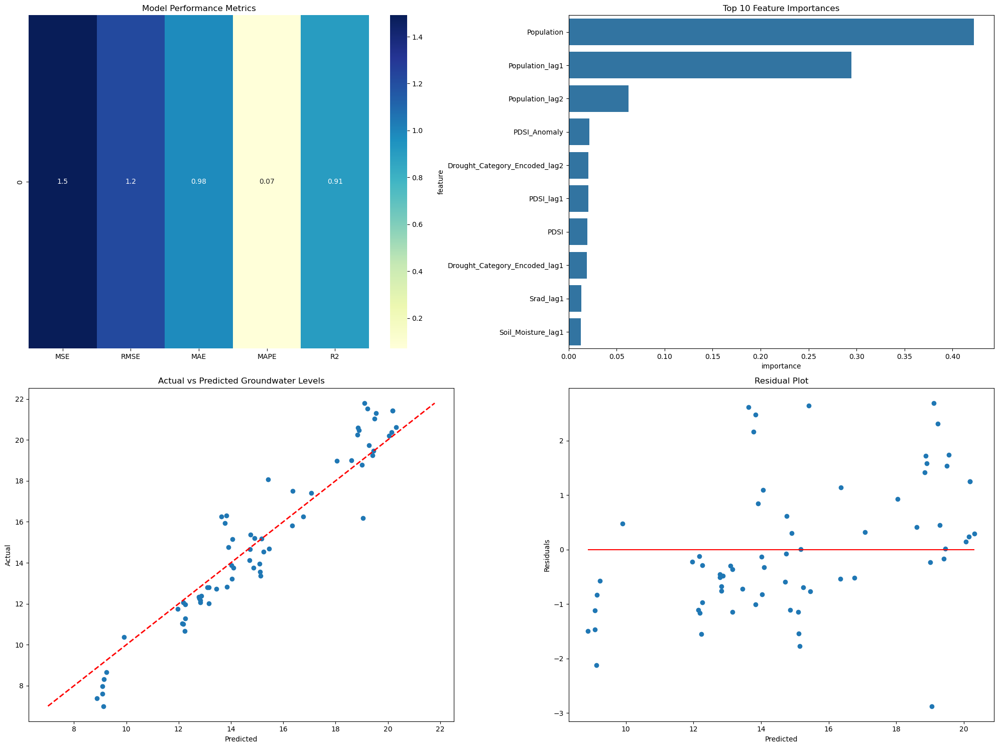

Evaluating Kollam


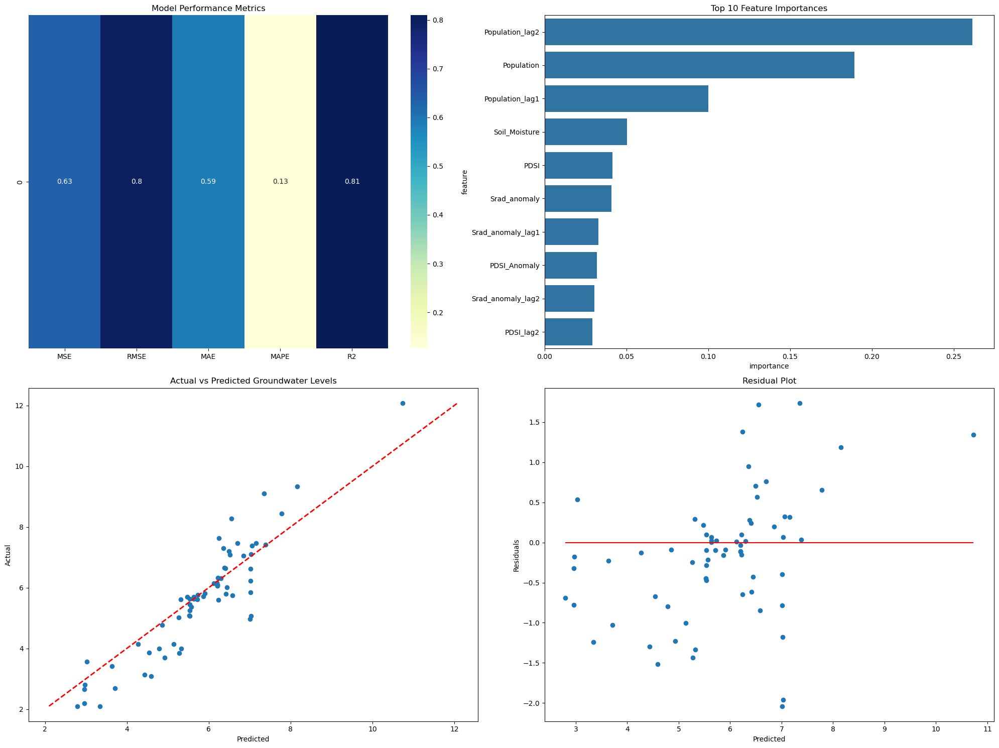

Evaluating Madurai


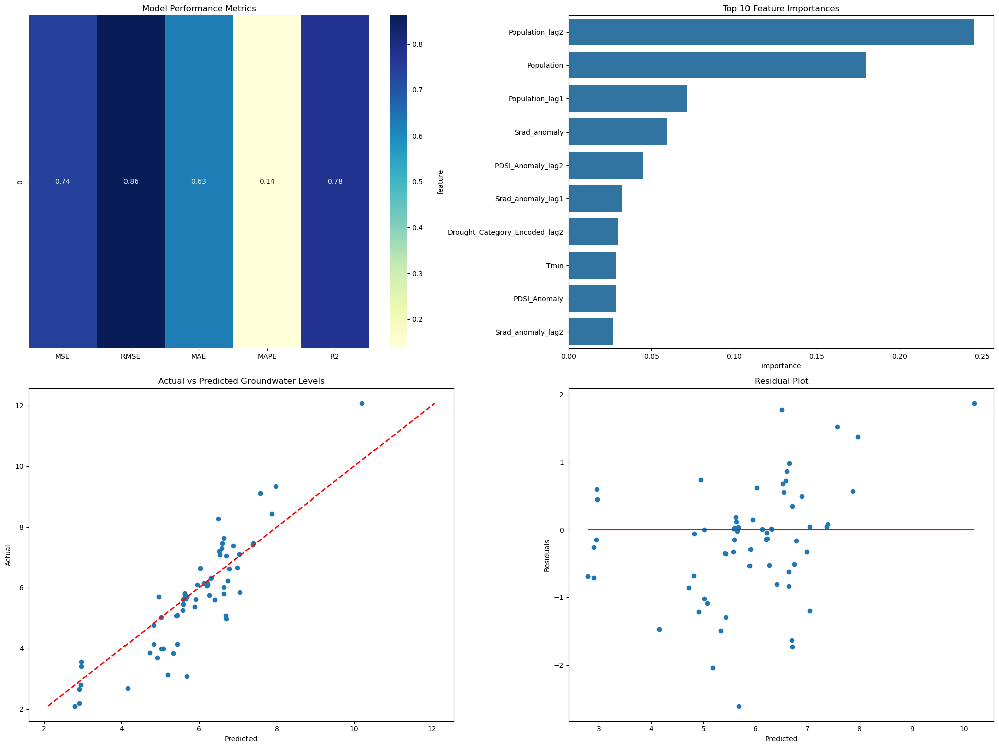

Evaluating Kochi (Cochin)


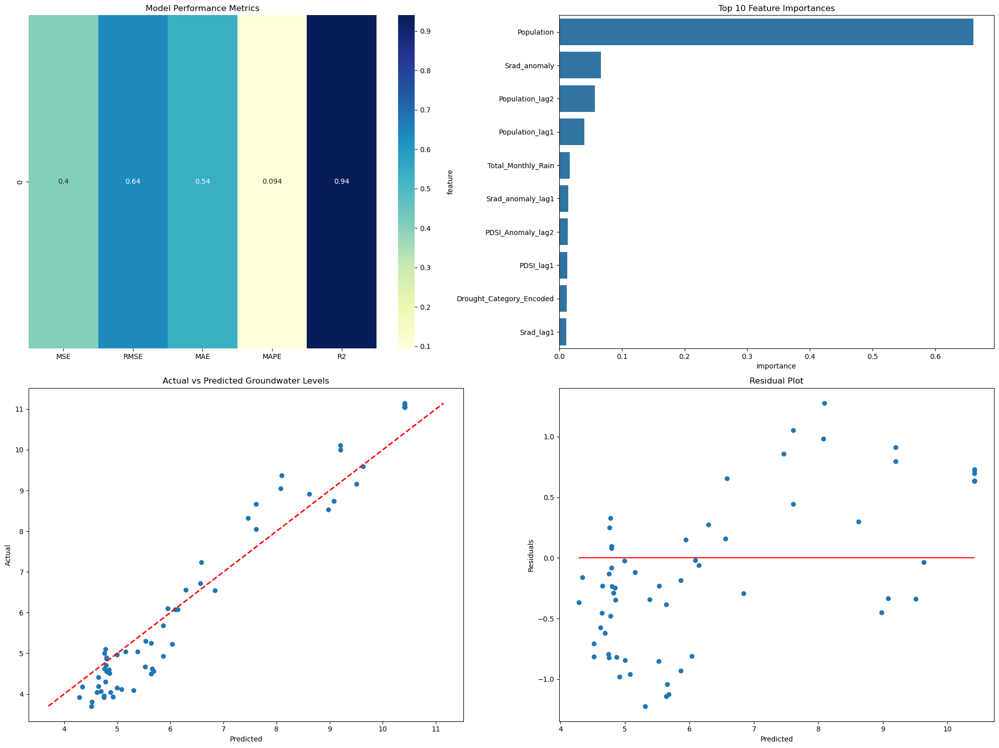

Evaluating Thrissur


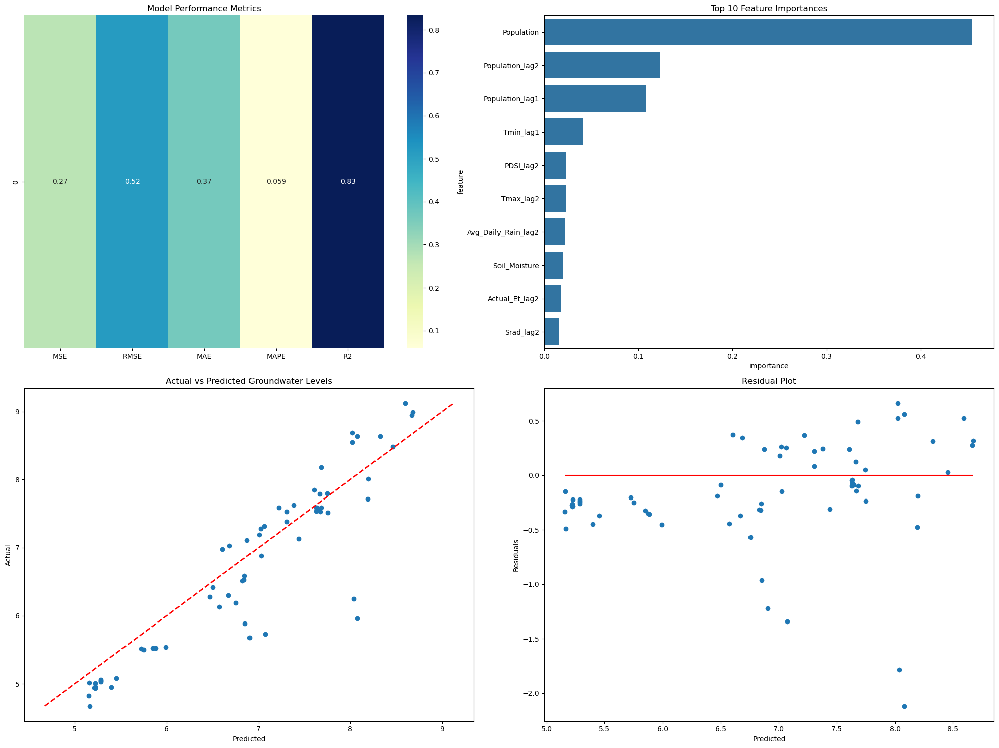

Evaluating Coimbatore


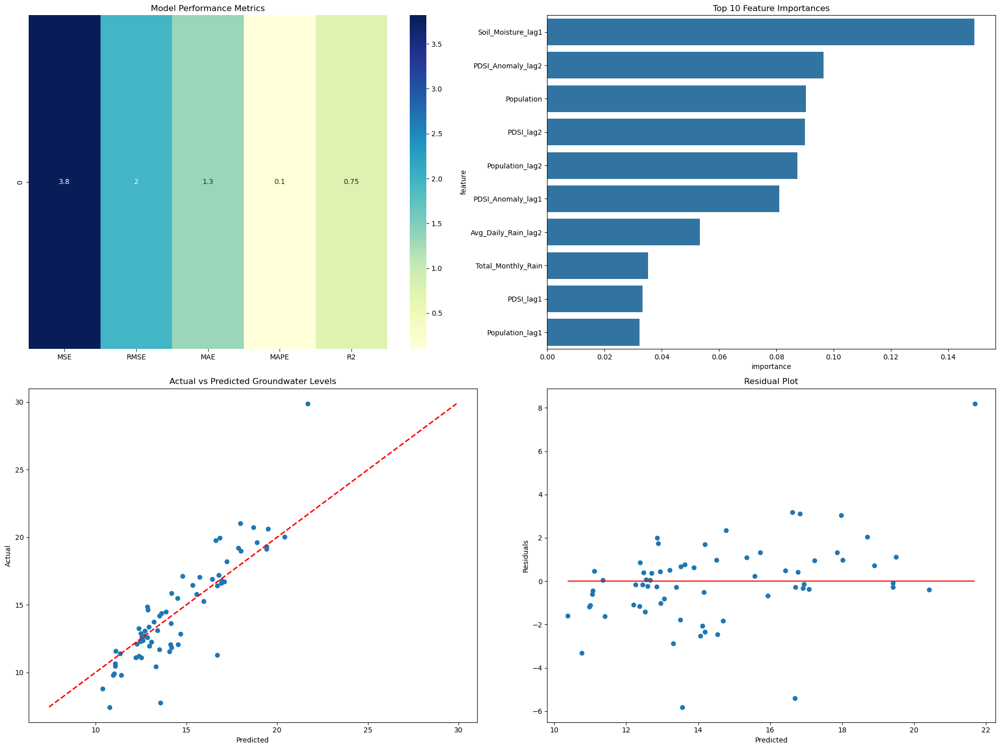

Evaluating Malappuram


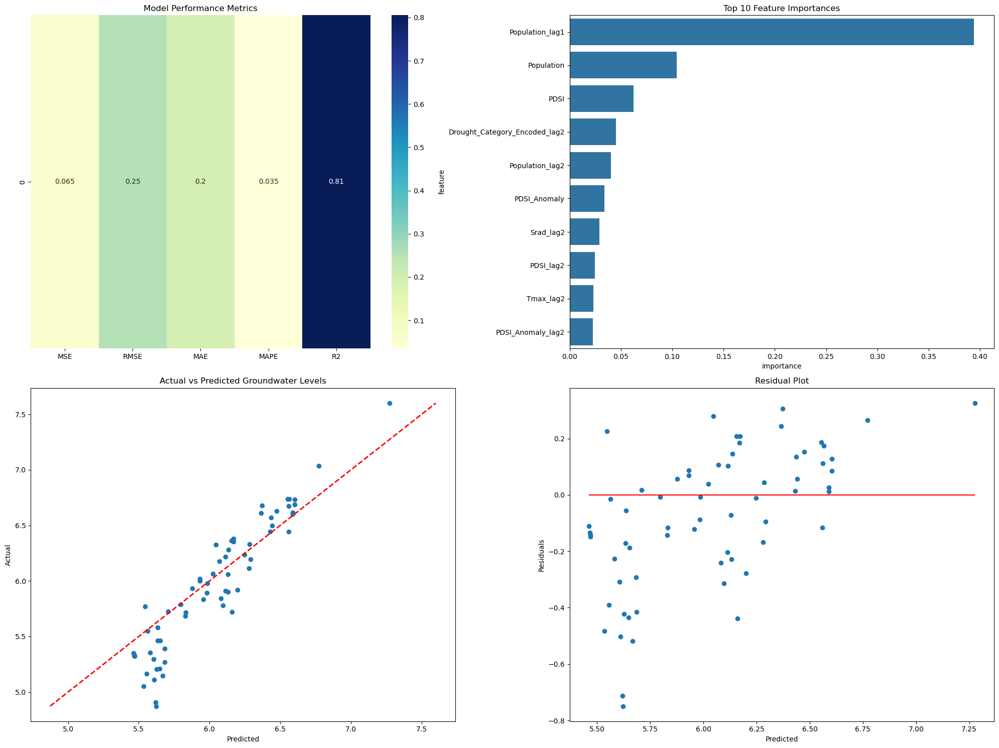

Evaluating Tiruppur


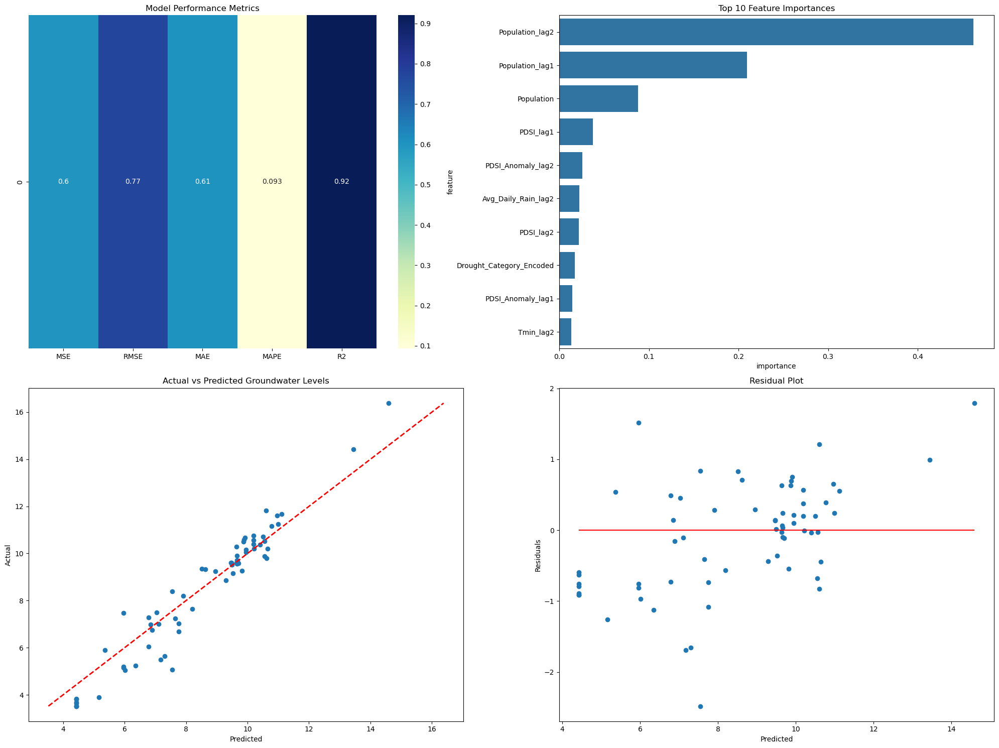

Evaluating Kozhikode (Calicut)


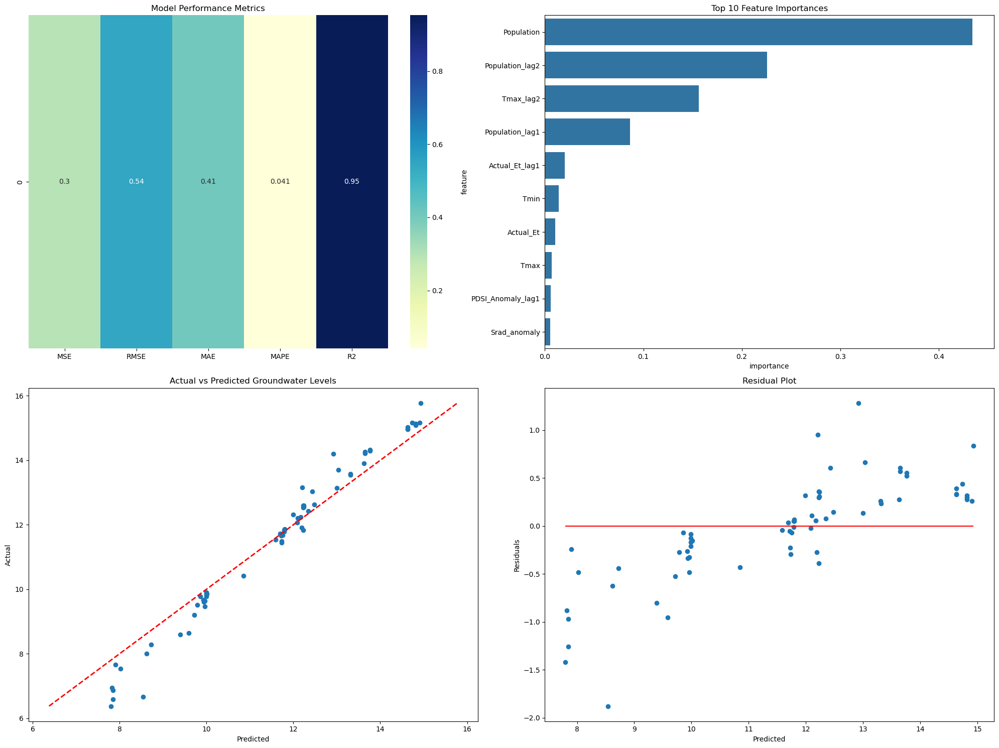

Evaluating Salem


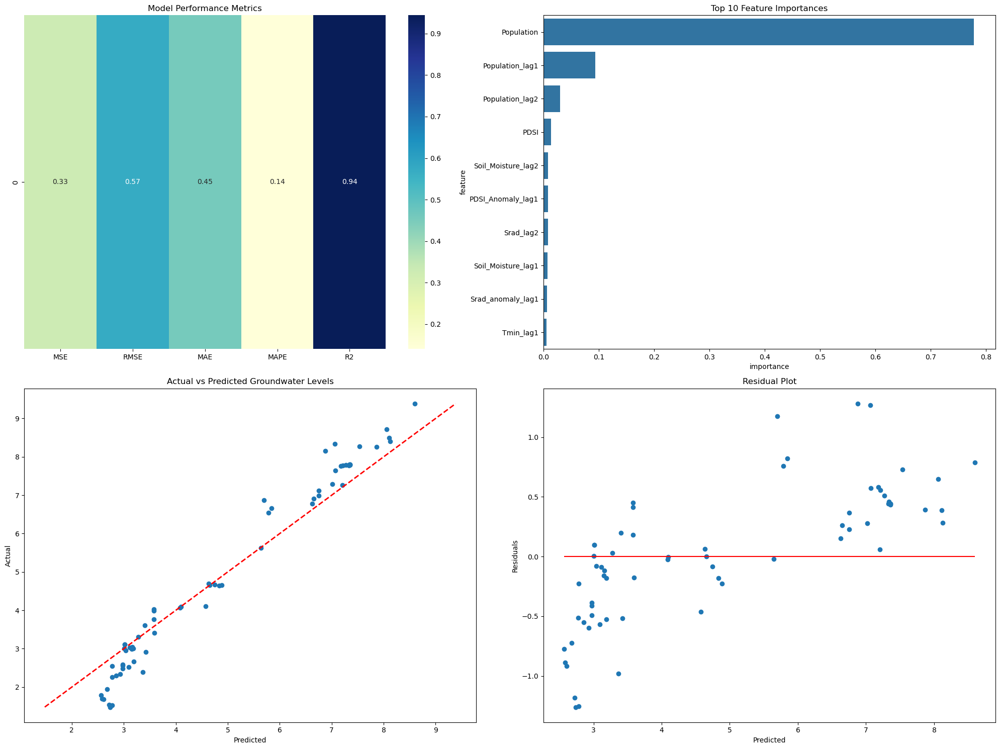

Evaluating Mysore


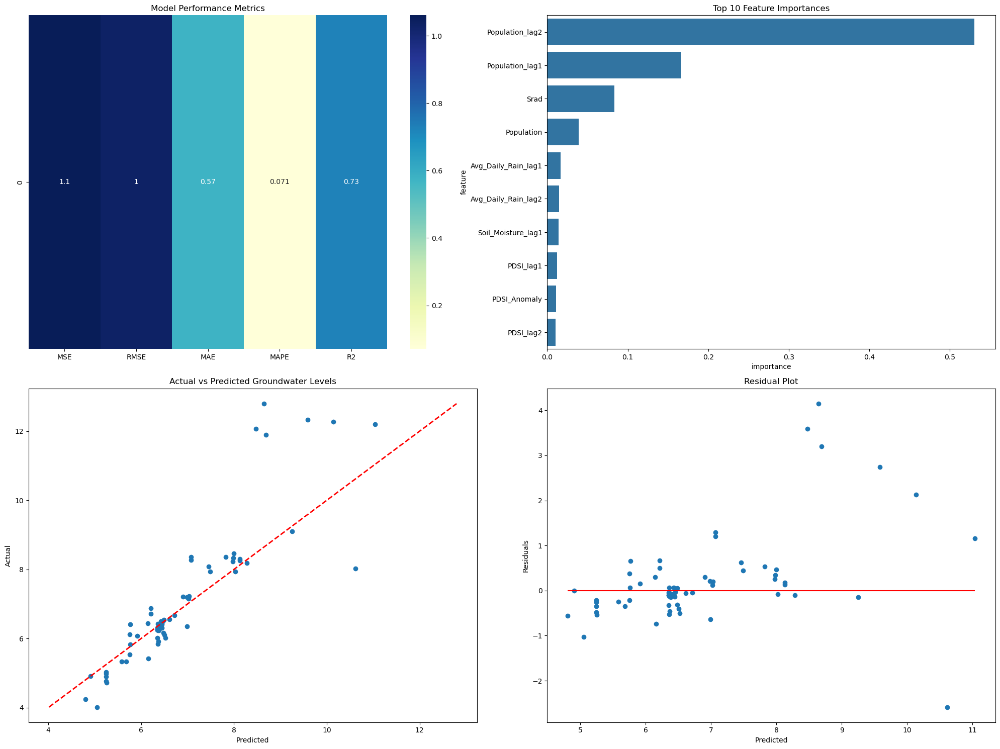

Evaluating Bengaluru


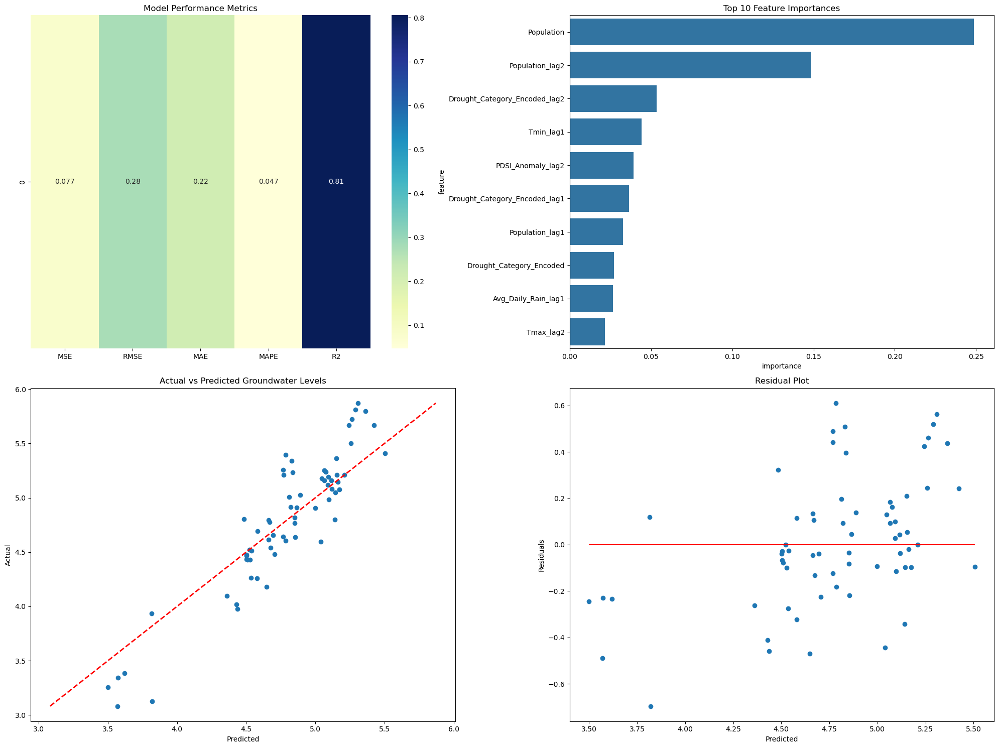

Evaluating Chennai (Madras)


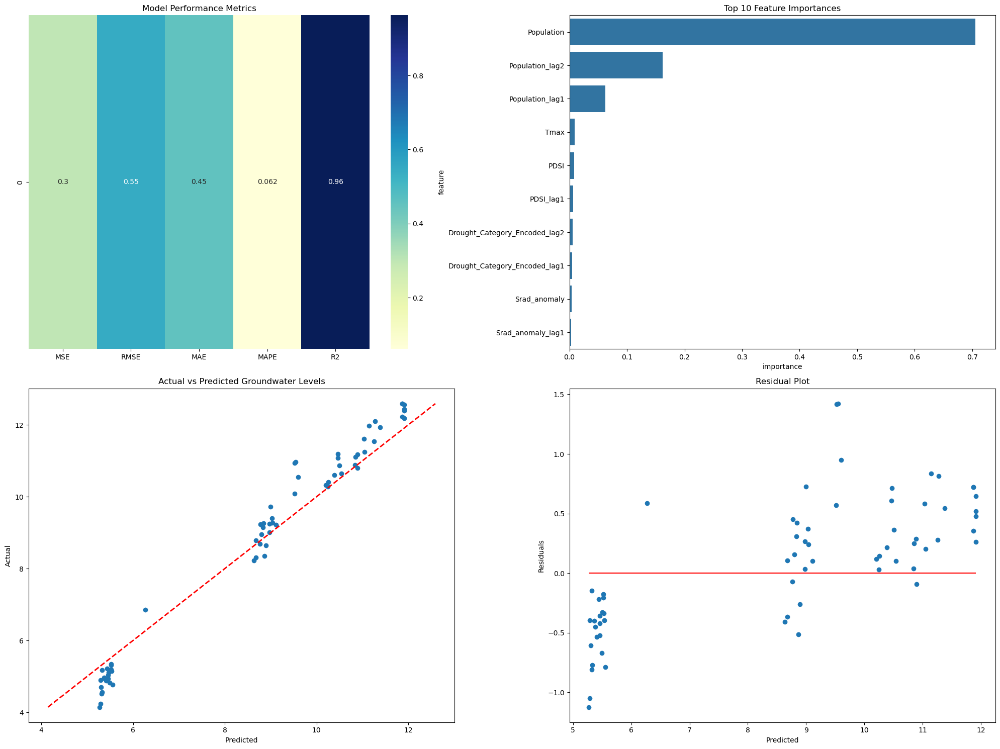

Evaluating Hubli-Dharwad


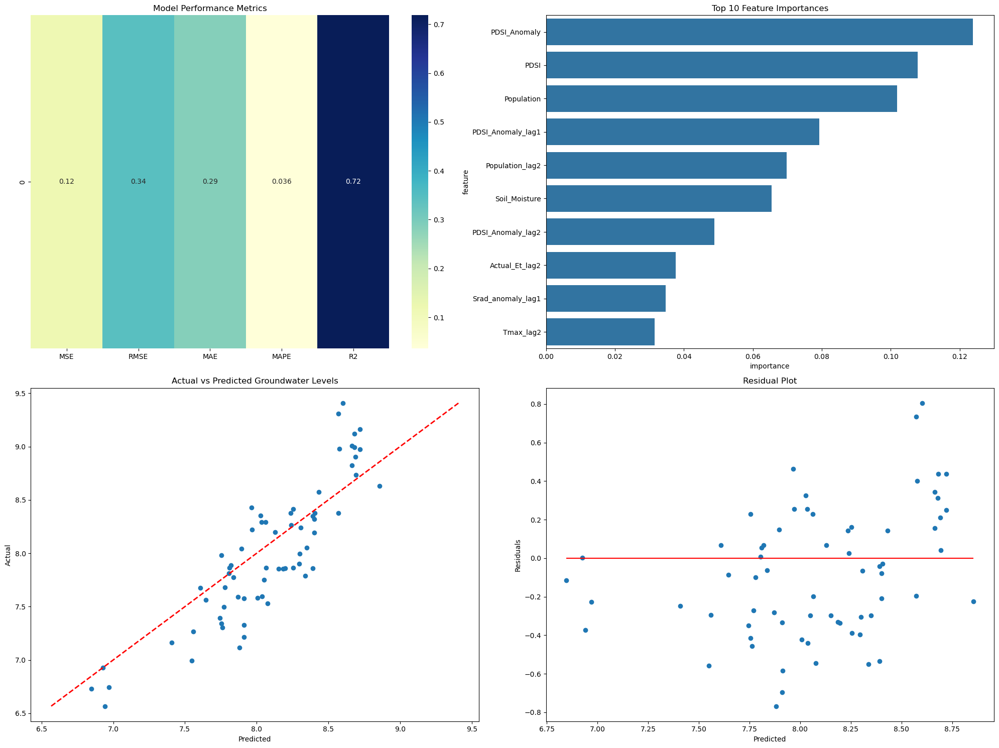

Evaluating Hyderabad


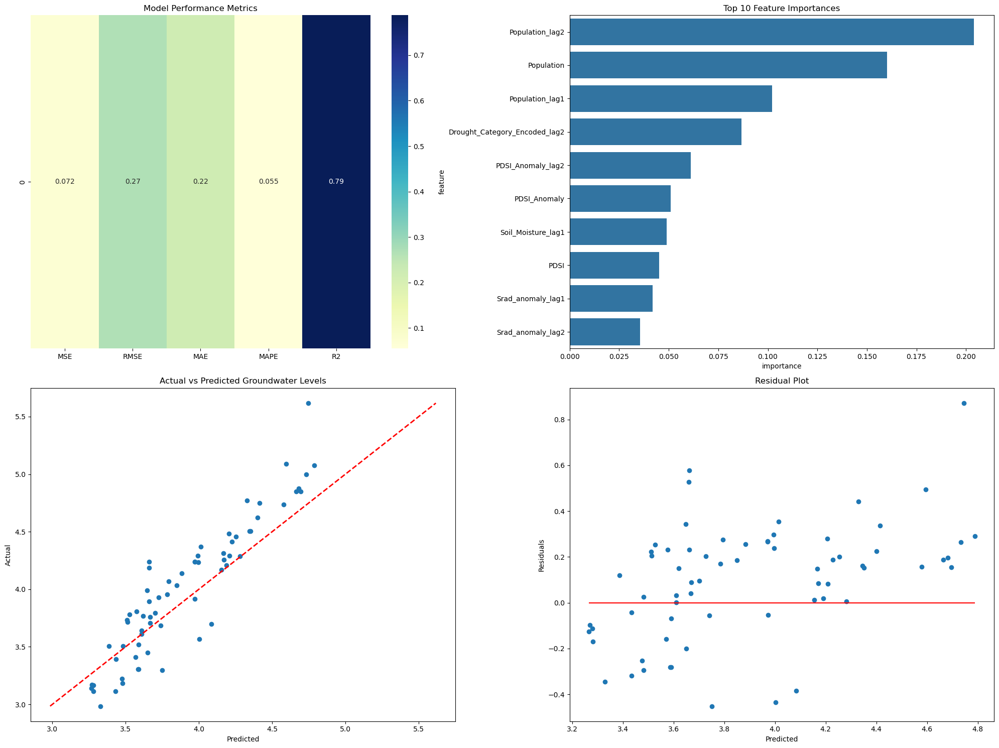

Evaluating Warangal


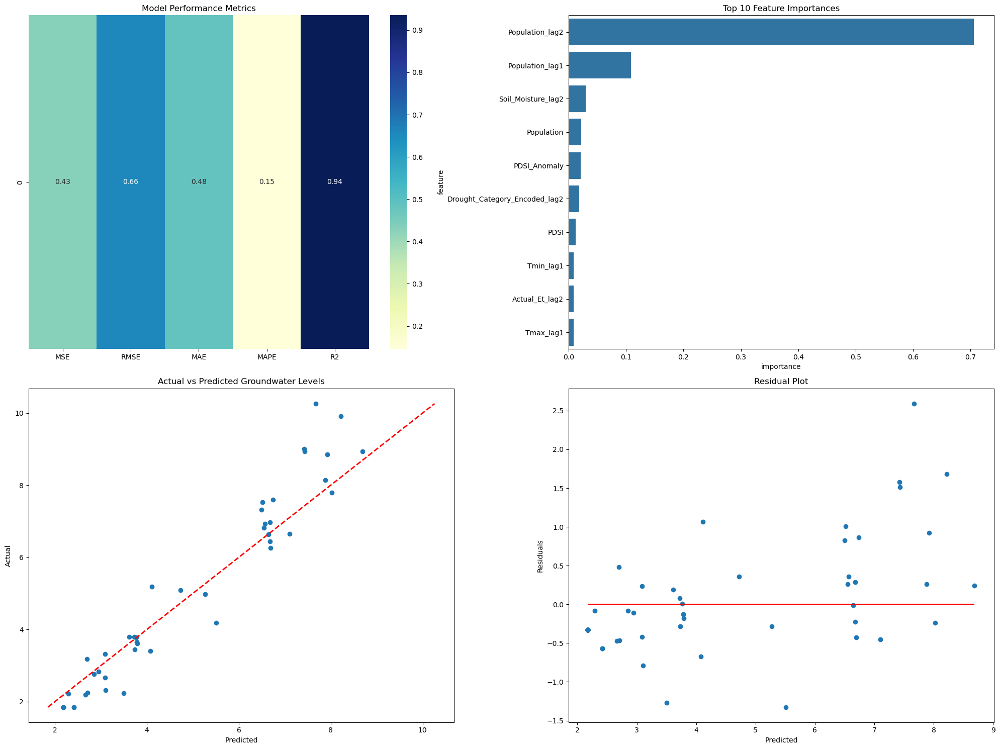

Evaluating Pune (Poona)


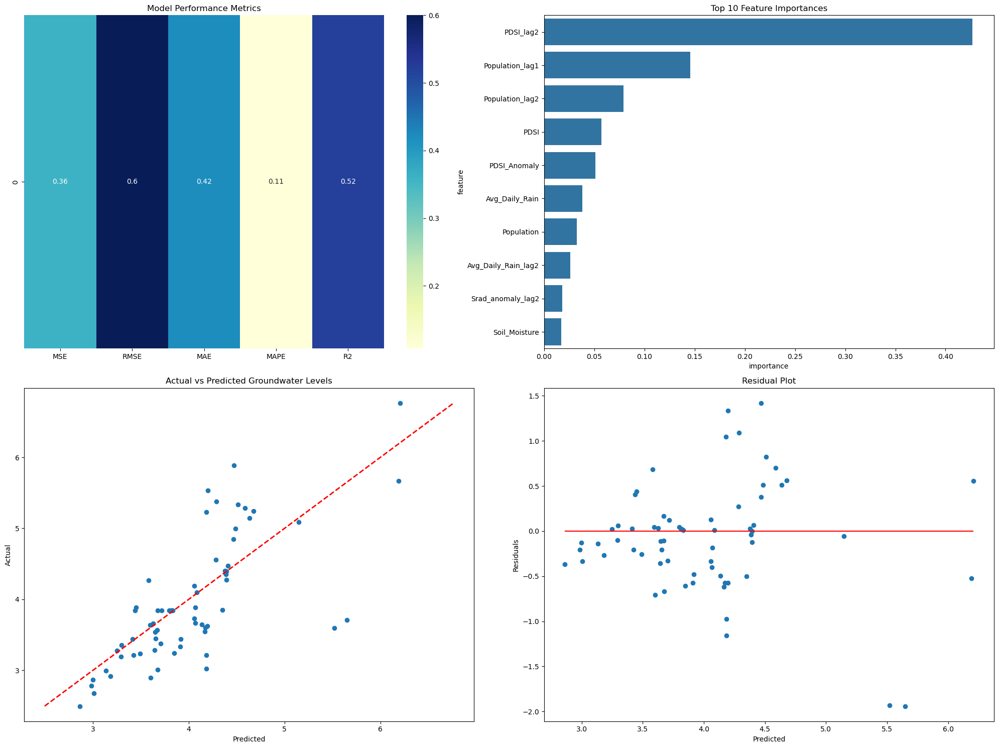

Evaluating Mumbai


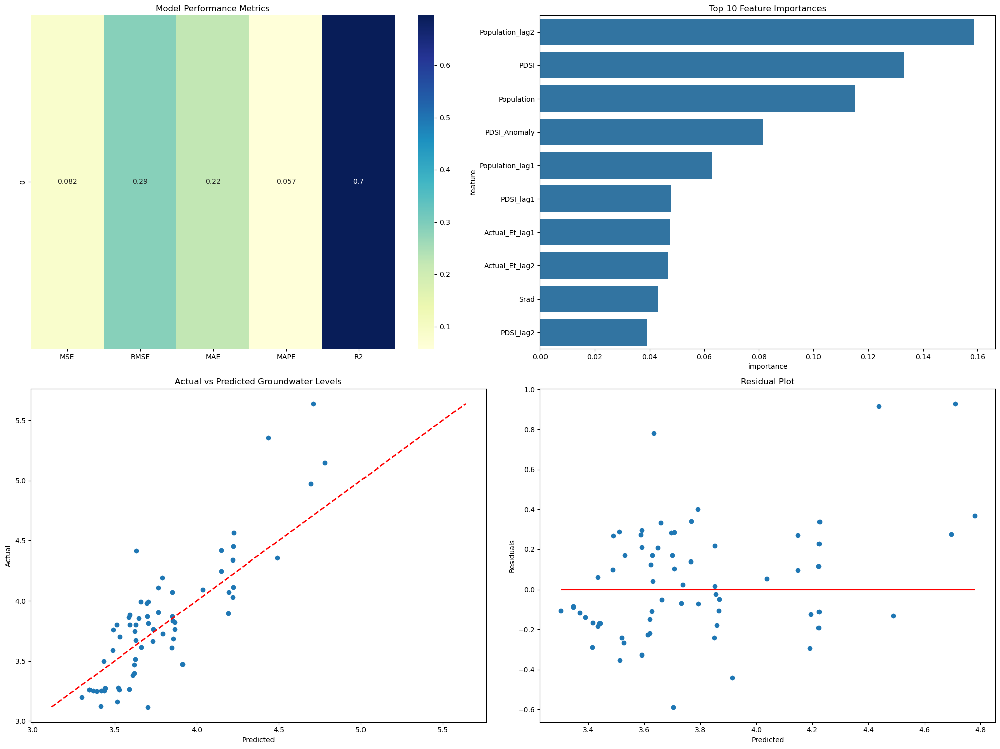

Evaluating Aurangabad


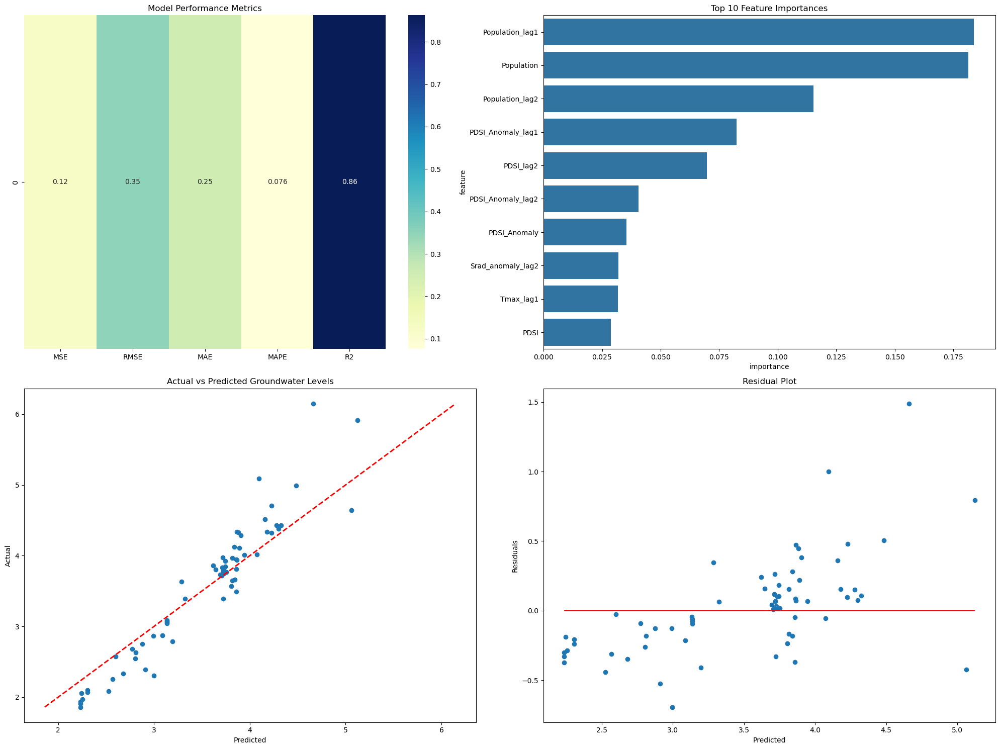

Evaluating Nashik


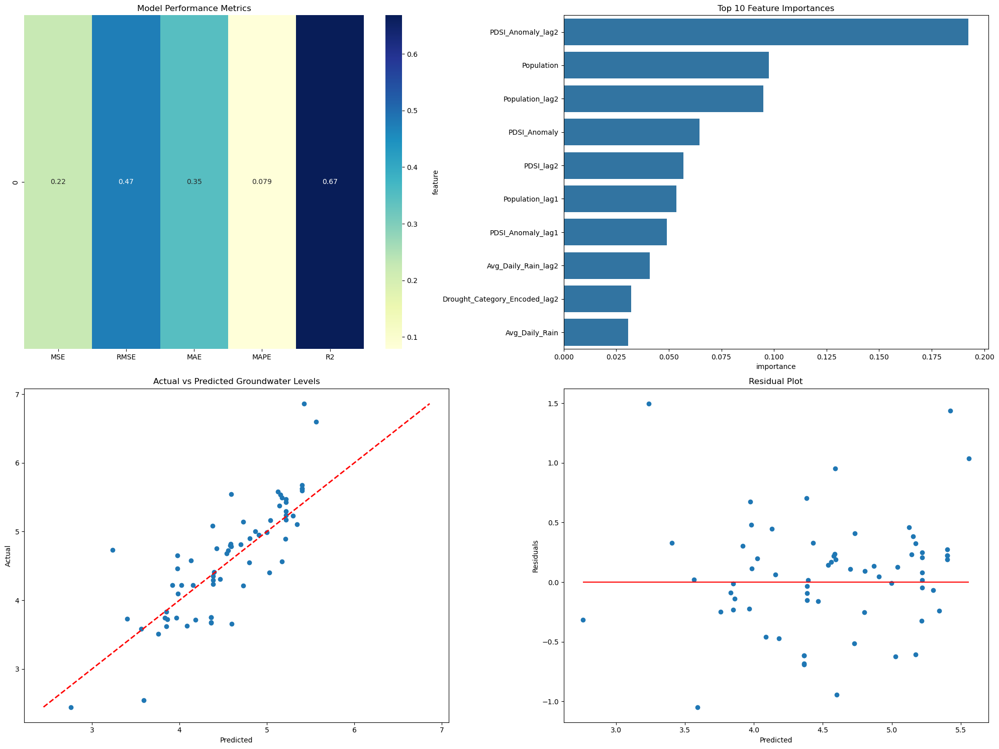

Evaluating Bhubaneswar


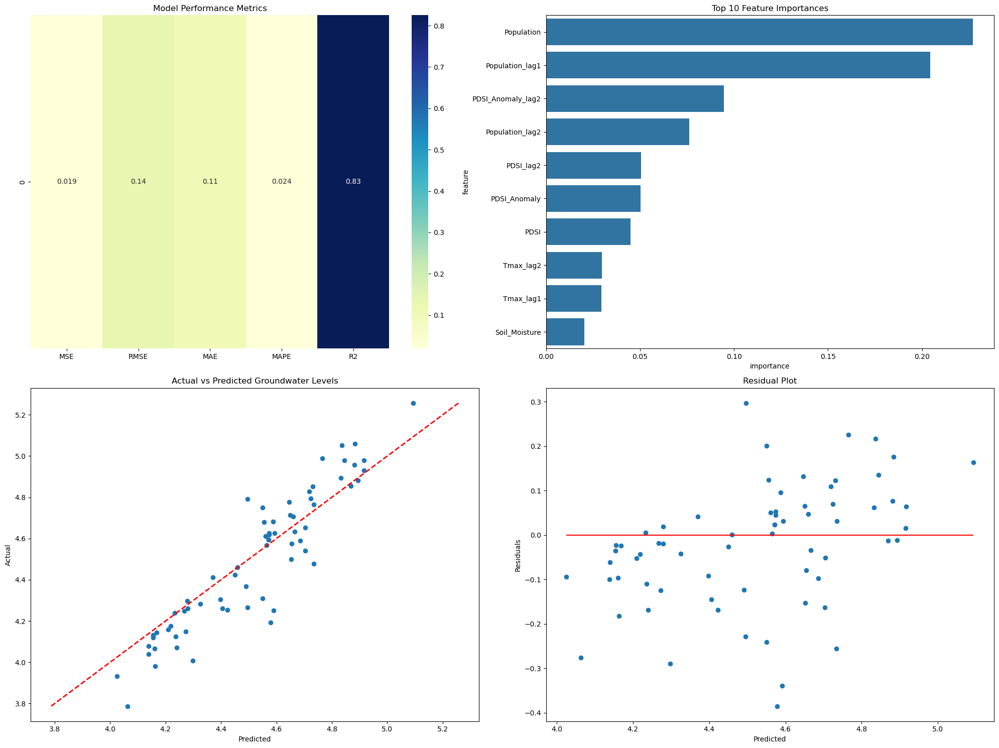

Evaluating Nagpur


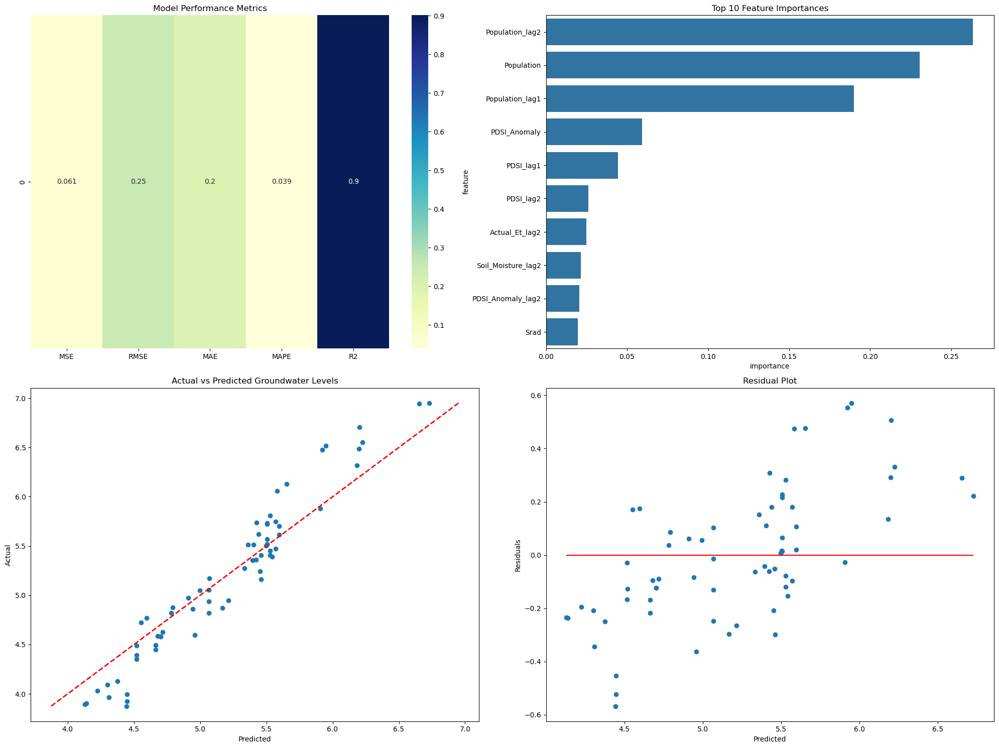

Evaluating Surat


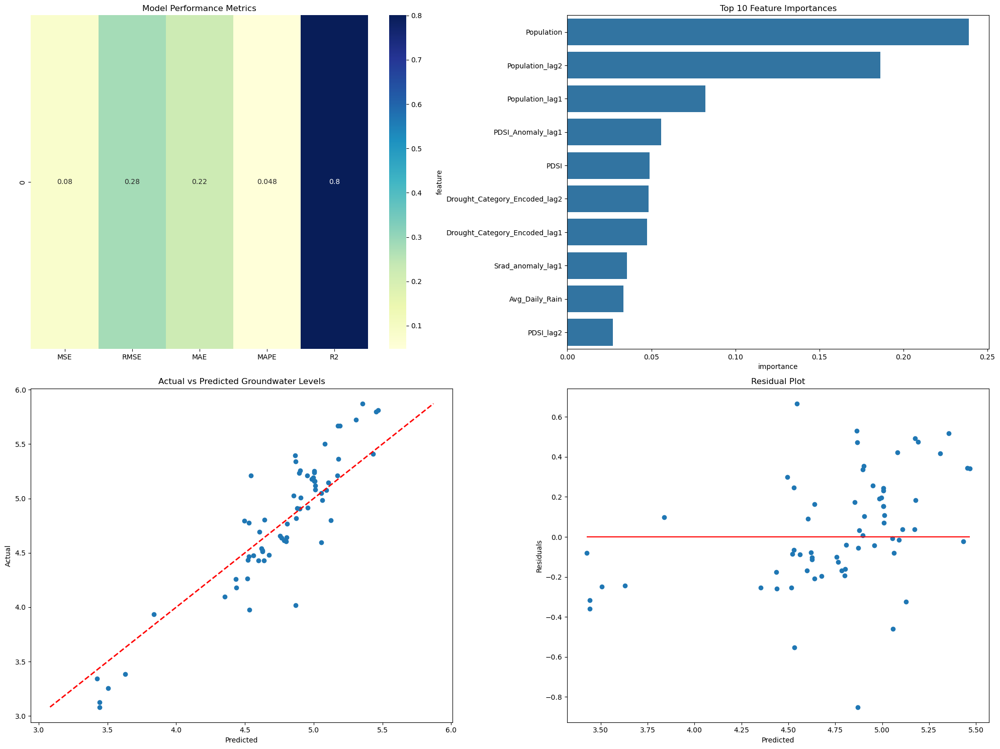

Evaluating Durg-Bhilainagar


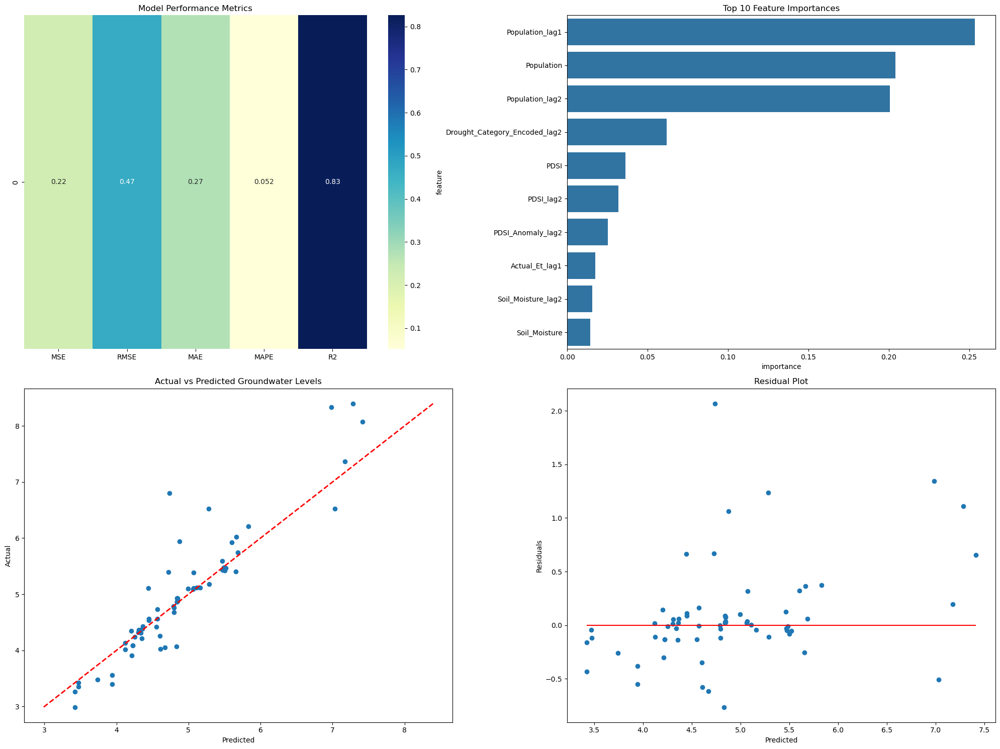

Evaluating Raipur


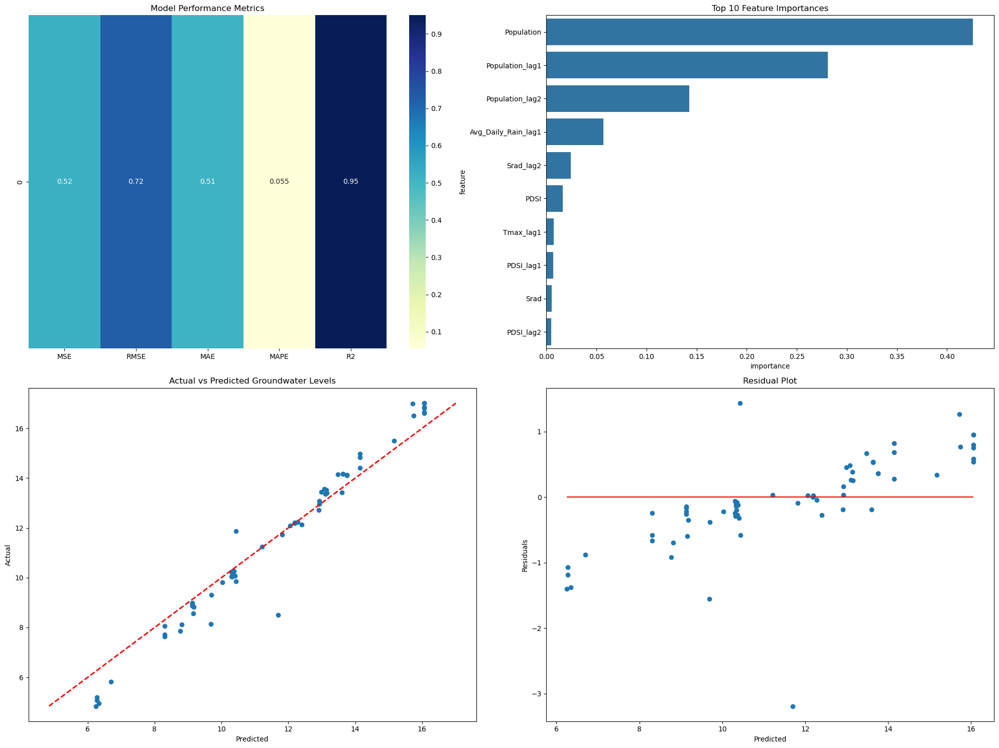

Evaluating Rajkot


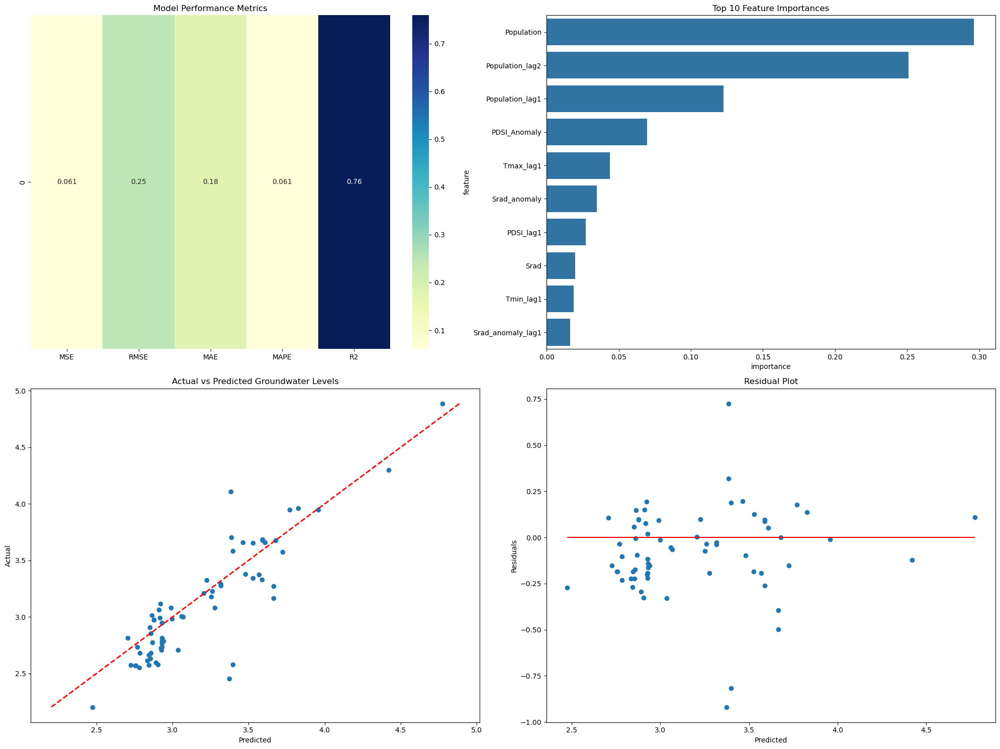

Evaluating Vadodara


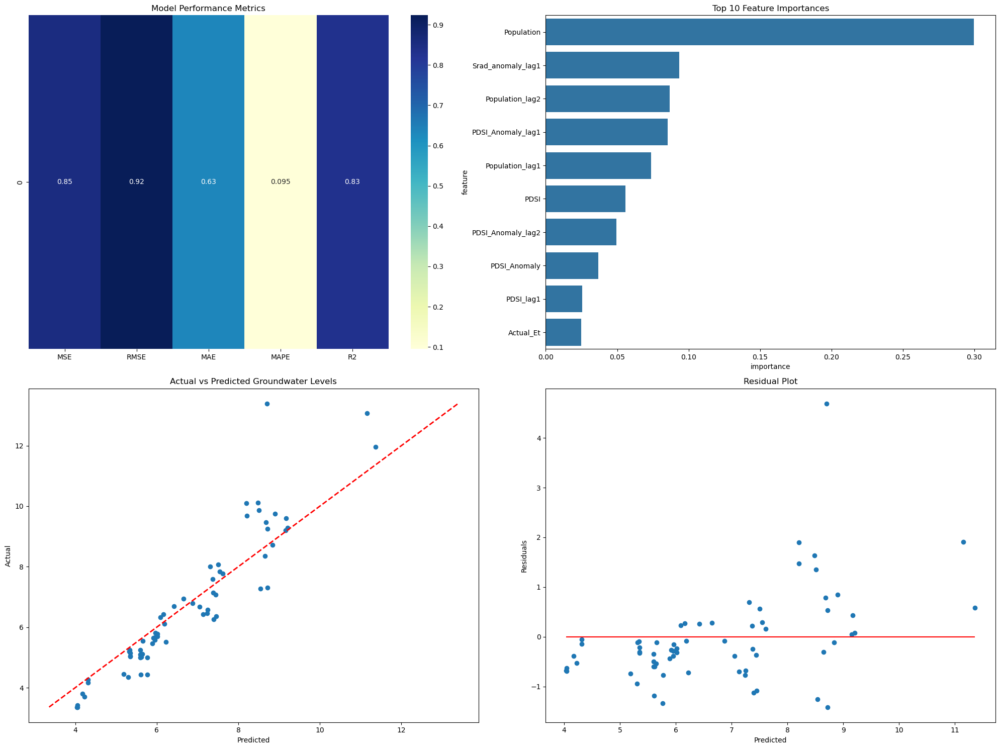

Evaluating Kolkata


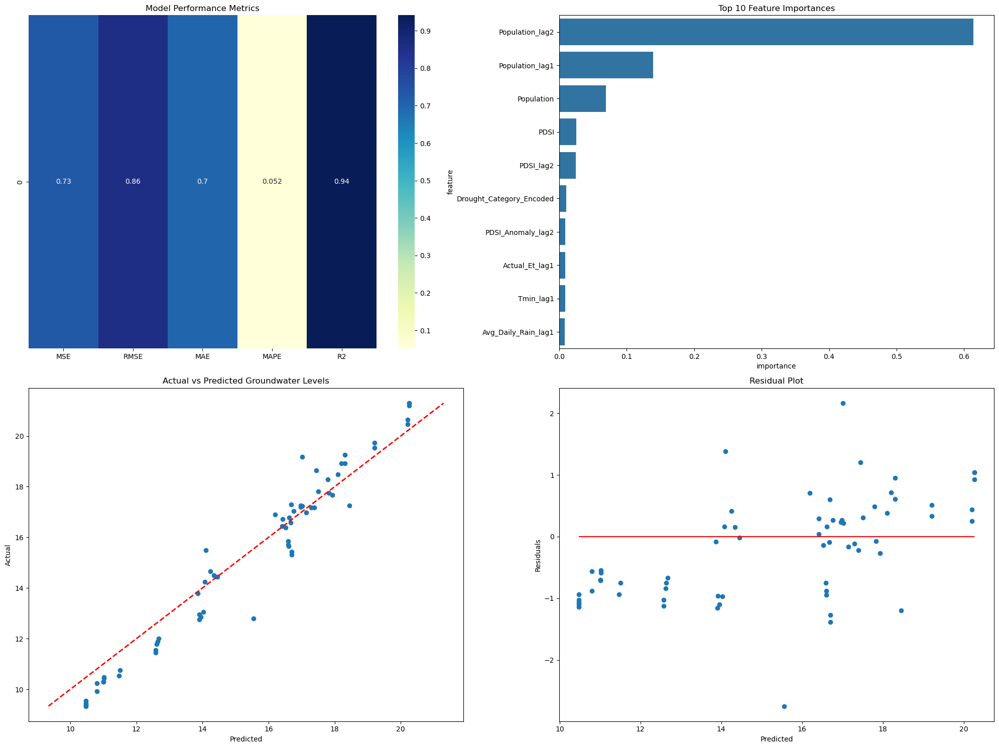

Evaluating Indore


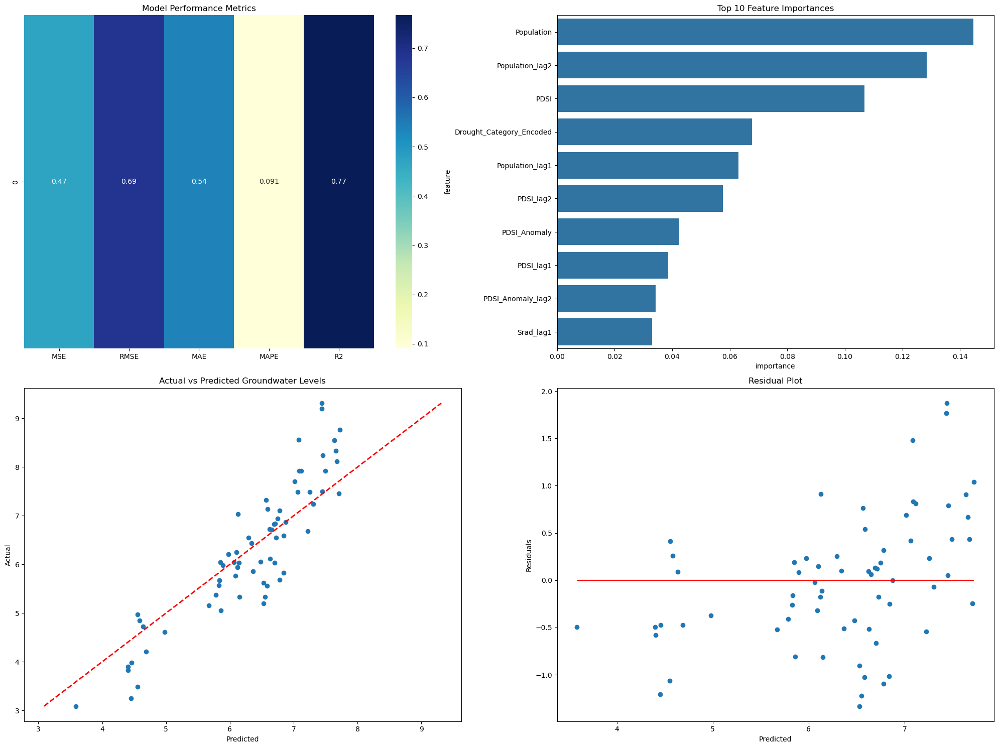

Evaluating Jamshedpur


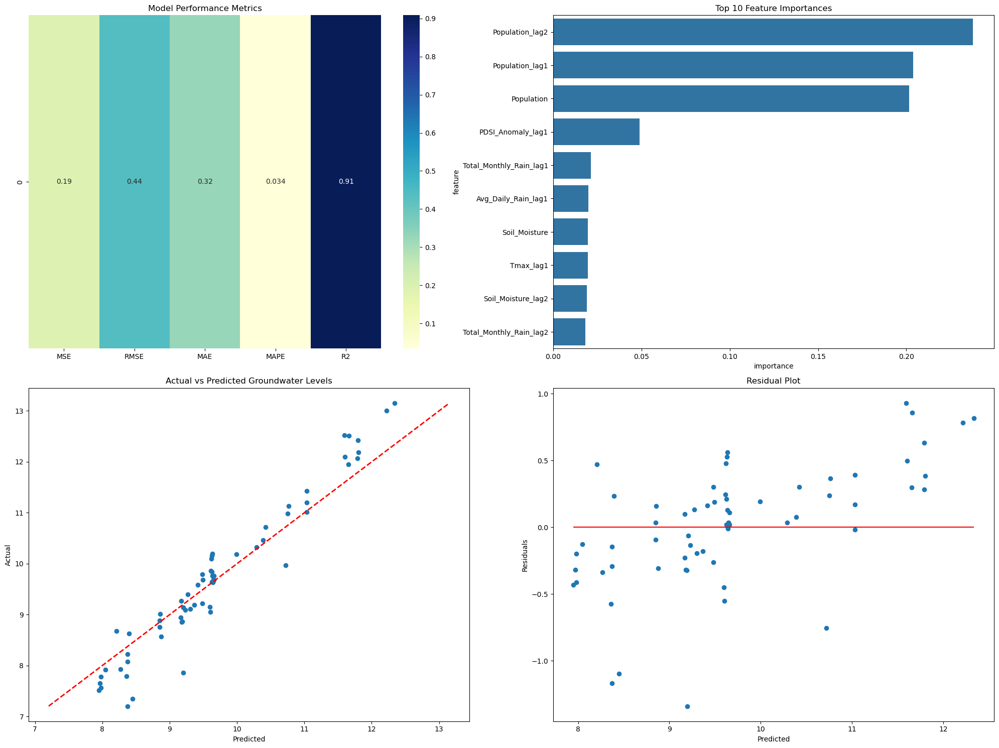

Evaluating Jabalpur


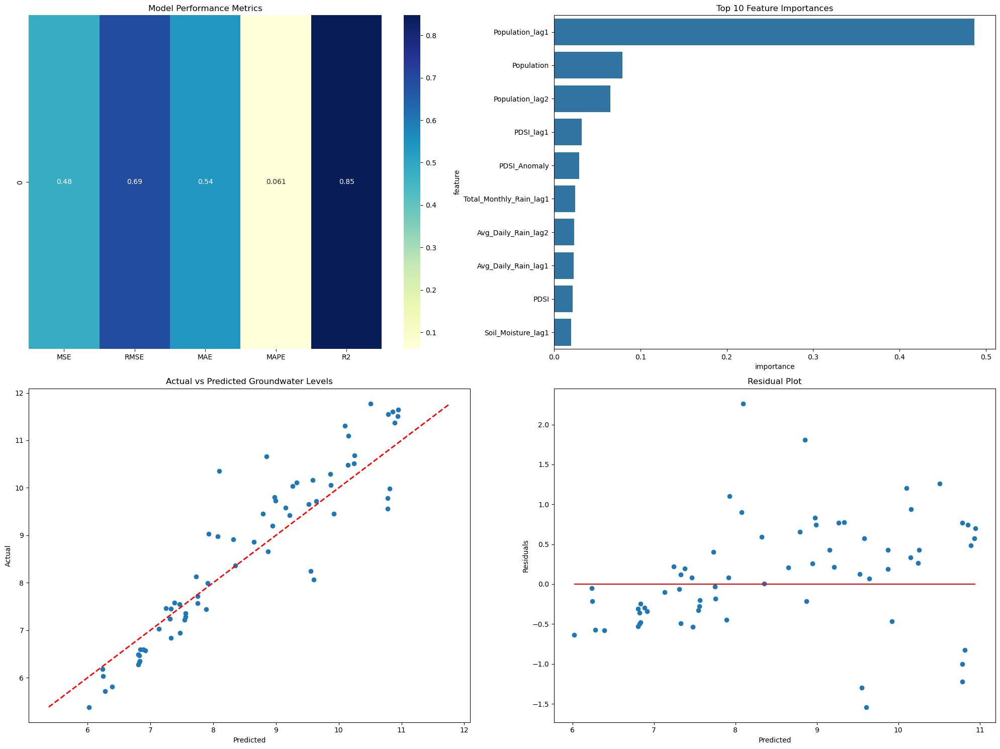

Evaluating Bhopal


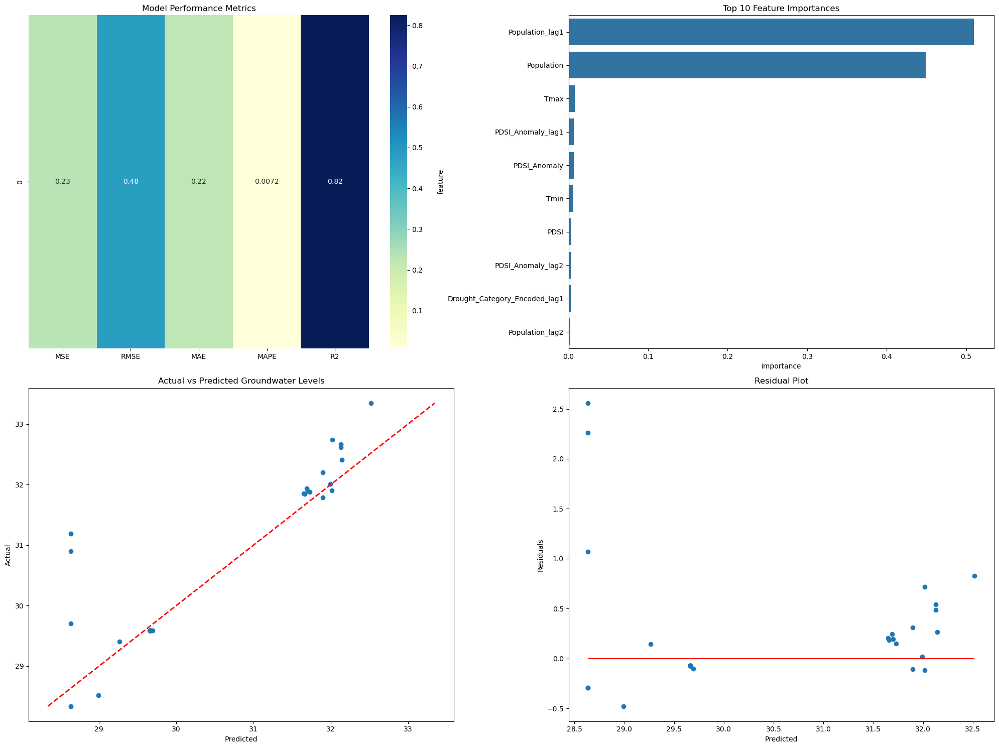

Evaluating Ranchi


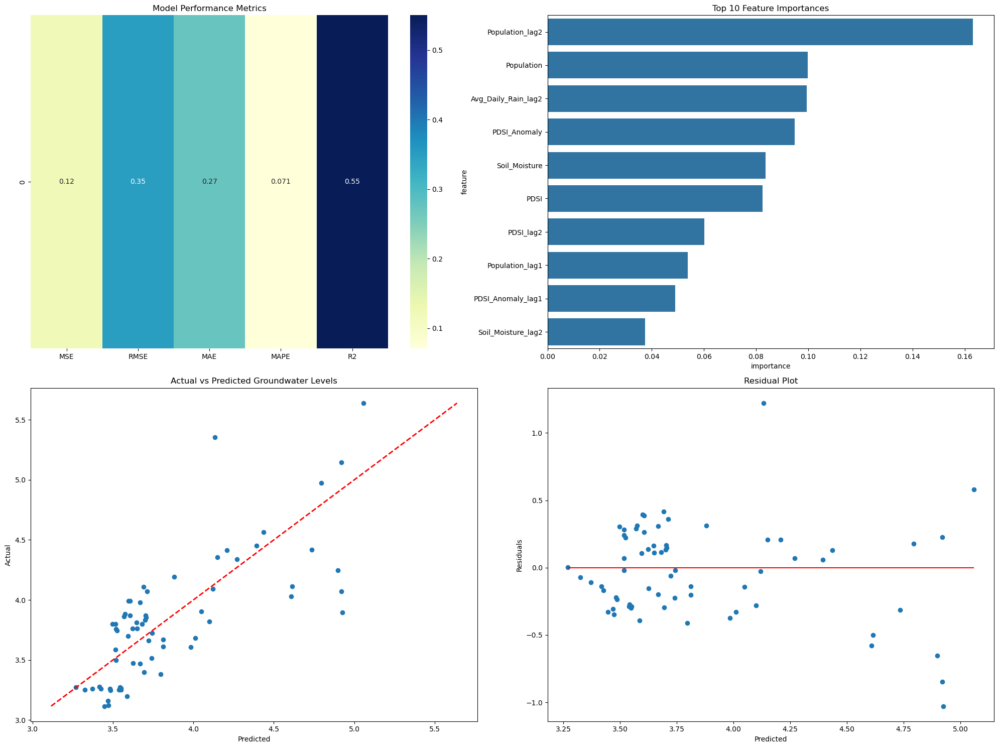

Evaluating Asansol


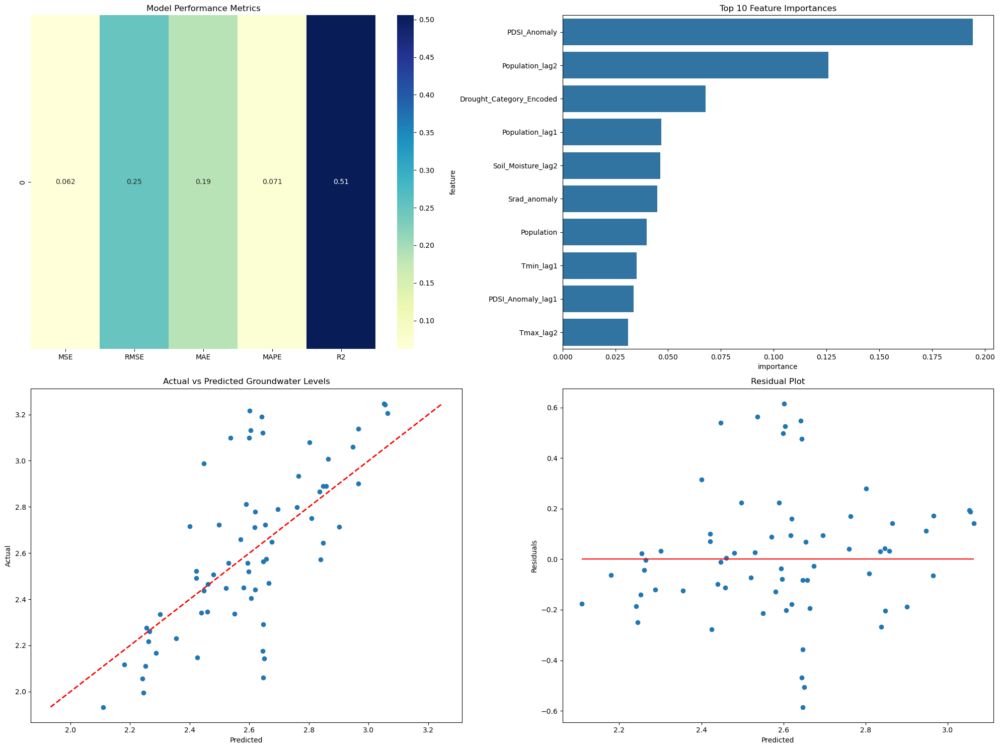

Evaluating Dhanbad


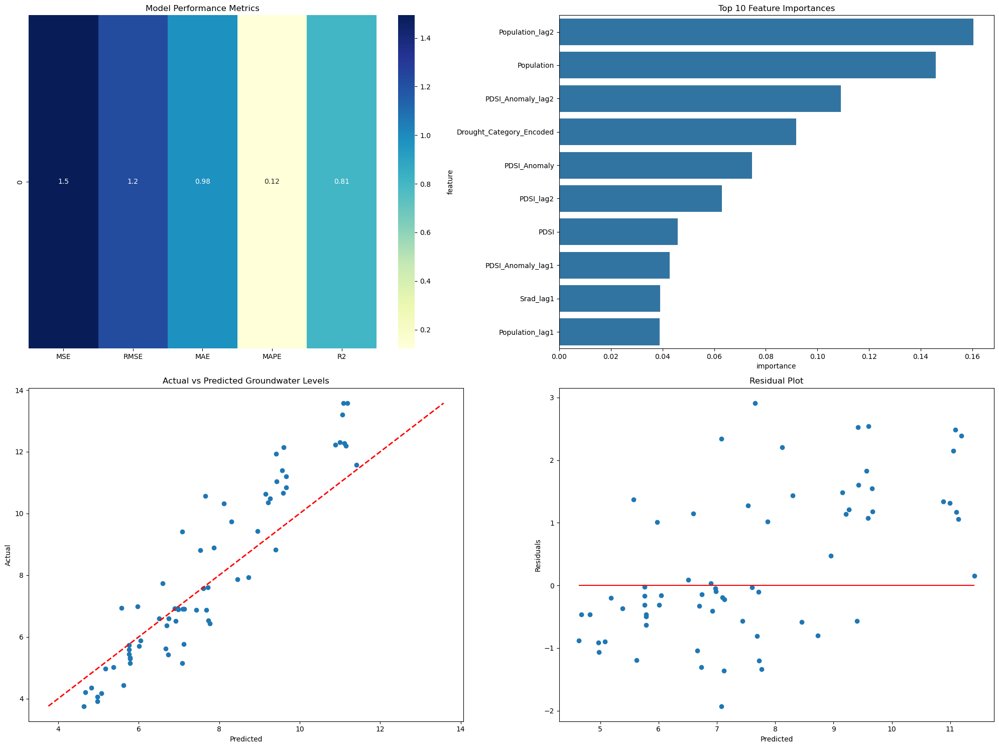

Evaluating Kota


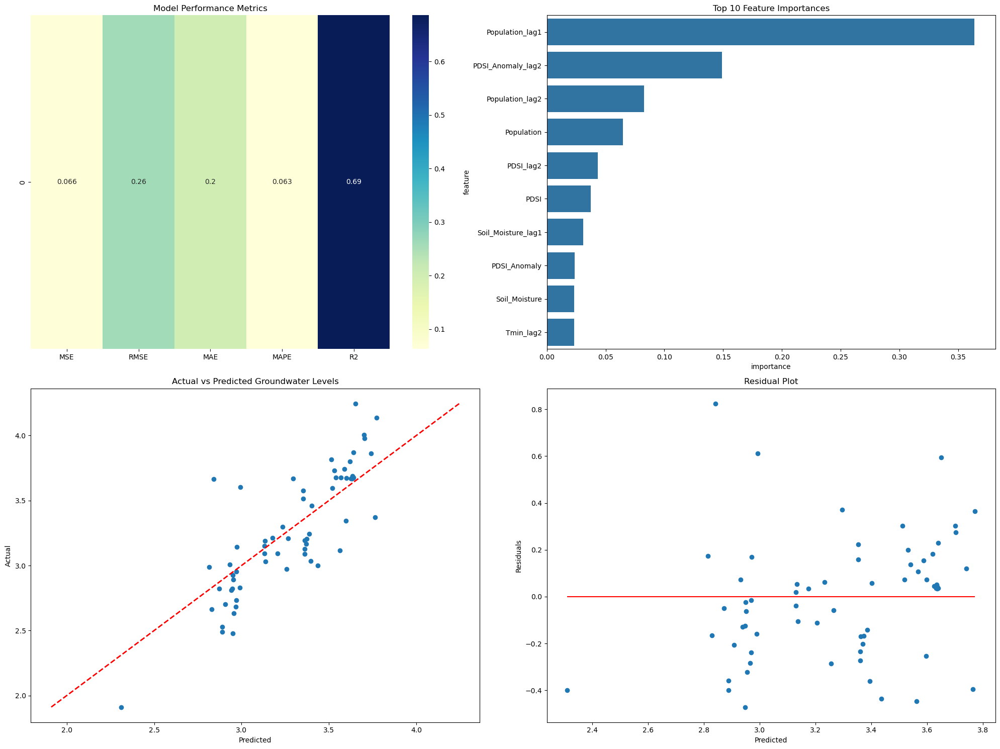

Evaluating Varanasi (Benares)


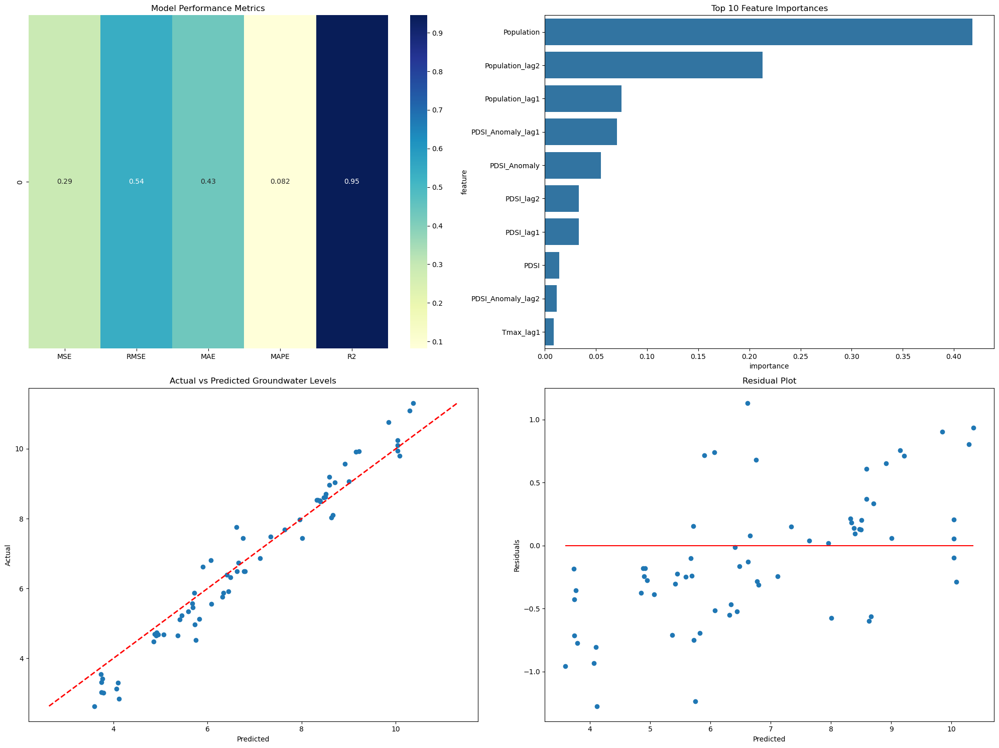

Evaluating Patna


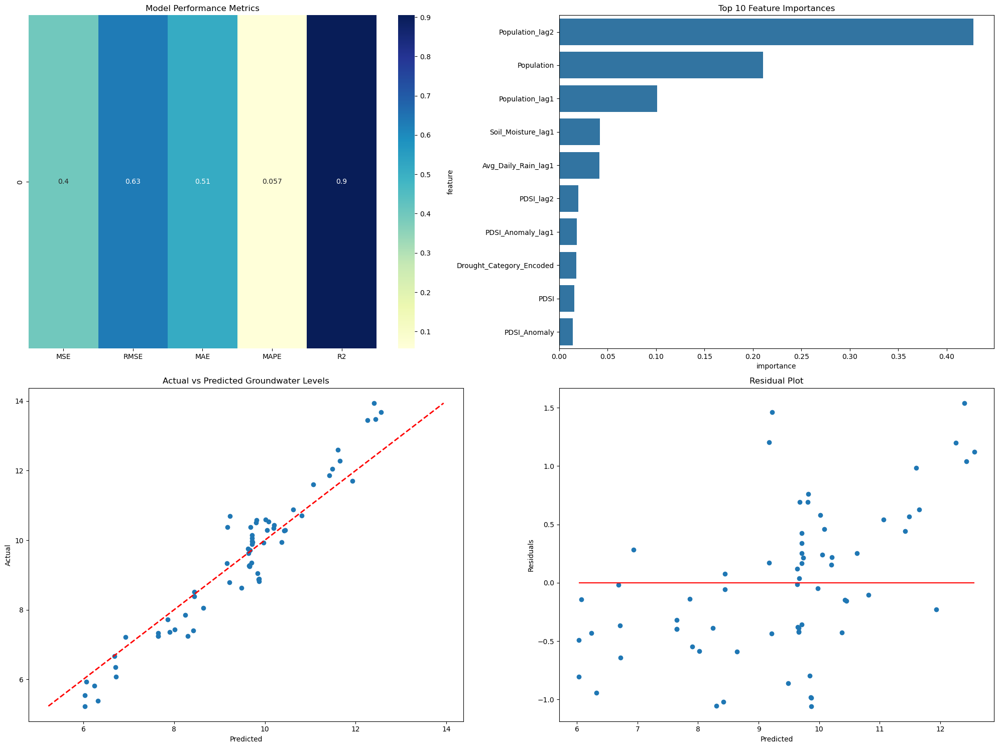

Evaluating Guwahati (Gauhati)


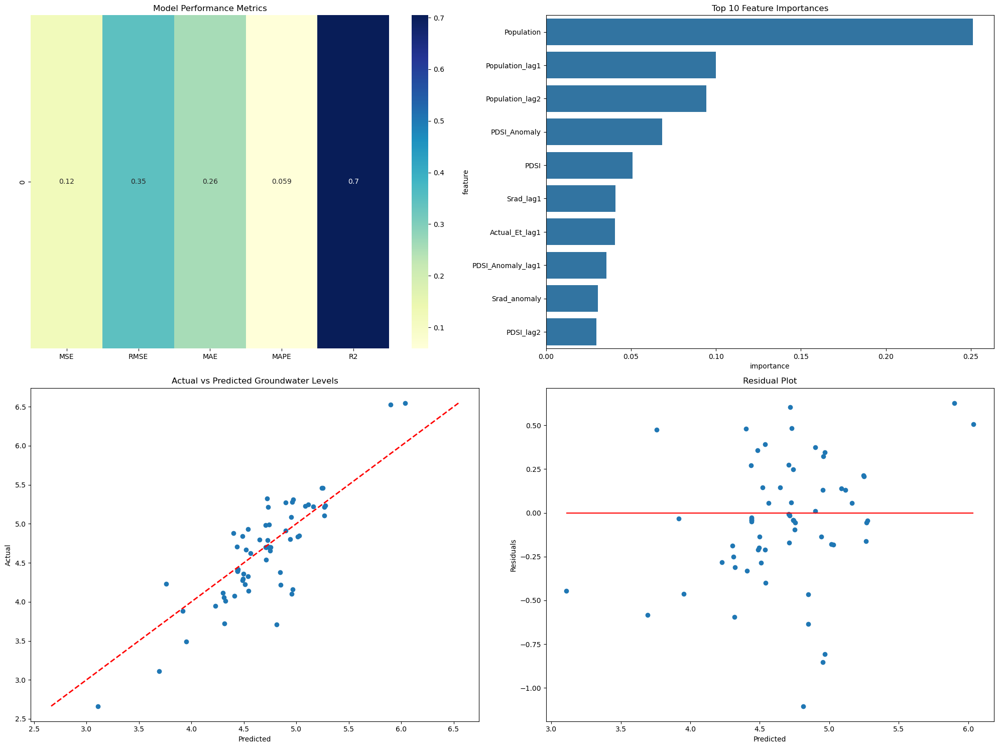

Evaluating Gwalior


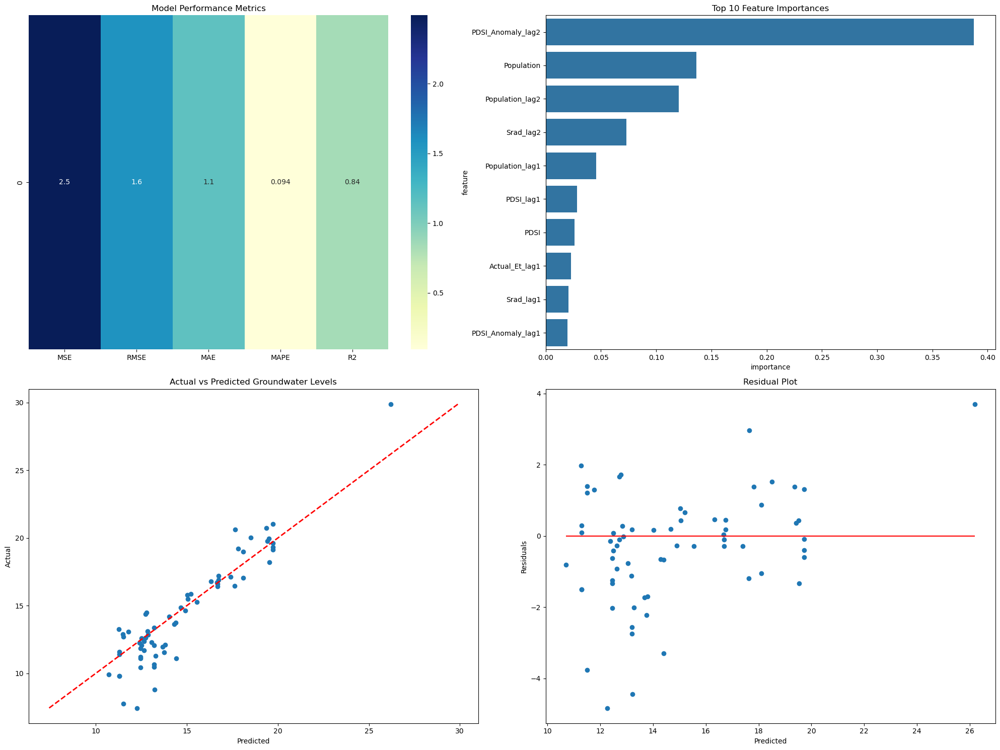

Evaluating Jodhpur


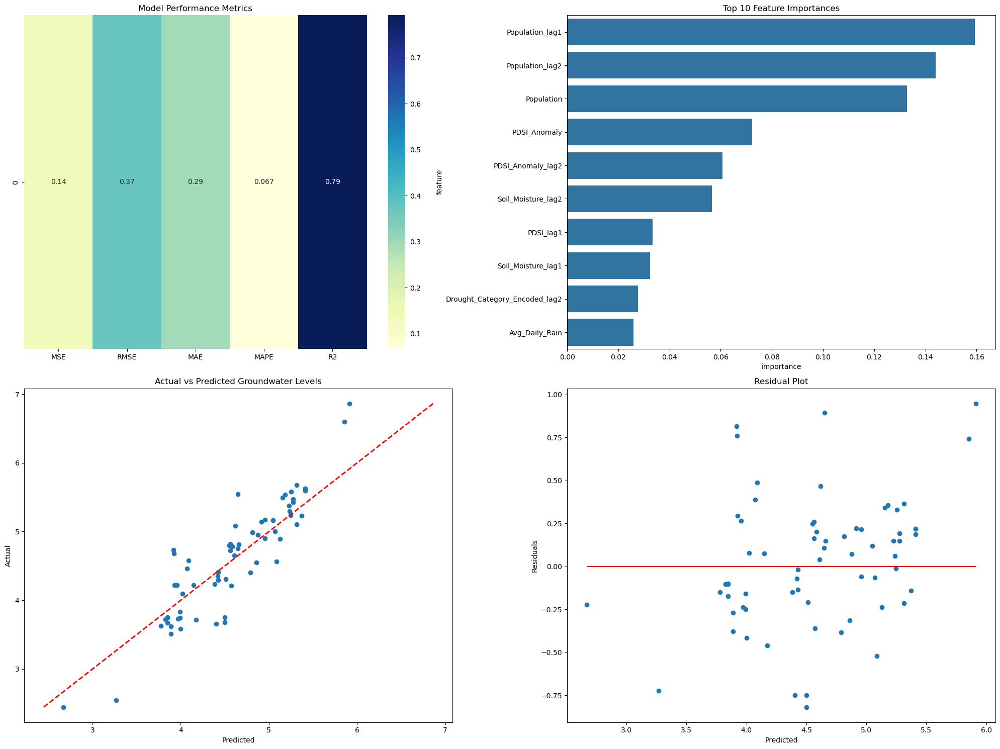

Evaluating Kanpur


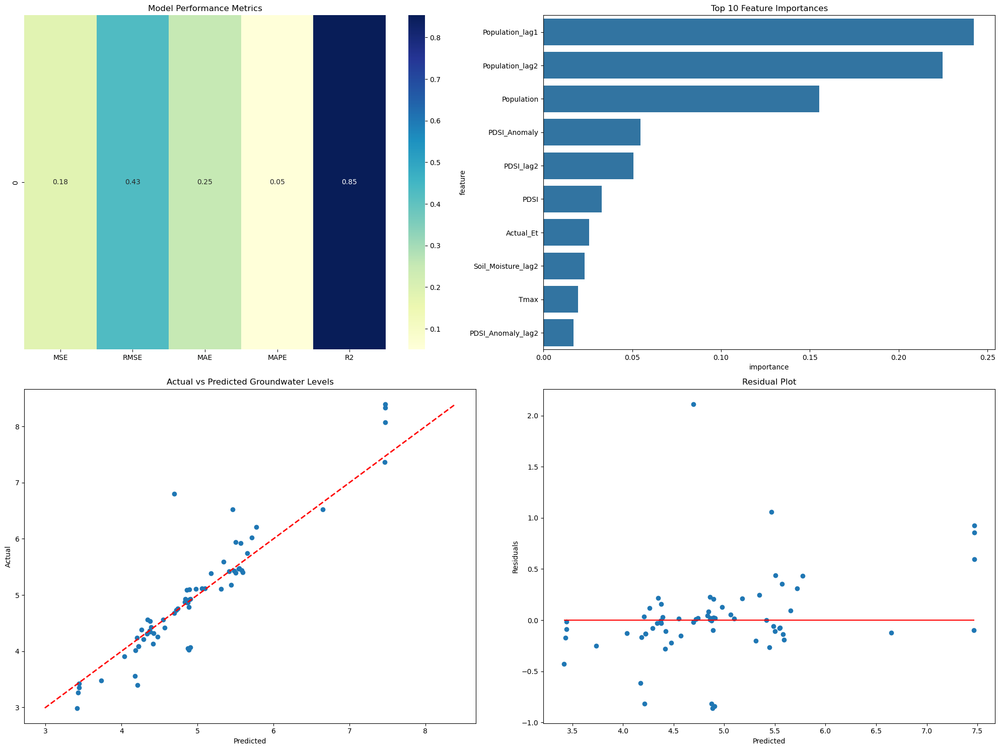

Evaluating Lucknow


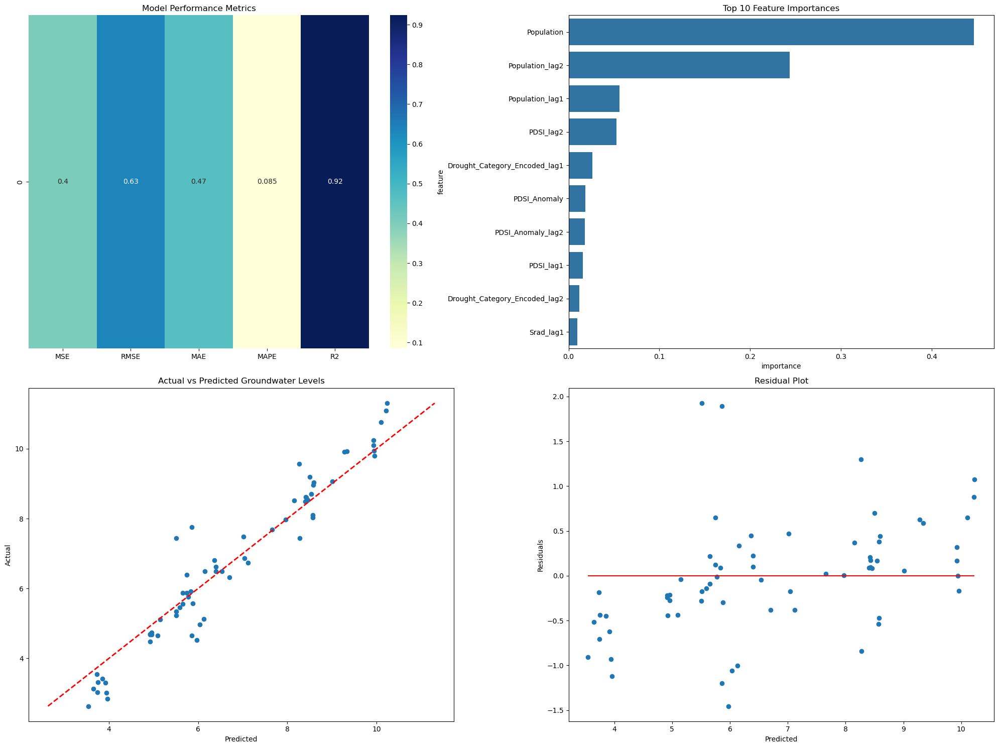

Evaluating Jaipur


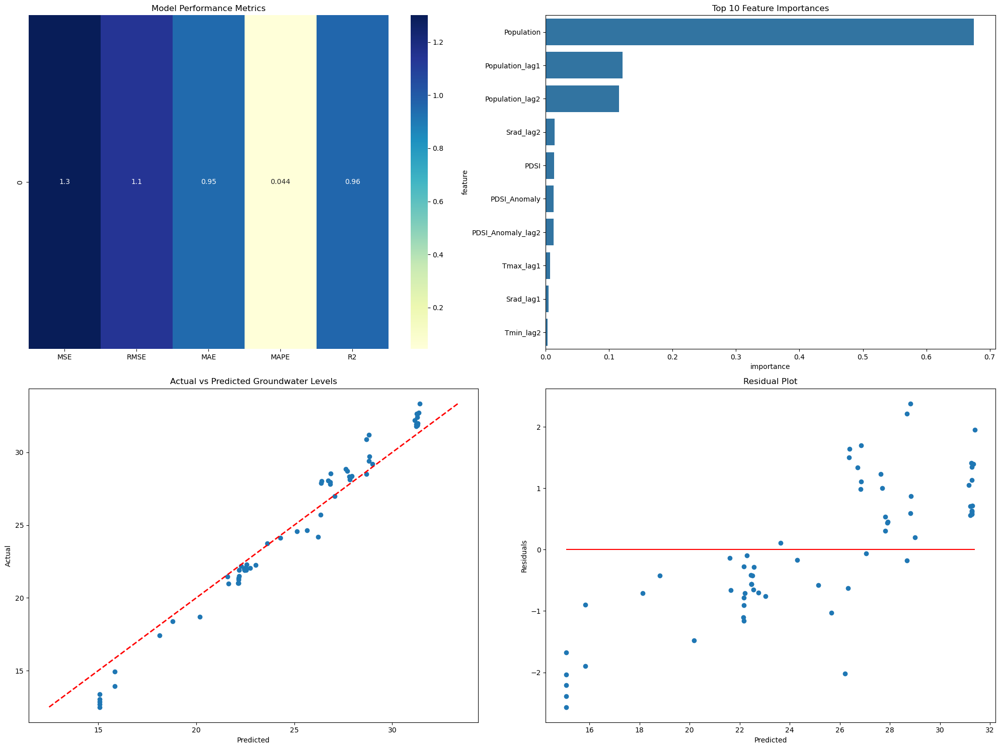

Evaluating Agra


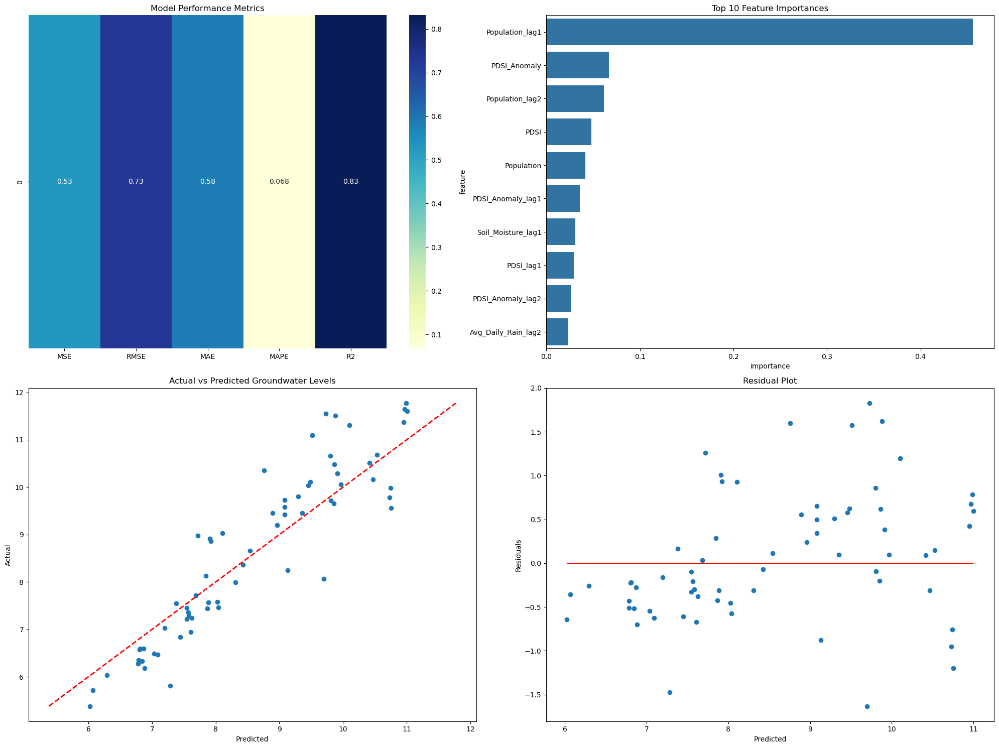

Evaluating Aligarh


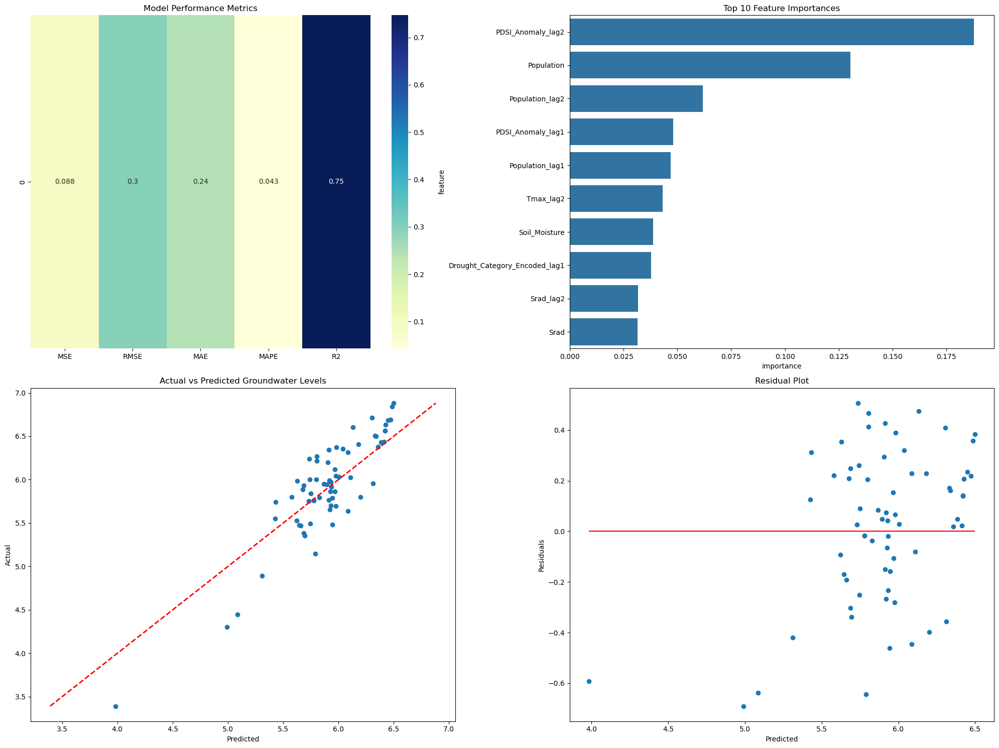

Evaluating Bareilly


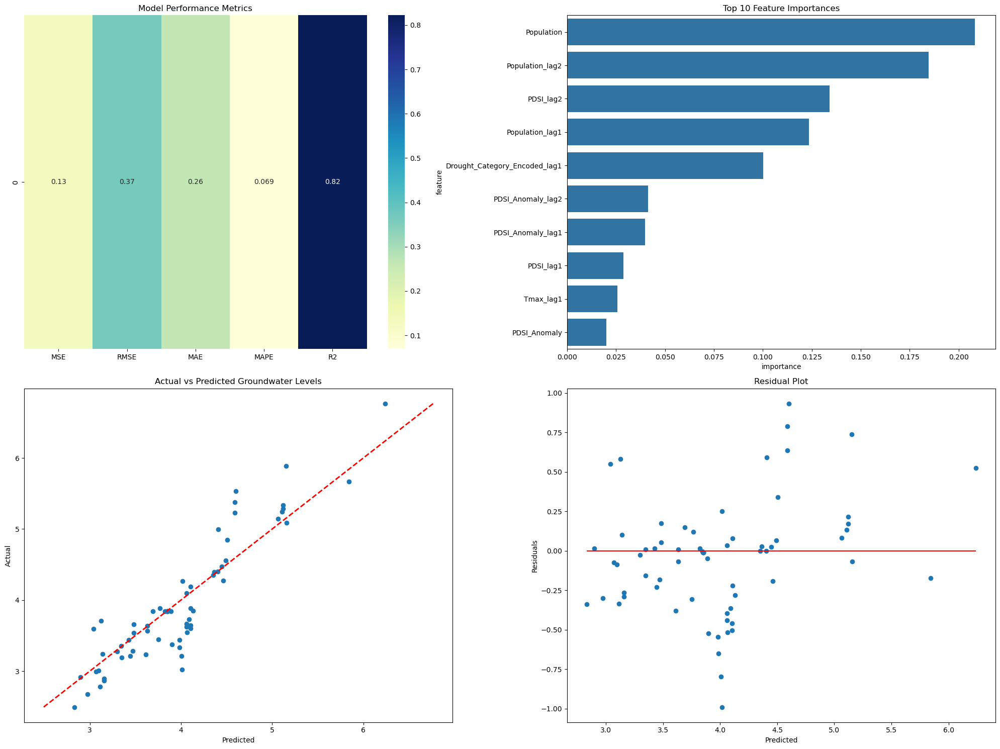

Evaluating Moradabad


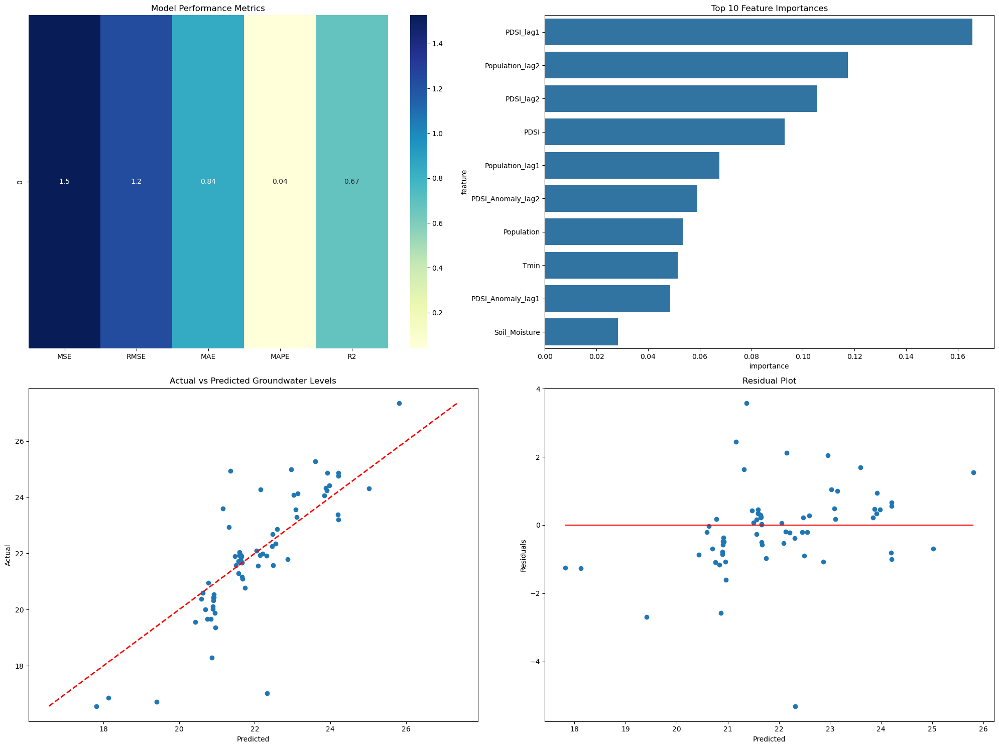

Evaluating Meerut


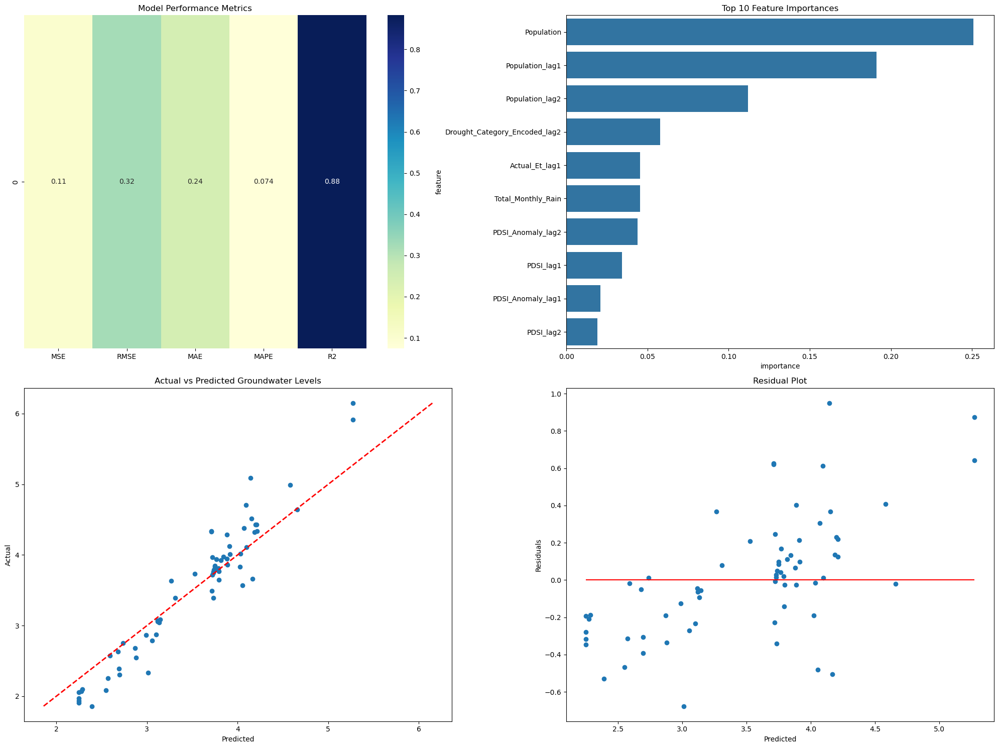

Evaluating Saharanpur


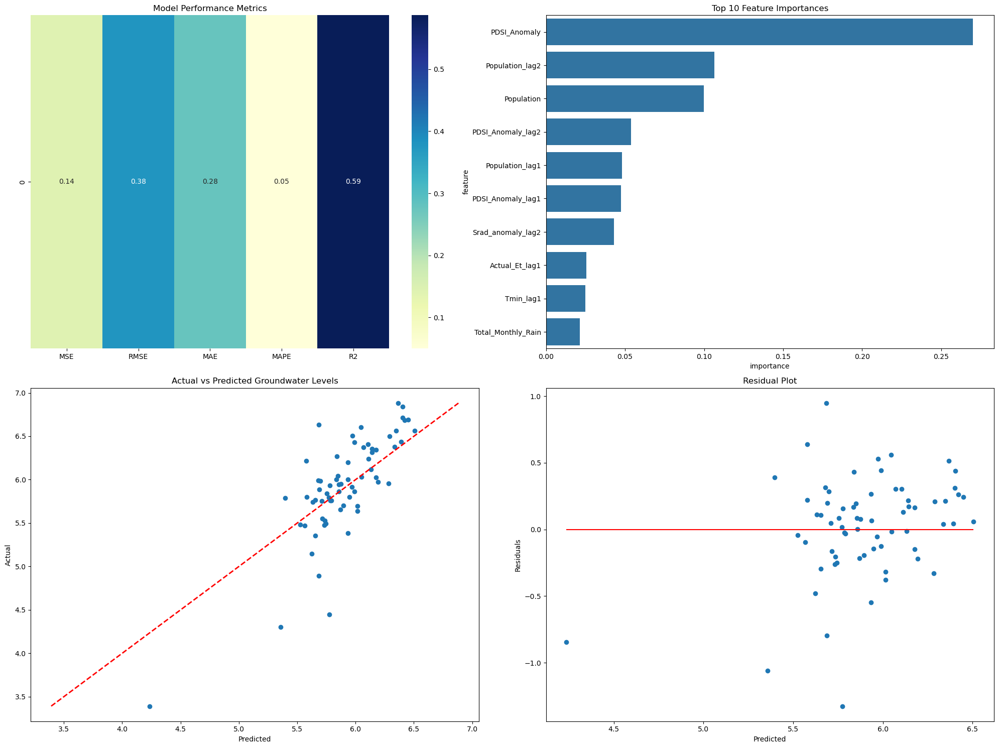

Evaluating Chandigarh


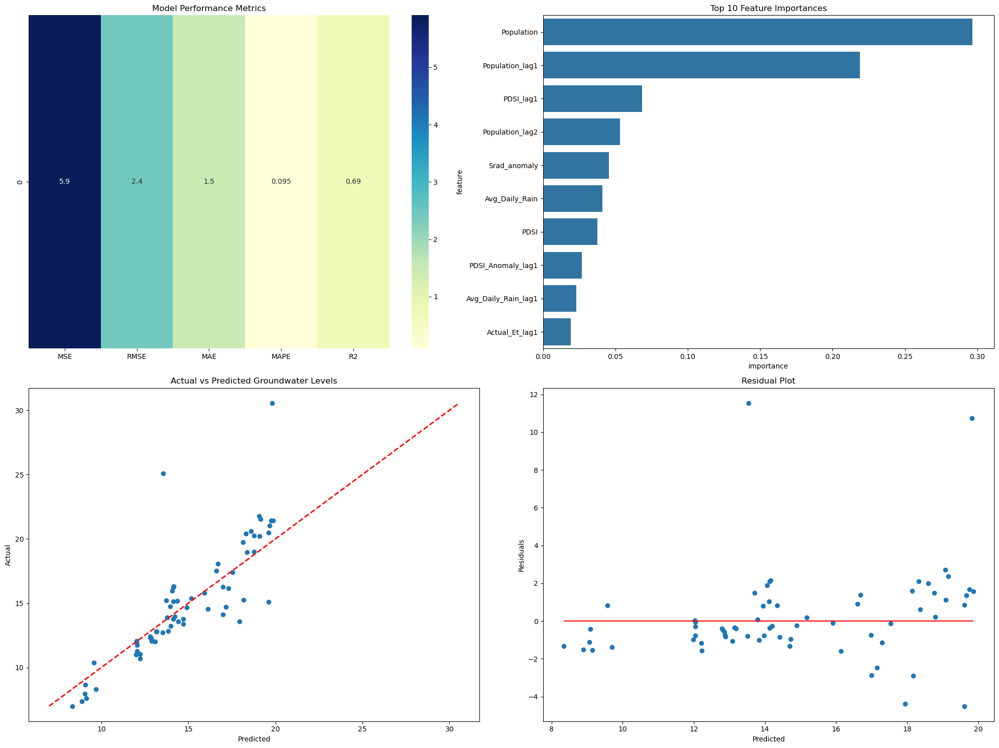

Evaluating Ludhiana


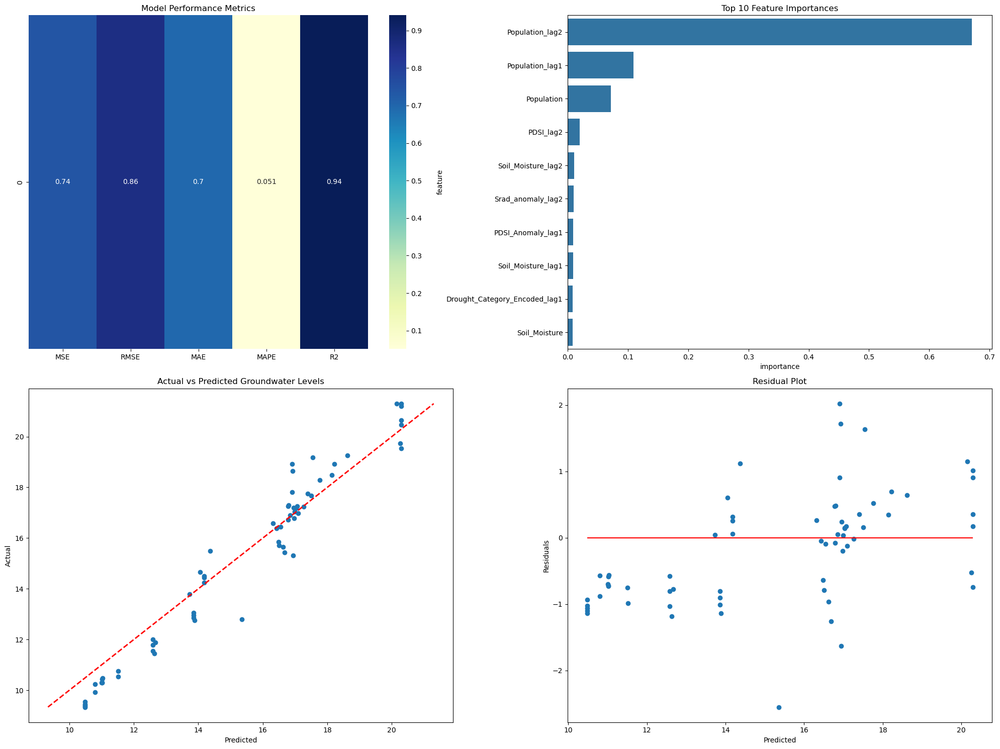

Evaluating Jalandhar


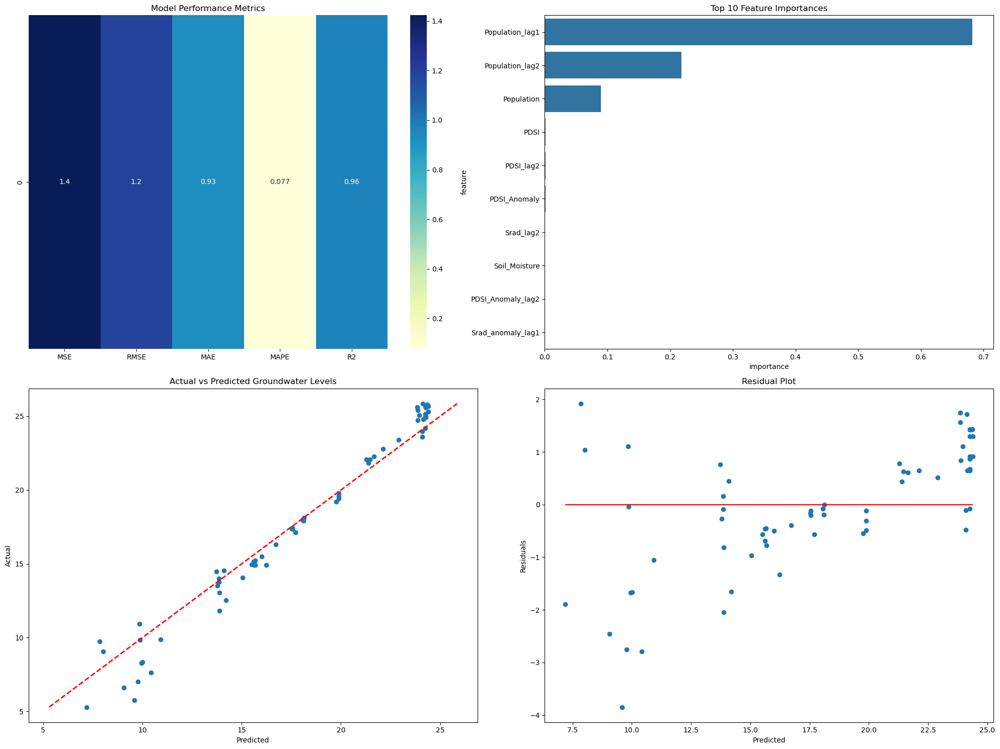

Evaluating Amritsar


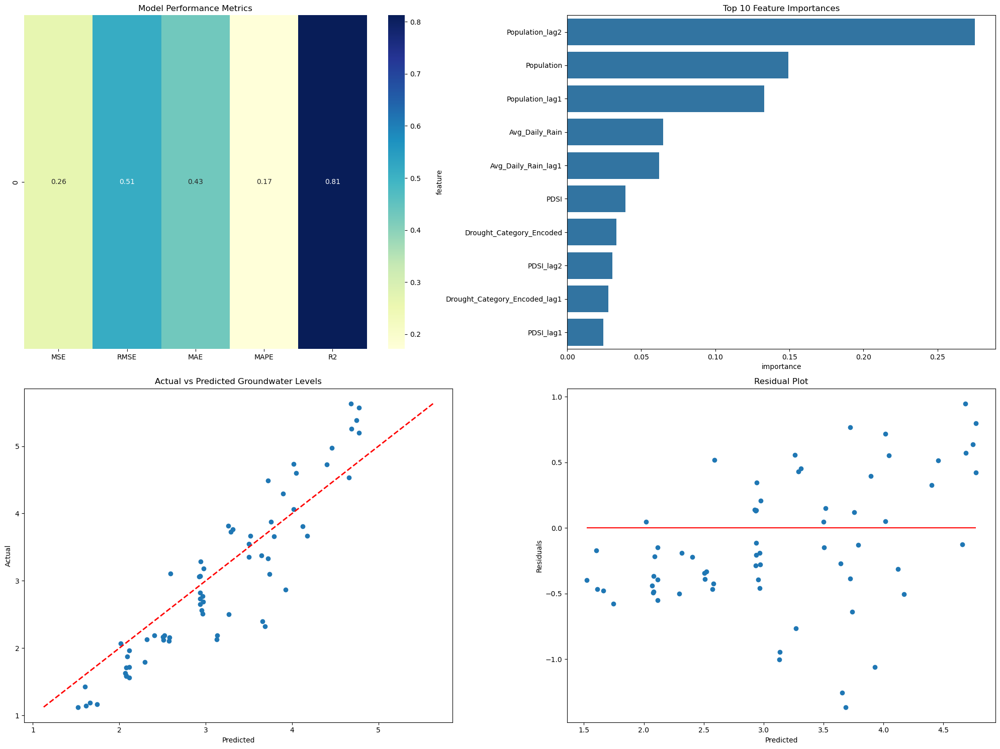

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, 
    r2_score, mean_absolute_percentage_error
)
import xgboost as xgb

class GroundwaterModelEvaluator:
    def __init__(self, file_path):
        self.data = pd.read_csv(file_path)
        self.cities = self.data['City'].unique()
    
    def prepare_city_data(self, city):
        city_data = self.data[self.data['City'] == city].copy()
        
        # Encode categorical variables
        le = LabelEncoder()
        city_data['Drought_Category_Encoded'] = le.fit_transform(city_data['Drought_Category'])
        
        # Feature selection
        features = [
            'Latitude', 'Longitude', 'Tmax', 'Tmin', 
            'Actual_Et', 'Avg_Daily_Rain', 'Total_Monthly_Rain', 
            'Soil_Moisture', 'PDSI', 'PDSI_Anomaly', 
            'Drought_Category_Encoded', 'Srad', 'Srad_anomaly', 
            'Population'
        ]
        
        # Create DataFrame with features and lagged features
        X = city_data[features].copy()
        for feature in features:
            X[f'{feature}_lag1'] = X[feature].shift(1)
            X[f'{feature}_lag2'] = X[feature].shift(2)
        
        # Remove NaN rows
        X.dropna(inplace=True)
        y = city_data.loc[X.index, 'Groundwater_Level']
        
        # Scaling
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        return X_scaled, y, X.columns
    
    def evaluate_model(self, city):
        # Prepare data
        X_scaled, y, feature_names = self.prepare_city_data(city)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42
        )
        
        # Train XGBoost model
        model = xgb.XGBRegressor(
            n_estimators=200, 
            learning_rate=0.01, 
            max_depth=5, 
            random_state=42
        )
        model.fit(X_train, y_train)
        
        # Predictions
        y_pred = model.predict(X_test)
        
        # Metrics
        metrics = {
            'MSE': mean_squared_error(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred),
            'MAPE': mean_absolute_percentage_error(y_test, y_pred),
            'R2': r2_score(y_test, y_pred)
        }
        
        return {
            'metrics': metrics,
            'model': model,
            'X_test': X_test,
            'y_test': y_test,
            'y_pred': y_pred,
            'feature_names': feature_names
        }
    
    def plot_results(self, results):
        # Create figure with multiple subplots
        plt.figure(figsize=(20, 15))
        
        # 1. Metrics Heatmap
        plt.subplot(2, 2, 1)
        metrics_df = pd.DataFrame([results['metrics']])
        sns.heatmap(metrics_df, annot=True, cmap='YlGnBu')
        plt.title('Model Performance Metrics')
        
        # 2. Feature Importance
        plt.subplot(2, 2, 2)
        feature_importances = results['model'].feature_importances_
        feature_importance_df = pd.DataFrame({
            'feature': results['feature_names'],
            'importance': feature_importances
        }).sort_values('importance', ascending=False).head(10)
        
        sns.barplot(x='importance', y='feature', data=feature_importance_df)
        plt.title('Top 10 Feature Importances')
        
        # 3. Actual vs Predicted
        plt.subplot(2, 2, 3)
        plt.scatter(results['y_pred'], results['y_test'])
        plt.plot([results['y_test'].min(), results['y_test'].max()], 
                 [results['y_test'].min(), results['y_test'].max()], 
                 'r--', lw=2)
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.title('Actual vs Predicted Groundwater Levels')
        
        # 4. Residual Plot
        plt.subplot(2, 2, 4)
        residuals = results['y_test'] - results['y_pred']
        plt.scatter(results['y_pred'], residuals)
        plt.hlines(y=0, xmin=results['y_pred'].min(), xmax=results['y_pred'].max(), color='r')
        plt.xlabel('Predicted')
        plt.ylabel('Residuals')
        plt.title('Residual Plot')
        
        plt.tight_layout()
        plt.show()

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
all_results = {}

# Evaluate for each city
for city in evaluator.cities:
    print(f"Evaluating {city}")
    results = evaluator.evaluate_model(city)
    evaluator.plot_results(results)
    all_results[city] = results

# Save comprehensive results
results_df = pd.DataFrame.from_dict(
    {city: results['metrics'] for city, results in all_results.items()}, 
    orient='index'
)
results_df.to_csv('groundwater_prediction_metrics_2.csv')

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, 
    r2_score, mean_absolute_percentage_error
)
import xgboost as xgb

class GroundwaterModelEvaluator:
    def __init__(self, file_path):
        self.data = pd.read_csv(file_path)
        self.cities = self.data['City'].unique()
    
    def prepare_city_data(self, city):
        city_data = self.data[self.data['City'] == city].copy()
        
        # Encode categorical variables
        le = LabelEncoder()
        city_data['Drought_Category_Encoded'] = le.fit_transform(city_data['Drought_Category'])
        
        # Feature selection
        features = [
            'Latitude', 'Longitude', 'Tmax', 'Tmin', 
            'Actual_Et', 'Avg_Daily_Rain', 'Total_Monthly_Rain', 
            'Soil_Moisture', 'PDSI', 'PDSI_Anomaly', 
            'Drought_Category_Encoded', 'Srad', 'Srad_anomaly', 
            'Population'
        ]
        
        # Create DataFrame with features and lagged features
        X = city_data[features].copy()
        for feature in features:
            X[f'{feature}_lag1'] = X[feature].shift(1)
            X[f'{feature}_lag2'] = X[feature].shift(2)
        
        # Remove NaN rows
        X.dropna(inplace=True)
        y = city_data.loc[X.index, 'Groundwater_Level']
        
        # Scaling
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        return X_scaled, y, X.columns
    
    def evaluate_model(self, city):
        # Prepare data
        X_scaled, y, feature_names = self.prepare_city_data(city)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42
        )
        
        # Train XGBoost model
        model = xgb.XGBRegressor(
            n_estimators=200, 
            learning_rate=0.01, 
            max_depth=5, 
            random_state=42
        )
        model.fit(X_train, y_train)
        
        # Predictions
        y_pred = model.predict(X_test)
        
        # Metrics
        metrics = {
            'MSE': mean_squared_error(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred),
            'MAPE': mean_absolute_percentage_error(y_test, y_pred),
            'R2': r2_score(y_test, y_pred)
        }
        
        return {
            'metrics': metrics,
            'model': model,
            'X_test': X_test,
            'y_test': y_test,
            'y_pred': y_pred,
            'feature_names': feature_names
        }
    
    def plot_results(self, results, city):
        # Create figure with multiple subplots
        plt.figure(figsize=(20, 15))
        
        # 1. Metrics Heatmap
        plt.subplot(2, 3, 1)
        metrics_df = pd.DataFrame([results['metrics']])
        sns.heatmap(metrics_df, annot=True, cmap='YlGnBu', cbar=False)
        plt.title(f'{city} - Model Performance Metrics')
        
        # 2. Feature Importance
        plt.subplot(2, 3, 2)
        feature_importances = results['model'].feature_importances_
        feature_importance_df = pd.DataFrame({
            'feature': results['feature_names'],
            'importance': feature_importances
        }).sort_values('importance', ascending=False).head(10)
        
        sns.barplot(x='importance', y='feature', data=feature_importance_df)
        plt.title(f'{city} - Top 10 Feature Importances')
        
        # 3. Actual vs Predicted
        plt.subplot(2, 3, 3)
        plt.scatter(results['y_pred'], results['y_test'])
        plt.plot([results['y_test'].min(), results['y_test'].max()], 
                 [results['y_test'].min(), results['y_test'].max()], 
                 'r--', lw=2)
        plt.xlabel('Predicted Groundwater Level')
        plt.ylabel('Actual Groundwater Level')
        plt.title(f'{city} - Actual vs Predicted')
        
        # 4. Residual Plot
        plt.subplot(2, 3, 4)
        residuals = results['y_test'] - results['y_pred']
        plt.scatter(results['y_pred'], residuals)
        plt.hlines(y=0, xmin=results['y_pred'].min(), xmax=results['y_pred'].max(), color='r')
        plt.xlabel('Predicted Groundwater Level')
        plt.ylabel('Residuals')
        plt.title(f'{city} - Residual Plot')
        
        # 5. Error Distribution
        plt.subplot(2, 3, 5)
        sns.histplot(residuals, kde=True)
        plt.xlabel('Prediction Error')
        plt.ylabel('Frequency')
        plt.title(f'{city} - Error Distribution')
        
        # 6. Predicted vs Residuals
        plt.subplot(2, 3, 6)
        sns.scatterplot(x=results['y_pred'], y=residuals)
        plt.xlabel('Predicted Groundwater Level')
        plt.ylabel('Residuals')
        plt.title(f'{city} - Predicted vs Residuals')
        
        plt.tight_layout()
        plt.savefig(f'{city}_performance_plots.png', dpi=300, bbox_inches='tight')
        plt.close()

    def create_performance_table(self, all_results):
        # Create a comprehensive performance table
        performance_data = []
        for city, results in all_results.items():
            metrics = results['metrics']
            performance_data.append({
                'City': city,
                'MSE': metrics['MSE'],
                'RMSE': metrics['RMSE'],
                'MAE': metrics['MAE'],
                'MAPE (%)': metrics['MAPE'] * 100,
                'R2': metrics['R2']
            })
        
        # Convert to DataFrame and save
        performance_df = pd.DataFrame(performance_data)
        performance_df.to_csv('groundwater_prediction_performance.csv', index=False)
        
        # Create a formatted LaTeX table for easy insertion into papers
        latex_table = performance_df.to_latex(
            index=False, 
            float_format='{:.4f}'.format,
            caption='Groundwater Level Prediction Performance Metrics',
            label='tab:groundwater_performance'
        )
        
        with open('groundwater_performance_table.tex', 'w') as f:
            f.write(latex_table)
        
        return performance_df

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
all_results = {}

# Evaluate for each city
for city in evaluator.cities:
    print(f"Evaluating {city}")
    results = evaluator.evaluate_model(city)
    evaluator.plot_results(results, city)
    all_results[city] = results

# Create comprehensive performance table
performance_summary = evaluator.create_performance_table(all_results)
print(performance_summary)

Evaluating Thiruvananthapuram
Evaluating Kollam
Evaluating Madurai
Evaluating Kochi (Cochin)
Evaluating Thrissur
Evaluating Coimbatore
Evaluating Malappuram
Evaluating Tiruppur
Evaluating Kozhikode (Calicut)
Evaluating Salem
Evaluating Mysore
Evaluating Bengaluru
Evaluating Chennai (Madras)
Evaluating Hubli-Dharwad
Evaluating Hyderabad
Evaluating Warangal
Evaluating Pune (Poona)
Evaluating Mumbai
Evaluating Aurangabad
Evaluating Nashik
Evaluating Bhubaneswar
Evaluating Nagpur
Evaluating Surat
Evaluating Durg-Bhilainagar
Evaluating Raipur
Evaluating Rajkot
Evaluating Vadodara
Evaluating Kolkata
Evaluating Indore
Evaluating Jamshedpur
Evaluating Jabalpur
Evaluating Bhopal
Evaluating Ranchi
Evaluating Asansol
Evaluating Dhanbad
Evaluating Kota
Evaluating Varanasi (Benares)
Evaluating Patna
Evaluating Guwahati (Gauhati)
Evaluating Gwalior
Evaluating Jodhpur
Evaluating Kanpur
Evaluating Lucknow
Evaluating Jaipur
Evaluating Agra
Evaluating Aligarh
Evaluating Bareilly
Evaluating Moradabad
Eva

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, 
    r2_score, mean_absolute_percentage_error
)
import xgboost as xgb

class GroundwaterModelEvaluator:
    def __init__(self, file_path):
        self.data = pd.read_csv(file_path)
        self.cities = self.data['City'].unique()
    
    def prepare_city_data(self, city):
        city_data = self.data[self.data['City'] == city].copy()
        
        # Encode categorical variables
        le = LabelEncoder()
        city_data['Drought_Category_Encoded'] = le.fit_transform(city_data['Drought_Category'])
        
        # Feature selection
        features = [
            'Latitude', 'Longitude', 'Tmax', 'Tmin', 
            'Actual_Et', 'Avg_Daily_Rain', 'Total_Monthly_Rain', 
            'Soil_Moisture', 'PDSI', 'PDSI_Anomaly', 
            'Drought_Category_Encoded', 'Srad', 'Srad_anomaly', 
            'Population'
        ]
        
        # Create DataFrame with features and lagged features
        X = city_data[features].copy()
        for feature in features:
            X[f'{feature}_lag1'] = X[feature].shift(1)
            X[f'{feature}_lag2'] = X[feature].shift(2)
        
        # Remove NaN rows
        X.dropna(inplace=True)
        y = city_data.loc[X.index, 'Groundwater_Level']
        
        # Scaling
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        return X_scaled, y, X.columns
    
    def evaluate_model(self, city):
        # Prepare data
        X_scaled, y, feature_names = self.prepare_city_data(city)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42
        )
        
        # Train XGBoost model
        model = xgb.XGBRegressor(
            n_estimators=200, 
            learning_rate=0.01, 
            max_depth=5, 
            random_state=42
        )
        model.fit(X_train, y_train)
        
        # Predictions
        y_pred = model.predict(X_test)
        
        # Metrics
        metrics = {
            'MSE': mean_squared_error(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred),
            'MAPE': mean_absolute_percentage_error(y_test, y_pred),
            'R2': r2_score(y_test, y_pred)
        }
        
        return {
            'metrics': metrics,
            'model': model,
            'X_test': X_test,
            'y_test': y_test,
            'y_pred': y_pred,
            'feature_names': feature_names
        }
    
    def create_comprehensive_plots(self, all_results):
        # Create a large figure for supplementary materials
        num_cities = len(all_results)
        rows = (num_cities + 3) // 4  # Ensure enough rows to fit all cities
        
        plt.figure(figsize=(20, 5 * rows))
        
        # Metrics summary
        results_df = pd.DataFrame.from_dict(
            {city: results['metrics'] for city, results in all_results.items()}, 
            orient='index'
        )
        
        # 1. Overall Metrics Heatmap (Main Plot 1)
        plt.figure(figsize=(12, 8))
        sns.heatmap(results_df, annot=True, cmap='YlGnBu')
        plt.title('City-wise Model Performance Metrics')
        plt.tight_layout()
        plt.savefig('main_plot_1_metrics_heatmap.png')
        plt.close()
        
        # 2. Boxplot of Performance Metrics (Main Plot 2)
        plt.figure(figsize=(12, 8))
        results_df.boxplot()
        plt.title('Distribution of Model Performance Metrics Across Cities')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.savefig('main_plot_2_metrics_boxplot.png')
        plt.close()
        
        # 3. Supplementary Plots (Detailed City-wise Analysis)
        plt.figure(figsize=(20, 5 * rows))
        for i, (city, results) in enumerate(all_results.items(), 1):
            plt.subplot(rows, 4, i)
            
            # Actual vs Predicted
            plt.scatter(results['y_pred'], results['y_test'], alpha=0.7)
            plt.plot([results['y_test'].min(), results['y_test'].max()], 
                     [results['y_test'].min(), results['y_test'].max()], 
                     'r--', lw=2)
            plt.xlabel('Predicted')
            plt.ylabel('Actual')
            plt.title(f'{city} - Actual vs Predicted')
        
        plt.tight_layout()
        plt.savefig('supplementary_city_plots.png')
        plt.close()
        
        # 4. Create a detailed results table
        results_table = results_df.round(4)
        results_table.to_csv('groundwater_prediction_metrics.csv')
        
        return results_df

    def plot_detailed_city_results(self, results, city):
        # Create figure with multiple subplots
        plt.figure(figsize=(20, 15))
        
        # 1. Metrics Heatmap
        plt.subplot(2, 2, 1)
        metrics_df = pd.DataFrame([results['metrics']])
        sns.heatmap(metrics_df, annot=True, cmap='YlGnBu')
        plt.title(f'{city} - Model Performance Metrics')
        
        # 2. Feature Importance
        plt.subplot(2, 2, 2)
        feature_importances = results['model'].feature_importances_
        feature_importance_df = pd.DataFrame({
            'feature': results['feature_names'],
            'importance': feature_importances
        }).sort_values('importance', ascending=False).head(10)
        
        sns.barplot(x='importance', y='feature', data=feature_importance_df)
        plt.title(f'{city} - Top 10 Feature Importances')
        
        # 3. Actual vs Predicted
        plt.subplot(2, 2, 3)
        plt.scatter(results['y_pred'], results['y_test'])
        plt.plot([results['y_test'].min(), results['y_test'].max()], 
                 [results['y_test'].min(), results['y_test'].max()], 
                 'r--', lw=2)
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.title(f'{city} - Actual vs Predicted Groundwater Levels')
        
        # 4. Residual Plot
        plt.subplot(2, 2, 4)
        residuals = results['y_test'] - results['y_pred']
        plt.scatter(results['y_pred'], residuals)
        plt.hlines(y=0, xmin=results['y_pred'].min(), xmax=results['y_pred'].max(), color='r')
        plt.xlabel('Predicted')
        plt.ylabel('Residuals')
        plt.title(f'{city} - Residual Plot')
        
        plt.tight_layout()
        plt.savefig(f'{city}_detailed_analysis.png')
        plt.close()

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
all_results = {}

# Evaluate for each city
for city in evaluator.cities:
    print(f"Evaluating {city}")
    results = evaluator.evaluate_model(city)
    evaluator.plot_detailed_city_results(results, city)
    all_results[city] = results

# Create comprehensive plots and save results
comprehensive_results = evaluator.create_comprehensive_plots(all_results)
print("Analysis complete. Check the generated image and CSV files.")

Evaluating Thiruvananthapuram
Evaluating Kollam
Evaluating Madurai
Evaluating Kochi (Cochin)
Evaluating Thrissur
Evaluating Coimbatore
Evaluating Malappuram
Evaluating Tiruppur
Evaluating Kozhikode (Calicut)
Evaluating Salem
Evaluating Mysore
Evaluating Bengaluru
Evaluating Chennai (Madras)
Evaluating Hubli-Dharwad
Evaluating Hyderabad
Evaluating Warangal
Evaluating Pune (Poona)
Evaluating Mumbai
Evaluating Aurangabad
Evaluating Nashik
Evaluating Bhubaneswar
Evaluating Nagpur
Evaluating Surat
Evaluating Durg-Bhilainagar
Evaluating Raipur
Evaluating Rajkot
Evaluating Vadodara
Evaluating Kolkata
Evaluating Indore
Evaluating Jamshedpur
Evaluating Jabalpur
Evaluating Bhopal
Evaluating Ranchi
Evaluating Asansol
Evaluating Dhanbad
Evaluating Kota
Evaluating Varanasi (Benares)
Evaluating Patna
Evaluating Guwahati (Gauhati)
Evaluating Gwalior
Evaluating Jodhpur
Evaluating Kanpur
Evaluating Lucknow
Evaluating Jaipur
Evaluating Agra
Evaluating Aligarh
Evaluating Bareilly
Evaluating Moradabad
Eva

<Figure size 2000x7000 with 0 Axes>

Advanced visualizations have been created successfully.


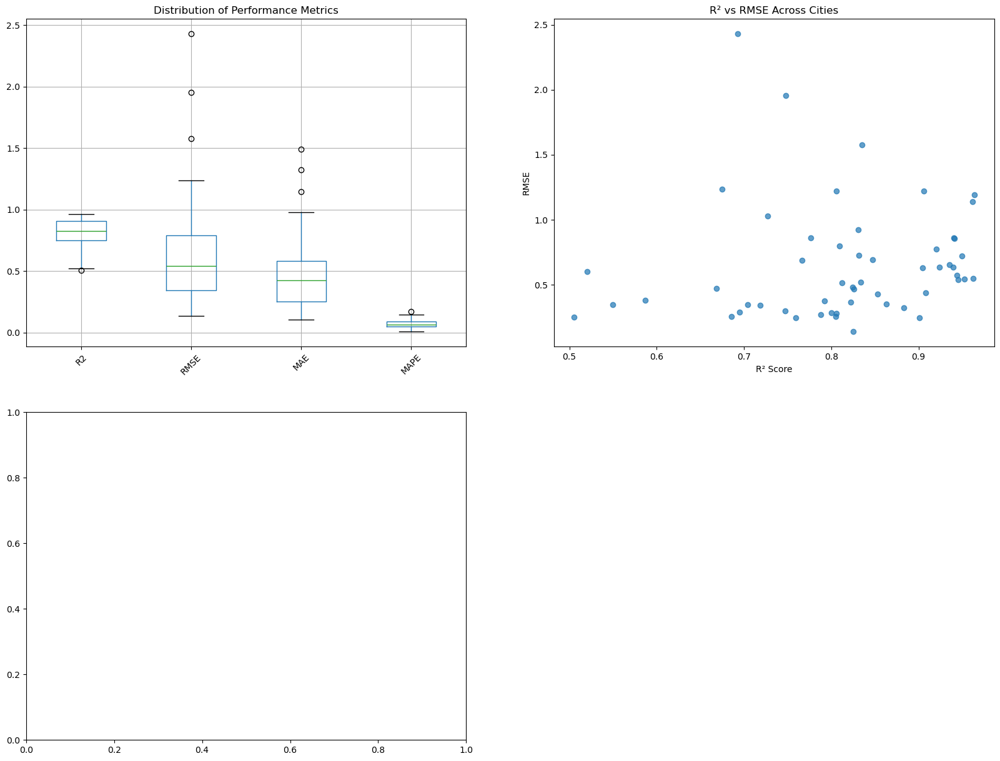

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

def create_advanced_visualizations(results_df):
    # 1. Main Plot: Radar Chart of Performance Metrics
    plt.figure(figsize=(16, 10))
    
    # Normalize metrics for radar chart
    metrics_to_plot = ['R2', 'RMSE', 'MAE', 'MAPE']
    normalized_df = results_df[metrics_to_plot].copy()
    
    # Normalize each metric
    for metric in metrics_to_plot:
        if metric == 'R2':
            normalized_df[metric] = (normalized_df[metric] - normalized_df[metric].min()) / (normalized_df[metric].max() - normalized_df[metric].min())
        else:
            normalized_df[metric] = 1 - (normalized_df[metric] - normalized_df[metric].min()) / (normalized_df[metric].max() - normalized_df[metric].min())
    
    # Radar Chart
    angles = np.linspace(0, 2*np.pi, len(metrics_to_plot), endpoint=False)
    angles = np.concatenate((angles, [angles[0]]))
    
    plt.subplot(polar=True)
    plt.title('Comprehensive Model Performance Radar Chart', fontsize=15, pad=20)
    
    # Plot each city
    for i, (city, row) in enumerate(normalized_df.iterrows()):
        values = row[metrics_to_plot].tolist()
        values += [values[0]]
        plt.plot(angles, values, linewidth=1, linestyle='solid', label=city)
        plt.fill(angles, values, alpha=0.1)
    
    plt.thetagrids(angles[:-1] * 180/np.pi, metrics_to_plot)
    plt.legend(bbox_to_anchor=(1.2, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig('main_plot_radar_chart.png')
    plt.close()
    
    # 2. Supplementary Visualizations
    # Create multiple subplots for different metric distributions
    plt.figure(figsize=(20, 15))
    
    # 2.1 Box Plot of Performance Metrics
    plt.subplot(2, 2, 1)
    results_df[['R2', 'RMSE', 'MAE', 'MAPE']].boxplot()
    plt.title('Distribution of Performance Metrics')
    plt.xticks(rotation=45)
    
    # 2.2 Scatter Plot of R2 vs RMSE
    plt.subplot(2, 2, 2)
    plt.scatter(results_df['R2'], results_df['RMSE'], alpha=0.7)
    plt.xlabel('R² Score')
    plt.ylabel('RMSE')
    plt.title('R² vs RMSE Across Cities')
    
    # 2.3 Kernel Density Estimation of Metrics
    plt.subplot(2, 2, 3)
    results_df[['R2', 'RMSE', 'MAE', 'MAPE']].plot(kind='kde')
    plt.title('Kernel Density Estimation of Metrics')
    plt.xlabel('Metric Value')
    
    # 2.4 Correlation Heatmap of Metrics
    plt.subplot(2, 2, 4)
    correlation = results_df[['R2', 'RMSE', 'MAE', 'MAPE']].corr()
    sns.heatmap(correlation, annot=True, cmap='coolwarm', center=0)
    plt.title('Correlation Between Performance Metrics')
    
    plt.tight_layout()
    plt.savefig('supplementary_performance_analysis.png')
    plt.close()
    
    # 3. Detailed City-wise Performance Visualization
    # Organize cities in groups
    num_cities = len(results_df)
    rows = (num_cities + 3) // 4
    
    plt.figure(figsize=(20, 5 * rows))
    
    for i, (city, row) in enumerate(results_df.iterrows(), 1):
        plt.subplot(rows, 4, i)
        
        # Create a bar plot for each city's metrics
        metrics = ['R2', 'RMSE', 'MAE', 'MAPE']
        values = [row[metric] for metric in metrics]
        
        plt.bar(metrics, values)
        plt.title(city)
        plt.ylim(0, max(values) * 1.2)
        plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.savefig('detailed_city_performance.png')
    plt.close()
    
    return results_df

# Load the results
results_data = pd.read_csv('groundwater_prediction_metrics.csv', index_col=0)

# Create advanced visualizations
create_advanced_visualizations(results_data)
print("Advanced visualizations have been created successfully.")

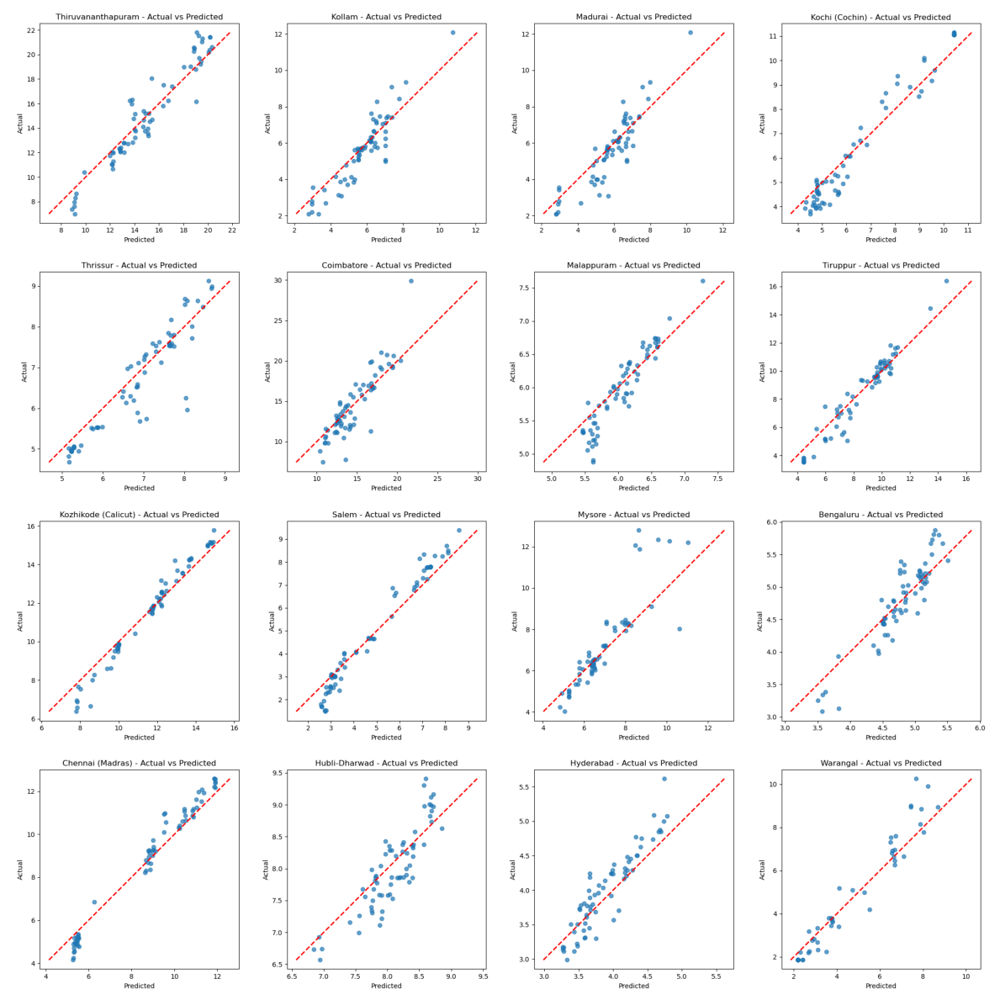

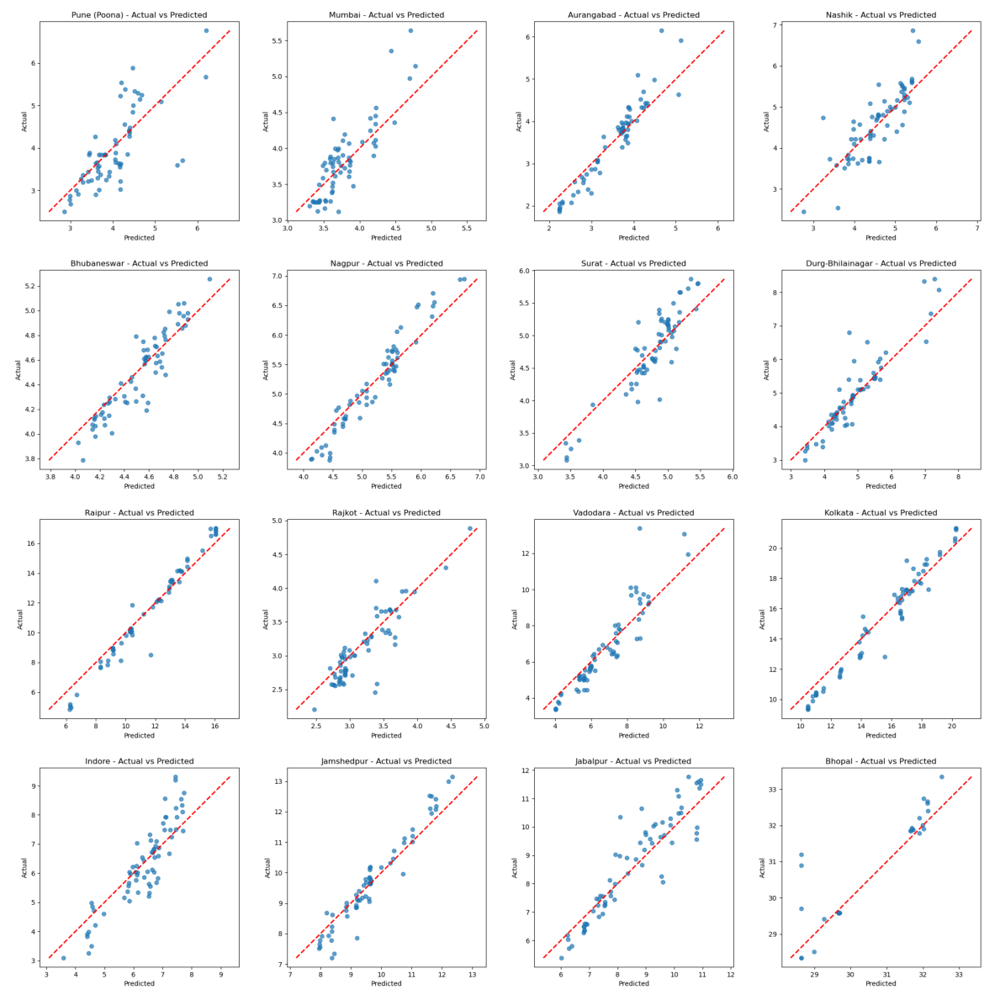

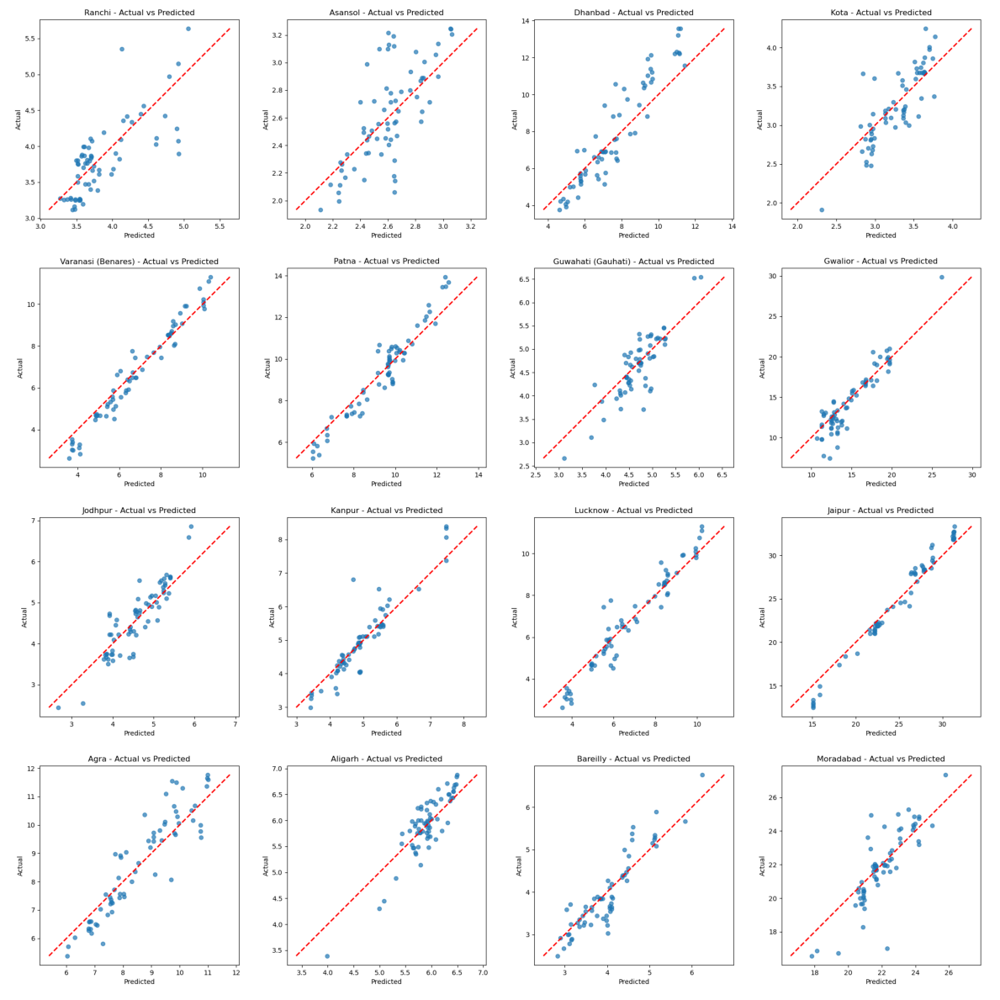

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Load the original image
image_path = "supplementary_city_plots.png"
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for correct display

# Define original grid size and target grid size
original_rows, original_cols = 14, 4  # Your current layout
target_rows, target_cols = 4, 4  # Desired layout

# Get image dimensions
img_height, img_width, _ = img.shape

# Compute the size of each subplot
subplot_height = img_height // original_rows
subplot_width = img_width // original_cols

# Loop to extract and save each 4 × 4 grid chunk
num_new_plots = (original_rows // target_rows)  # Number of new images

for i in range(num_new_plots):
    fig, axes = plt.subplots(target_rows, target_cols, figsize=(12, 12))
    
    for r in range(target_rows):
        for c in range(target_cols):
            # Calculate the corresponding subplot in the original image
            orig_r = i * target_rows + r
            orig_c = c

            if orig_r < original_rows and orig_c < original_cols:
                # Extract the corresponding section
                y1, y2 = orig_r * subplot_height, (orig_r + 1) * subplot_height
                x1, x2 = orig_c * subplot_width, (orig_c + 1) * subplot_width
                axes[r, c].imshow(img[y1:y2, x1:x2])
                axes[r, c].axis("off")
    
    plt.tight_layout()
    plt.show()  # Show the plots


In [13]:
!pip install opencv-python
!pip install opencv-python-headless


   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.5 MB 640.0 kB/s eta 0:01:02
   ---------------------------------------- 0.1/39.5 MB 1.1 MB/s eta 0:00:38
   ---------------------------------------- 0.1/39.5 MB 1.1 MB/s eta 0:00:37
   ---------------------------------------- 0.2/39.5 MB 1.0 MB/s eta 0:00:39
   ---------------------------------------- 0.2/39.5 MB 1.0 MB/s eta 0:00:39
   ---------------------------------------- 0.2/39.5 MB 1.0 MB/s eta 0:00:39
   ---------------------------------------- 0.2/39.5 MB 1.0 MB/s eta 0:00:39
   ---------------------------------------- 0.2/39.5 MB 1.0 MB/s eta 0:00:39
   ---------------------------------------- 0.2/39.5 MB 1.0 MB/s eta 0:00:39
   ---------------------------------------- 0.2/39.5 MB 1.0 MB/s eta 0:00:39
   ---------------------------------------- 0.2/39.5 MB 1.0 MB/s eta 0:00:39
   ---------------------------------------- 0.2/39.5 MB 1.0 MB/s eta 0:00:39
   -

In [17]:
import cv2
import numpy as np
import os

# Load the original image
image_path = "supplementary_city_plots.png"
image = cv2.imread(image_path)

# Get image dimensions
height, width, _ = image.shape

# Define the new grid size (4x4 subplots)
rows, cols = 4, 4

# Calculate size of each new subplot
new_height = height // (14 // rows)  # Dividing original 14-row layout into 4 rows
new_width = width // (4 // cols)  # Keeping the 4-column layout

# Create a directory to store the new subplots
output_dir = "split_plots"
os.makedirs(output_dir, exist_ok=True)

# Split and save images
counter = 1
for i in range(0, height, new_height):
    for j in range(0, width, new_width):
        if i + new_height <= height and j + new_width <= width:
            sub_img = image[i:i + new_height, j:j + new_width]
            output_path = os.path.join(output_dir, f"subplot_{counter}.png")
            cv2.imwrite(output_path, sub_img)
            counter += 1

print(f"Subplots saved in '{output_dir}' directory.")


Subplots saved in 'split_plots' directory.


In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import xgboost as xgb

def calculate_sensitivity_specificity(y_true, y_pred, thresholds):
    """
    Calculate sensitivity, specificity, and accuracy for different thresholds
    
    Parameters:
    - y_true: Actual groundwater levels
    - y_pred: Predicted groundwater levels
    - thresholds: List of threshold values to convert regression to binary classification
    
    Returns:
    - DataFrame with metrics for each threshold
    """
    results = []
    
    for threshold in thresholds:
        # Convert to binary classification
        y_true_binary = (y_true > threshold).astype(int)
        y_pred_binary = (y_pred > threshold).astype(int)
        
        # Compute confusion matrix safely
        cm = confusion_matrix(y_true_binary, y_pred_binary)
        
        # Handle different confusion matrix shapes
        if cm.size == 1:
            # If all predictions are the same
            tn, fp, fn, tp = 0, 0, 0, cm[0,0]
        elif cm.shape == (2,2):
            tn, fp, fn, tp = cm.ravel()
        else:
            # Fallback to zeros if unexpected matrix
            tn, fp, fn, tp = 0, 0, 0, 0
        
        # Calculate metrics with safe division
        sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0
        
        results.append({
            'Threshold': threshold,
            'Sensitivity': sensitivity,
            'Specificity': specificity,
            'Accuracy': accuracy
        })
    
    return pd.DataFrame(results)

def plot_sensitivity_specificity(all_results):
    # Collect metrics for all cities
    all_metrics = []
    
    # Prepare thresholds
    thresholds = np.linspace(0.1, 0.9, 9)
    
    for city, results in all_results.items():
        try:
            # Prepare metrics calculation
            y_true = results['y_test']
            y_pred = results['y_pred']
            
            # Calculate metrics for different thresholds
            city_metrics = calculate_sensitivity_specificity(y_true, y_pred, thresholds)
            city_metrics['City'] = city
            all_metrics.append(city_metrics)
        except Exception as e:
            print(f"Error processing {city}: {e}")
    
    # Combine all city metrics
    combined_metrics = pd.concat(all_metrics)
    
    # Visualization
    plt.figure(figsize=(20, 15))
    
    # 1. Overall Sensitivity, Specificity, and Accuracy Across Cities
    plt.subplot(2, 2, 1)
    grouped_metrics = combined_metrics.groupby('Threshold')[['Sensitivity', 'Specificity', 'Accuracy']].mean()
    grouped_metrics.plot(ax=plt.gca())
    plt.title('Average Sensitivity, Specificity, and Accuracy')
    plt.xlabel('Threshold')
    plt.ylabel('Metric Value')
    
    # 2. Box Plot of Metrics Across Cities
    plt.subplot(2, 2, 2)
    metrics_boxplot = combined_metrics.groupby('City')[['Sensitivity', 'Specificity', 'Accuracy']].mean()
    metrics_boxplot.boxplot()
    plt.title('Distribution of Metrics Across Cities')
    plt.xticks(rotation=45)
    
    # 3. Heatmap of Metrics
    plt.subplot(2, 2, 3)
    metrics_heatmap = combined_metrics.groupby('City')[['Sensitivity', 'Specificity', 'Accuracy']].mean()
    sns.heatmap(metrics_heatmap, annot=True, cmap='YlGnBu')
    plt.title('Metrics Heatmap Across Cities')
    
    # 4. ROC-like Curve
    plt.subplot(2, 2, 4)
    for city in combined_metrics['City'].unique():
        city_data = combined_metrics[combined_metrics['City'] == city]
        plt.plot(1 - city_data['Specificity'], city_data['Sensitivity'], label=city)
    
    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
    plt.xlabel('1 - Specificity')
    plt.ylabel('Sensitivity')
    plt.title('Sensitivity vs 1 - Specificity')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.savefig('sensitivity_specificity_analysis.png')
    plt.close()
    
    # Save combined metrics
    combined_metrics.to_csv('sensitivity_specificity_metrics.csv', index=False)
    
    return combined_metrics

# Existing Groundwater Model Evaluator class remains the same as in previous implementation

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
all_results = {}

# Evaluate for each city
for city in evaluator.cities:
    print(f"Evaluating {city}")
    results = evaluator.evaluate_model(city)
    all_results[city] = results

# Plot sensitivity and specificity
try:
    plot_results = plot_sensitivity_specificity(all_results)
    print("Sensitivity and Specificity analysis complete.")
except Exception as e:
    print(f"Error in analysis: {e}")

Evaluating Thiruvananthapuram
Evaluating Kollam
Evaluating Madurai
Evaluating Kochi (Cochin)
Evaluating Thrissur
Evaluating Coimbatore
Evaluating Malappuram
Evaluating Tiruppur
Evaluating Kozhikode (Calicut)
Evaluating Salem
Evaluating Mysore
Evaluating Bengaluru
Evaluating Chennai (Madras)
Evaluating Hubli-Dharwad
Evaluating Hyderabad
Evaluating Warangal
Evaluating Pune (Poona)
Evaluating Mumbai
Evaluating Aurangabad
Evaluating Nashik
Evaluating Bhubaneswar
Evaluating Nagpur
Evaluating Surat
Evaluating Durg-Bhilainagar
Evaluating Raipur
Evaluating Rajkot
Evaluating Vadodara
Evaluating Kolkata
Evaluating Indore
Evaluating Jamshedpur
Evaluating Jabalpur
Evaluating Bhopal
Evaluating Ranchi
Evaluating Asansol
Evaluating Dhanbad
Evaluating Kota
Evaluating Varanasi (Benares)
Evaluating Patna
Evaluating Guwahati (Gauhati)
Evaluating Gwalior
Evaluating Jodhpur
Evaluating Kanpur
Evaluating Lucknow
Evaluating Jaipur
Evaluating Agra
Evaluating Aligarh
Evaluating Bareilly
Evaluating Moradabad
Eva

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

def calculate_metrics(y_true, y_pred):
    """
    Calculate sensitivity, specificity, and accuracy
    
    Parameters:
    - y_true: Actual groundwater levels
    - y_pred: Predicted groundwater levels
    
    Returns:
    - Dictionary of metrics
    """
    # Calculate median as threshold
    threshold = np.median(y_true)
    
    # Convert to binary classification
    y_true_binary = (y_true > threshold).astype(int)
    y_pred_binary = (y_pred > threshold).astype(int)
    
    # Compute confusion matrix
    cm = confusion_matrix(y_true_binary, y_pred_binary)
    
    # Handle different confusion matrix sizes
    if cm.size == 1:
        tn, fp, fn, tp = 0, 0, 0, 0
    elif cm.size == 4:
        tn, fp, fn, tp = cm.ravel()
    else:
        raise ValueError("Unexpected confusion matrix size")
    
    # Calculate metrics
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0
    
    return {
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'Accuracy': accuracy
    }

def plot_performance_metrics(all_results):
    # Prepare metrics for all cities
    metrics_data = []
    
    for city, results in all_results.items():
        # Calculate metrics
        metrics = calculate_metrics(results['y_test'], results['y_pred'])
        metrics['City'] = city
        metrics_data.append(metrics)
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame(metrics_data)
    
    # Create a single comprehensive plot
    plt.figure(figsize=(12, 6))
    
    # Box plot of metrics
    metrics_to_plot = ['Sensitivity', 'Specificity', 'Accuracy']
    
    # Create box plot
    box_plot = plt.boxplot(
        [metrics_df[metric] for metric in metrics_to_plot], 
        labels=metrics_to_plot,
        patch_artist=True
    )
    
    # Color the boxes
    colors = ['lightblue', 'lightgreen', 'lightpink']
    for patch, color in zip(box_plot['boxes'], colors):
        patch.set_facecolor(color)
    
    plt.title('Model Performance Metrics Across Cities', fontsize=16)
    plt.ylabel('Metric Value', fontsize=12)
    plt.ylim(0, 1)  # Set y-axis from 0 to 1
    
    # Add individual data points
    for i, metric in enumerate(metrics_to_plot, 1):
        # Scatter plot of individual city values
        y = metrics_df[metric]
        x = np.random.normal(i, 0.04, len(y))
        plt.scatter(x, y, alpha=0.5, color='red', s=20)
    
    plt.tight_layout()
    plt.savefig('performance_metrics_boxplot.png')
    plt.close()
    
    # Save metrics to CSV
    metrics_df.to_csv('performance_metrics.csv', index=False)
    
    return metrics_df

# Usage in the existing script
evaluator = GroundwaterModelEvaluator('final for code.csv')
all_results = {}

# Evaluate for each city
for city in evaluator.cities:
    print(f"Evaluating {city}")
    results = evaluator.evaluate_model(city)
    all_results[city] = results

# Plot performance metrics
plot_results = plot_performance_metrics(all_results)
print("Performance metrics analysis complete.")

Evaluating Thiruvananthapuram
Evaluating Kollam
Evaluating Madurai
Evaluating Kochi (Cochin)
Evaluating Thrissur
Evaluating Coimbatore
Evaluating Malappuram
Evaluating Tiruppur
Evaluating Kozhikode (Calicut)
Evaluating Salem
Evaluating Mysore
Evaluating Bengaluru
Evaluating Chennai (Madras)
Evaluating Hubli-Dharwad
Evaluating Hyderabad
Evaluating Warangal
Evaluating Pune (Poona)
Evaluating Mumbai
Evaluating Aurangabad
Evaluating Nashik
Evaluating Bhubaneswar
Evaluating Nagpur
Evaluating Surat
Evaluating Durg-Bhilainagar
Evaluating Raipur
Evaluating Rajkot
Evaluating Vadodara
Evaluating Kolkata
Evaluating Indore
Evaluating Jamshedpur
Evaluating Jabalpur
Evaluating Bhopal
Evaluating Ranchi
Evaluating Asansol
Evaluating Dhanbad
Evaluating Kota
Evaluating Varanasi (Benares)
Evaluating Patna
Evaluating Guwahati (Gauhati)
Evaluating Gwalior
Evaluating Jodhpur
Evaluating Kanpur
Evaluating Lucknow
Evaluating Jaipur
Evaluating Agra
Evaluating Aligarh
Evaluating Bareilly
Evaluating Moradabad
Eva

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import xgboost as xgb

def calculate_metrics(y_true, y_pred, thresholds):
    """
    Calculate sensitivity, specificity, and accuracy for different thresholds
    
    Parameters:
    - y_true: Actual groundwater levels
    - y_pred: Predicted groundwater levels
    - thresholds: List of threshold values
    
    Returns:
    - DataFrame with metrics for each threshold
    """
    results = []
    
    for threshold in thresholds:
        # Convert to binary classification
        y_true_binary = (y_true > np.median(y_true)).astype(int)
        y_pred_binary = (y_pred > threshold).astype(int)
        
        # Compute confusion matrix safely
        cm = confusion_matrix(y_true_binary, y_pred_binary)
        
        # Handle different confusion matrix sizes
        if cm.size == 1:
            tn, fp, fn, tp = 0, 0, 0, cm[0,0]
        elif cm.size == 4:
            tn, fp, fn, tp = cm.ravel()
        else:
            # If matrix is not 2x2, skip this threshold
            continue
        
        # Calculate metrics
        sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0
        
        results.append({
            'Threshold': threshold,
            'Sensitivity': sensitivity,
            'Specificity': specificity,
            'Accuracy': accuracy
        })
    
    return pd.DataFrame(results)

def plot_sensitivity_specificity(all_results):
    # Prepare thresholds
    all_metrics = []
    
    # Collect metrics for all cities
    for city, results in all_results.items():
        # Prepare metrics calculation
        y_true = results['y_test']
        y_pred = results['y_pred']
        
        # Use a range of thresholds
        thresholds = np.linspace(y_pred.min(), y_pred.max(), 50)
        
        # Calculate metrics for different thresholds
        city_metrics = calculate_metrics(y_true, y_pred, thresholds)
        city_metrics['City'] = city
        all_metrics.append(city_metrics)
    
    # Combine all city metrics
    combined_metrics = pd.concat(all_metrics)
    
    # Aggregate metrics across cities
    avg_metrics = combined_metrics.groupby('Threshold')[['Sensitivity', 'Specificity', 'Accuracy']].mean().reset_index()
    
    # Create the plot
    plt.figure(figsize=(12, 8))
    
    # Plot sensitivity, specificity, and accuracy
    plt.plot(avg_metrics['Threshold'], avg_metrics['Sensitivity'], label='Sensitivity', color='blue')
    plt.plot(avg_metrics['Threshold'], avg_metrics['Specificity'], label='Specificity', color='red')
    plt.plot(avg_metrics['Threshold'], avg_metrics['Accuracy'], label='Accuracy', color='green')
    
    plt.title('Model Performance Metrics vs Threshold', fontsize=16)
    plt.xlabel('Prediction Threshold', fontsize=12)
    plt.ylabel('Metric Value', fontsize=12)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.savefig('sensitivity_specificity_plot.png')
    plt.close()
    
    # Save metrics for reference
    avg_metrics.to_csv('performance_metrics_by_threshold.csv', index=False)
    
    return avg_metrics

# Load and prepare data
from sklearn.preprocessing import StandardScaler, LabelEncoder
import xgboost as xgb

class GroundwaterModelEvaluator:
    def __init__(self, file_path):
        self.data = pd.read_csv(file_path)
        self.cities = self.data['City'].unique()
    
    def prepare_city_data(self, city):
        city_data = self.data[self.data['City'] == city].copy()
        
        # Encode categorical variables
        le = LabelEncoder()
        city_data['Drought_Category_Encoded'] = le.fit_transform(city_data['Drought_Category'])
        
        # Feature selection
        features = [
            'Latitude', 'Longitude', 'Tmax', 'Tmin', 
            'Actual_Et', 'Avg_Daily_Rain', 'Total_Monthly_Rain', 
            'Soil_Moisture', 'PDSI', 'PDSI_Anomaly', 
            'Drought_Category_Encoded', 'Srad', 'Srad_anomaly', 
            'Population'
        ]
        
        # Create DataFrame with features and lagged features
        X = city_data[features].copy()
        for feature in features:
            X[f'{feature}_lag1'] = X[feature].shift(1)
            X[f'{feature}_lag2'] = X[feature].shift(2)
        
        # Remove NaN rows
        X.dropna(inplace=True)
        y = city_data.loc[X.index, 'Groundwater_Level']
        
        # Scaling
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        return X_scaled, y, X.columns
    
    def evaluate_model(self, city):
        # Prepare data
        X_scaled, y, feature_names = self.prepare_city_data(city)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42
        )
        
        # Train XGBoost model
        model = xgb.XGBRegressor(
            n_estimators=200, 
            learning_rate=0.01, 
            max_depth=5, 
            random_state=42
        )
        model.fit(X_train, y_train)
        
        # Predictions
        y_pred = model.predict(X_test)
        
        return {
            'y_test': y_test,
            'y_pred': y_pred
        }

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
all_results = {}

# Evaluate for each city
for city in evaluator.cities:
    print(f"Evaluating {city}")
    results = evaluator.evaluate_model(city)
    all_results[city] = results

# Plot sensitivity and specificity
plot_results = plot_sensitivity_specificity(all_results)
print("Sensitivity and Specificity analysis complete.")

Evaluating Thiruvananthapuram
Evaluating Kollam
Evaluating Madurai
Evaluating Kochi (Cochin)
Evaluating Thrissur
Evaluating Coimbatore
Evaluating Malappuram
Evaluating Tiruppur
Evaluating Kozhikode (Calicut)
Evaluating Salem
Evaluating Mysore
Evaluating Bengaluru
Evaluating Chennai (Madras)
Evaluating Hubli-Dharwad
Evaluating Hyderabad
Evaluating Warangal
Evaluating Pune (Poona)
Evaluating Mumbai
Evaluating Aurangabad
Evaluating Nashik
Evaluating Bhubaneswar
Evaluating Nagpur
Evaluating Surat
Evaluating Durg-Bhilainagar
Evaluating Raipur
Evaluating Rajkot
Evaluating Vadodara
Evaluating Kolkata
Evaluating Indore
Evaluating Jamshedpur
Evaluating Jabalpur
Evaluating Bhopal
Evaluating Ranchi
Evaluating Asansol
Evaluating Dhanbad
Evaluating Kota
Evaluating Varanasi (Benares)
Evaluating Patna
Evaluating Guwahati (Gauhati)
Evaluating Gwalior
Evaluating Jodhpur
Evaluating Kanpur
Evaluating Lucknow
Evaluating Jaipur
Evaluating Agra
Evaluating Aligarh
Evaluating Bareilly
Evaluating Moradabad
Eva

C:\Users\Abhishek\AppData\Local\Temp\ipykernel_6608\1828510246.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


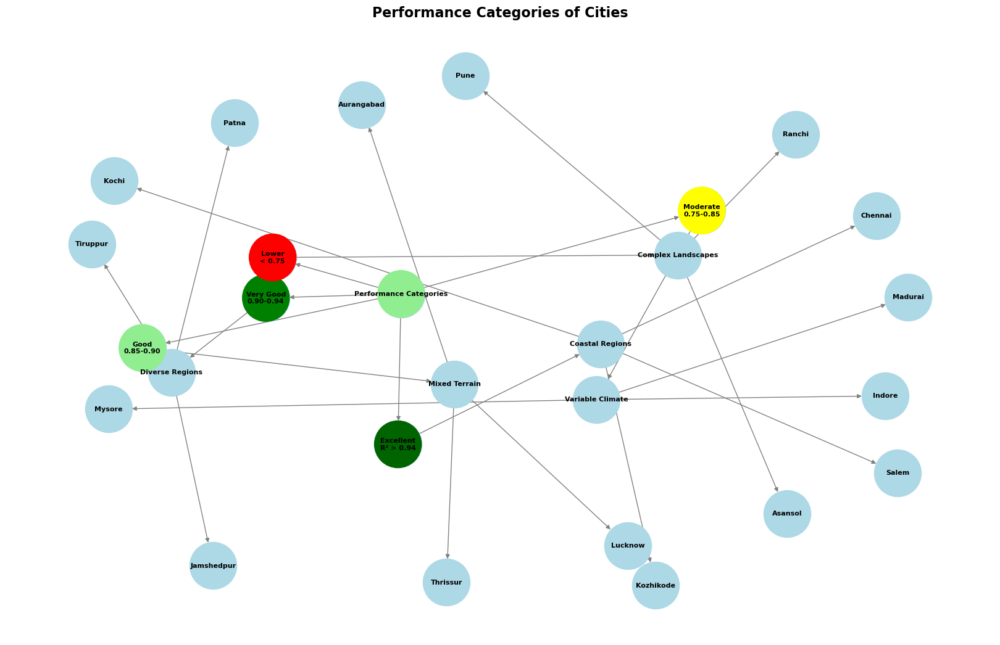

In [29]:
import networkx as nx
import matplotlib.pyplot as plt

def create_performance_network():
    # Create a directed graph
    G = nx.DiGraph()

    # Main categories
    G.add_edge("Performance Categories", "Excellent\nR² > 0.94")
    G.add_edge("Performance Categories", "Very Good\n0.90-0.94")
    G.add_edge("Performance Categories", "Good\n0.85-0.90")
    G.add_edge("Performance Categories", "Moderate\n0.75-0.85")
    G.add_edge("Performance Categories", "Lower\n< 0.75")

    # Subcategories and cities
    excellent_cities = {
        "Coastal Regions": ["Chennai", "Kochi", "Kozhikode", "Salem"]
    }
    very_good_cities = {
        "Diverse Regions": ["Jamshedpur", "Patna", "Tiruppur"]
    }
    good_cities = {
        "Mixed Terrain": ["Thrissur", "Aurangabad", "Lucknow"]
    }
    moderate_cities = {
        "Variable Climate": ["Madurai", "Indore", "Mysore"]
    }
    lower_cities = {
        "Complex Landscapes": ["Pune", "Ranchi", "Asansol"]
    }

    # Add subcategory and city edges
    for category, cities in [
        ("Excellent\nR² > 0.94", excellent_cities),
        ("Very Good\n0.90-0.94", very_good_cities),
        ("Good\n0.85-0.90", good_cities),
        ("Moderate\n0.75-0.85", moderate_cities),
        ("Lower\n< 0.75", lower_cities)
    ]:
        for subcategory, cities_list in cities.items():
            G.add_edge(category, subcategory)
            for city in cities_list:
                G.add_edge(subcategory, city)

    # Visualization
    plt.figure(figsize=(16, 10))
    pos = nx.spring_layout(G, k=0.9, iterations=50)

    # Draw nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', 
            node_size=3000, font_size=8, font_weight='bold', 
            arrows=True, edge_color='gray')

    # Customize node colors based on performance levels
    node_colors = {
        "Performance Categories": 'lightgreen',
        "Excellent\nR² > 0.94": 'darkgreen',
        "Very Good\n0.90-0.94": 'green',
        "Good\n0.85-0.90": 'lightgreen',
        "Moderate\n0.75-0.85": 'yellow',
        "Lower\n< 0.75": 'red'
    }

    # Recolor nodes
    nx.draw_networkx_nodes(G, pos, 
        nodelist=list(node_colors.keys()), 
        node_color=list(node_colors.values()), 
        node_size=3000)

    plt.title("Performance Categories of Cities", fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Run the visualization
create_performance_network()

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, 
    r2_score, mean_absolute_percentage_error
)
import xgboost as xgb
import os

class GroundwaterFeatureImportanceExtractor:
    def __init__(self, file_path):
        self.data = pd.read_csv(file_path)
        self.cities = self.data['City'].unique()
        
        # Create a directory to save feature importance plots
        os.makedirs('feature_importance_plots', exist_ok=True)
    
    def prepare_city_data(self, city):
        city_data = self.data[self.data['City'] == city].copy()
        
        # Encode categorical variables
        le = LabelEncoder()
        city_data['Drought_Category_Encoded'] = le.fit_transform(city_data['Drought_Category'])
        
        # Feature selection
        features = [
            'Latitude', 'Longitude', 'Tmax', 'Tmin', 
            'Actual_Et', 'Avg_Daily_Rain', 'Total_Monthly_Rain', 
            'Soil_Moisture', 'PDSI', 'PDSI_Anomaly', 
            'Drought_Category_Encoded', 'Srad', 'Srad_anomaly', 
            'Population'
        ]
        
        # Create DataFrame with features and lagged features
        X = city_data[features].copy()
        for feature in features:
            X[f'{feature}_lag1'] = X[feature].shift(1)
            X[f'{feature}_lag2'] = X[feature].shift(2)
        
        # Remove NaN rows
        X.dropna(inplace=True)
        y = city_data.loc[X.index, 'Groundwater_Level']
        
        # Scaling
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        return X_scaled, y, X.columns
    
    def extract_feature_importance(self, city):
        # Prepare data
        X_scaled, y, feature_names = self.prepare_city_data(city)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42
        )
        
        # Train XGBoost model
        model = xgb.XGBRegressor(
            n_estimators=200, 
            learning_rate=0.01, 
            max_depth=5, 
            random_state=42
        )
        model.fit(X_train, y_train)
        
        # Get feature importances
        feature_importances = model.feature_importances_
        feature_importance_df = pd.DataFrame({
            'feature': feature_names,
            'importance': feature_importances
        }).sort_values('importance', ascending=False).head(10)
        
        # Create and save plot
        plt.figure(figsize=(10, 6))
        sns.barplot(x='importance', y='feature', data=feature_importance_df)
        plt.title(f'Top 10 Feature Importances for {city}')
        plt.tight_layout()
        plt.savefig(f'feature_importance_plots/{city}_feature_importance.png')
        plt.close()
        
        # Return top features for research paper
        return feature_importance_df
    
    def extract_all_feature_importances(self):
        # Dictionary to store feature importances for all cities
        all_feature_importances = {}
        
        # Extract feature importance for each city
        for city in self.cities:
            print(f"Extracting feature importance for {city}")
            city_importances = self.extract_feature_importance(city)
            all_feature_importances[city] = city_importances
        
        # Create a comprehensive CSV report
        comprehensive_report = pd.concat(
            [df.set_index('feature') for df in all_feature_importances.values()], 
            keys=all_feature_importances.keys(), 
            names=['City']
        ).reset_index()
        comprehensive_report.to_csv('comprehensive_feature_importance.csv', index=False)
        
        return all_feature_importances

# Usage
extractor = GroundwaterFeatureImportanceExtractor('final for code.csv')
feature_importances = extractor.extract_all_feature_importances()

# Print out top features for each city
for city, importances in feature_importances.items():
    print(f"\n{city} Top Features:")
    print(importances)

Extracting feature importance for Thiruvananthapuram
Extracting feature importance for Kollam
Extracting feature importance for Madurai
Extracting feature importance for Kochi (Cochin)
Extracting feature importance for Thrissur
Extracting feature importance for Coimbatore
Extracting feature importance for Malappuram
Extracting feature importance for Tiruppur
Extracting feature importance for Kozhikode (Calicut)
Extracting feature importance for Salem
Extracting feature importance for Mysore
Extracting feature importance for Bengaluru
Extracting feature importance for Chennai (Madras)
Extracting feature importance for Hubli-Dharwad
Extracting feature importance for Hyderabad
Extracting feature importance for Warangal
Extracting feature importance for Pune (Poona)
Extracting feature importance for Mumbai
Extracting feature importance for Aurangabad
Extracting feature importance for Nashik
Extracting feature importance for Bhubaneswar
Extracting feature importance for Nagpur
Extracting fe

Evaluating Thiruvananthapuram
Evaluating Kollam
Evaluating Madurai
Evaluating Kochi (Cochin)
Evaluating Thrissur
Evaluating Coimbatore
Evaluating Malappuram
Evaluating Tiruppur
Evaluating Kozhikode (Calicut)
Evaluating Salem
Evaluating Mysore
Evaluating Bengaluru
Evaluating Chennai (Madras)
Evaluating Hubli-Dharwad
Evaluating Hyderabad
Evaluating Warangal
Evaluating Pune (Poona)
Evaluating Mumbai
Evaluating Aurangabad
Evaluating Nashik
Evaluating Bhubaneswar
Evaluating Nagpur
Evaluating Surat
Evaluating Durg-Bhilainagar
Evaluating Raipur
Evaluating Rajkot
Evaluating Vadodara
Evaluating Kolkata
Evaluating Indore
Evaluating Jamshedpur
Evaluating Jabalpur
Evaluating Bhopal
Evaluating Ranchi
Evaluating Asansol
Evaluating Dhanbad
Evaluating Kota
Evaluating Varanasi (Benares)
Evaluating Patna
Evaluating Guwahati (Gauhati)
Evaluating Gwalior
Evaluating Jodhpur
Evaluating Kanpur
Evaluating Lucknow
Evaluating Jaipur
Evaluating Agra
Evaluating Aligarh
Evaluating Bareilly
Evaluating Moradabad
Eva

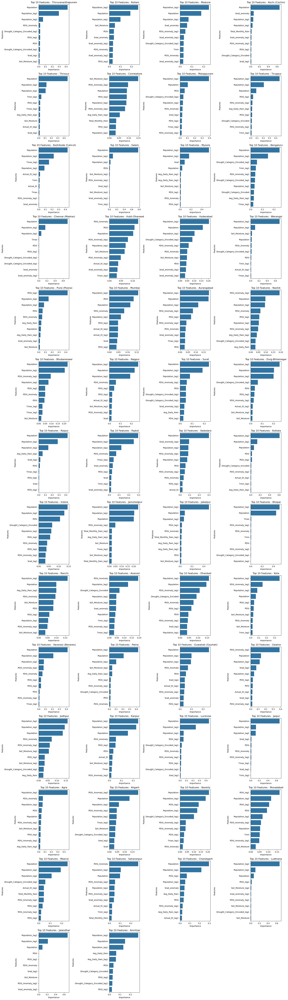

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, 
    r2_score, mean_absolute_percentage_error
)
import xgboost as xgb

class GroundwaterModelEvaluator:
    def __init__(self, file_path):
        self.data = pd.read_csv(file_path)
        self.cities = self.data['City'].unique()
    
    def prepare_city_data(self, city):
        city_data = self.data[self.data['City'] == city].copy()
        
        # Encode categorical variables
        le = LabelEncoder()
        city_data['Drought_Category_Encoded'] = le.fit_transform(city_data['Drought_Category'])
        
        # Feature selection
        features = [
            'Latitude', 'Longitude', 'Tmax', 'Tmin', 
            'Actual_Et', 'Avg_Daily_Rain', 'Total_Monthly_Rain', 
            'Soil_Moisture', 'PDSI', 'PDSI_Anomaly', 
            'Drought_Category_Encoded', 'Srad', 'Srad_anomaly', 
            'Population'
        ]
        
        # Create DataFrame with features and lagged features
        X = city_data[features].copy()
        for feature in features:
            X[f'{feature}_lag1'] = X[feature].shift(1)
            X[f'{feature}_lag2'] = X[feature].shift(2)
        
        # Remove NaN rows
        X.dropna(inplace=True)
        y = city_data.loc[X.index, 'Groundwater_Level']
        
        # Scaling
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        return X_scaled, y, X.columns
    
    def evaluate_model(self, city):
        # Prepare data
        X_scaled, y, feature_names = self.prepare_city_data(city)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42
        )
        
        # Train XGBoost model
        model = xgb.XGBRegressor(
            n_estimators=200, 
            learning_rate=0.01, 
            max_depth=5, 
            random_state=42
        )
        model.fit(X_train, y_train)
        
        # Predictions
        y_pred = model.predict(X_test)
        
        # Metrics
        metrics = {
            'MSE': mean_squared_error(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred),
            'MAPE': mean_absolute_percentage_error(y_test, y_pred),
            'R2': r2_score(y_test, y_pred)
        }
        
        return {
            'metrics': metrics,
            'model': model,
            'X_test': X_test,
            'y_test': y_test,
            'y_pred': y_pred,
            'feature_names': feature_names
        }
    
    def plot_feature_importance_subplots(self, all_results):
        """
        Create a subplot grid of feature importances for all cities
        
        Parameters:
        all_results (dict): Dictionary of model results for each city
        """
        # Determine number of cities
        num_cities = len(all_results)
        
        # Calculate grid dimensions
        num_cols = 4  # Fixed to 4 columns as per your previous subplot example
        num_rows = (num_cities + num_cols - 1) // num_cols  # Ceiling division
        
        # Create figure
        plt.figure(figsize=(20, 5 * num_rows))
        
        # Iterate through cities and create subplots
        for idx, (city, results) in enumerate(all_results.items(), 1):
            plt.subplot(num_rows, num_cols, idx)
            
            # Get feature importances
            feature_importances = results['model'].feature_importances_
            feature_importance_df = pd.DataFrame({
                'feature': results['feature_names'],
                'importance': feature_importances
            }).sort_values('importance', ascending=False).head(10)
            
            # Create bar plot
            sns.barplot(x='importance', y='feature', data=feature_importance_df)
            plt.title(f'Top 10 Features - {city}')
            plt.xlabel('Importance')
            plt.ylabel('Features')
            plt.tight_layout()
        
        # Adjust layout and show plot
        plt.tight_layout()
        plt.show()

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
all_results = {}

# Evaluate for each city
for city in evaluator.cities:
    print(f"Evaluating {city}")
    results = evaluator.evaluate_model(city)
    all_results[city] = results

# Plot feature importance subplots
evaluator.plot_feature_importance_subplots(all_results)

# Optional: Save results to CSV
results_df = pd.DataFrame.from_dict(
    {city: results['metrics'] for city, results in all_results.items()}, 
    orient='index'
)
results_df.to_csv('groundwater_prediction_metrics_2.csv')

Evaluating Thiruvananthapuram
Evaluating Kollam
Evaluating Madurai
Evaluating Kochi (Cochin)
Evaluating Thrissur
Evaluating Coimbatore
Evaluating Malappuram
Evaluating Tiruppur
Evaluating Kozhikode (Calicut)
Evaluating Salem
Evaluating Mysore
Evaluating Bengaluru
Evaluating Chennai (Madras)
Evaluating Hubli-Dharwad
Evaluating Hyderabad
Evaluating Warangal
Evaluating Pune (Poona)
Evaluating Mumbai
Evaluating Aurangabad
Evaluating Nashik
Evaluating Bhubaneswar
Evaluating Nagpur
Evaluating Surat
Evaluating Durg-Bhilainagar
Evaluating Raipur
Evaluating Rajkot
Evaluating Vadodara
Evaluating Kolkata
Evaluating Indore
Evaluating Jamshedpur
Evaluating Jabalpur
Evaluating Bhopal
Evaluating Ranchi
Evaluating Asansol
Evaluating Dhanbad
Evaluating Kota
Evaluating Varanasi (Benares)
Evaluating Patna
Evaluating Guwahati (Gauhati)
Evaluating Gwalior
Evaluating Jodhpur
Evaluating Kanpur
Evaluating Lucknow
Evaluating Jaipur
Evaluating Agra
Evaluating Aligarh
Evaluating Bareilly
Evaluating Moradabad
Eva

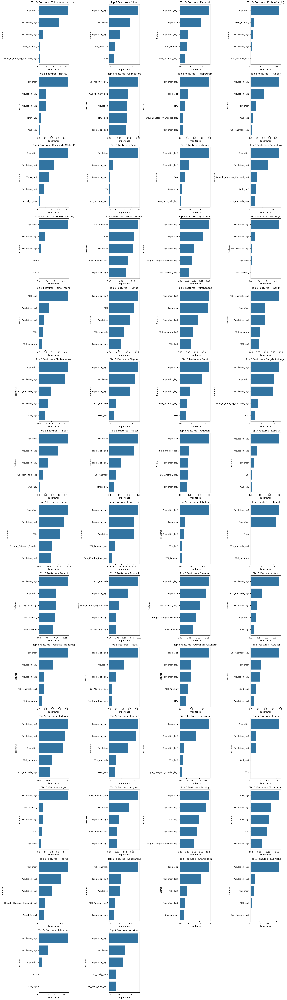

In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, 
    r2_score, mean_absolute_percentage_error
)
import xgboost as xgb

class GroundwaterModelEvaluator:
    def __init__(self, file_path):
        self.data = pd.read_csv(file_path)
        self.cities = self.data['City'].unique()
    
    def prepare_city_data(self, city):
        city_data = self.data[self.data['City'] == city].copy()
        
        # Encode categorical variables
        le = LabelEncoder()
        city_data['Drought_Category_Encoded'] = le.fit_transform(city_data['Drought_Category'])
        
        # Feature selection
        features = [
            'Latitude', 'Longitude', 'Tmax', 'Tmin', 
            'Actual_Et', 'Avg_Daily_Rain', 'Total_Monthly_Rain', 
            'Soil_Moisture', 'PDSI', 'PDSI_Anomaly', 
            'Drought_Category_Encoded', 'Srad', 'Srad_anomaly', 
            'Population'
        ]
        
        # Create DataFrame with features and lagged features
        X = city_data[features].copy()
        for feature in features:
            X[f'{feature}_lag1'] = X[feature].shift(1)
            X[f'{feature}_lag2'] = X[feature].shift(2)
        
        # Remove NaN rows
        X.dropna(inplace=True)
        y = city_data.loc[X.index, 'Groundwater_Level']
        
        # Scaling
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        return X_scaled, y, X.columns
    
    def evaluate_model(self, city):
        # Prepare data
        X_scaled, y, feature_names = self.prepare_city_data(city)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42
        )
        
        # Train XGBoost model
        model = xgb.XGBRegressor(
            n_estimators=200, 
            learning_rate=0.01, 
            max_depth=5, 
            random_state=42
        )
        model.fit(X_train, y_train)
        
        # Predictions
        y_pred = model.predict(X_test)
        
        # Metrics
        metrics = {
            'MSE': mean_squared_error(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred),
            'MAPE': mean_absolute_percentage_error(y_test, y_pred),
            'R2': r2_score(y_test, y_pred)
        }
        
        return {
            'metrics': metrics,
            'model': model,
            'X_test': X_test,
            'y_test': y_test,
            'y_pred': y_pred,
            'feature_names': feature_names
        }
    
    def plot_feature_importance_subplots(self, all_results):
        """
        Create a subplot grid of top 5 feature importances for all cities
        
        Parameters:
        all_results (dict): Dictionary of model results for each city
        """
        # Determine number of cities
        num_cities = len(all_results)
        
        # Calculate grid dimensions
        num_cols = 4  # Fixed to 4 columns as per your previous subplot example
        num_rows = (num_cities + num_cols - 1) // num_cols  # Ceiling division
        
        # Create figure
        plt.figure(figsize=(20, 5 * num_rows))
        
        # Iterate through cities and create subplots
        for idx, (city, results) in enumerate(all_results.items(), 1):
            plt.subplot(num_rows, num_cols, idx)
            
            # Get feature importances
            feature_importances = results['model'].feature_importances_
            feature_importance_df = pd.DataFrame({
                'feature': results['feature_names'],
                'importance': feature_importances
            }).sort_values('importance', ascending=False).head(5)
            
            # Create bar plot
            sns.barplot(x='importance', y='feature', data=feature_importance_df)
            plt.title(f'Top 5 Features - {city}')
            plt.xlabel('Importance')
            plt.ylabel('Features')
            plt.tight_layout()
        
        # Adjust layout and show plot
        plt.tight_layout()
        plt.show()

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
all_results = {}

# Evaluate for each city
for city in evaluator.cities:
    print(f"Evaluating {city}")
    results = evaluator.evaluate_model(city)
    all_results[city] = results

# Plot feature importance subplots
evaluator.plot_feature_importance_subplots(all_results)

# Optional: Save results to CSV
results_df = pd.DataFrame.from_dict(
    {city: results['metrics'] for city, results in all_results.items()}, 
    orient='index'
)
results_df.to_csv('groundwater_prediction_metrics_2.csv')

Evaluating Thiruvananthapuram


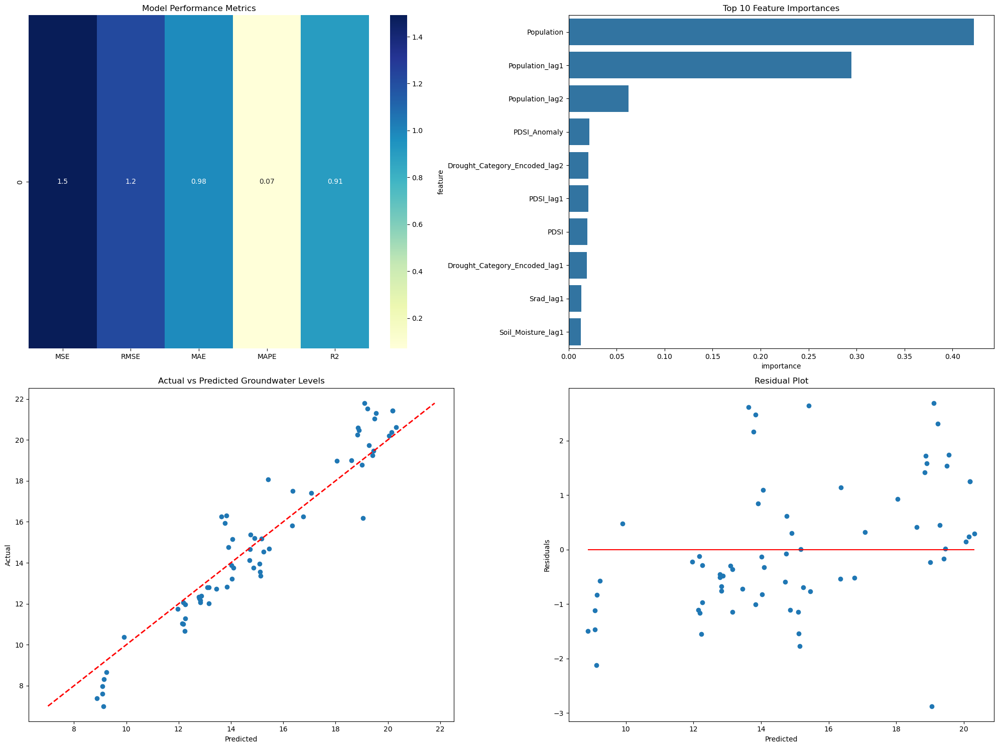

Evaluating Kollam


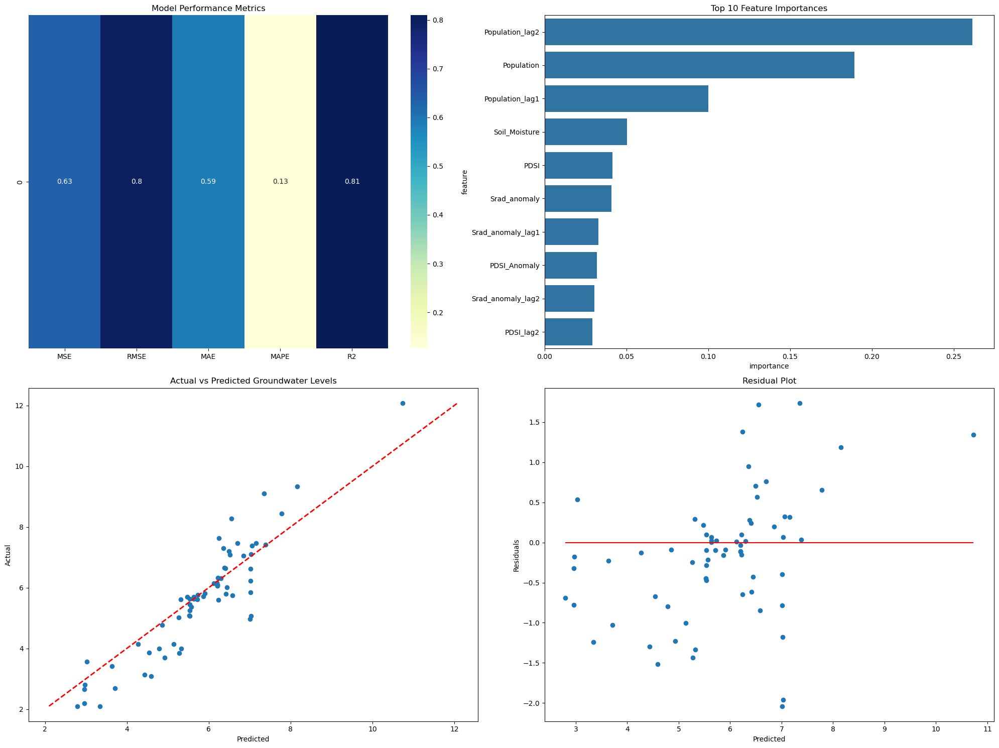

Evaluating Madurai


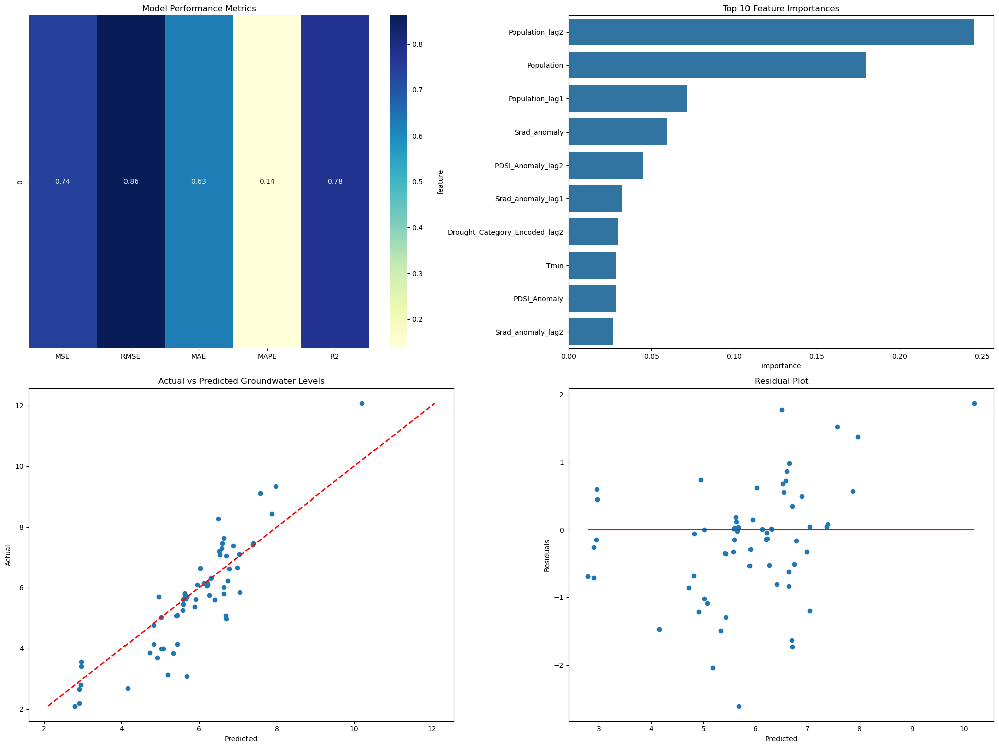

Evaluating Kochi (Cochin)


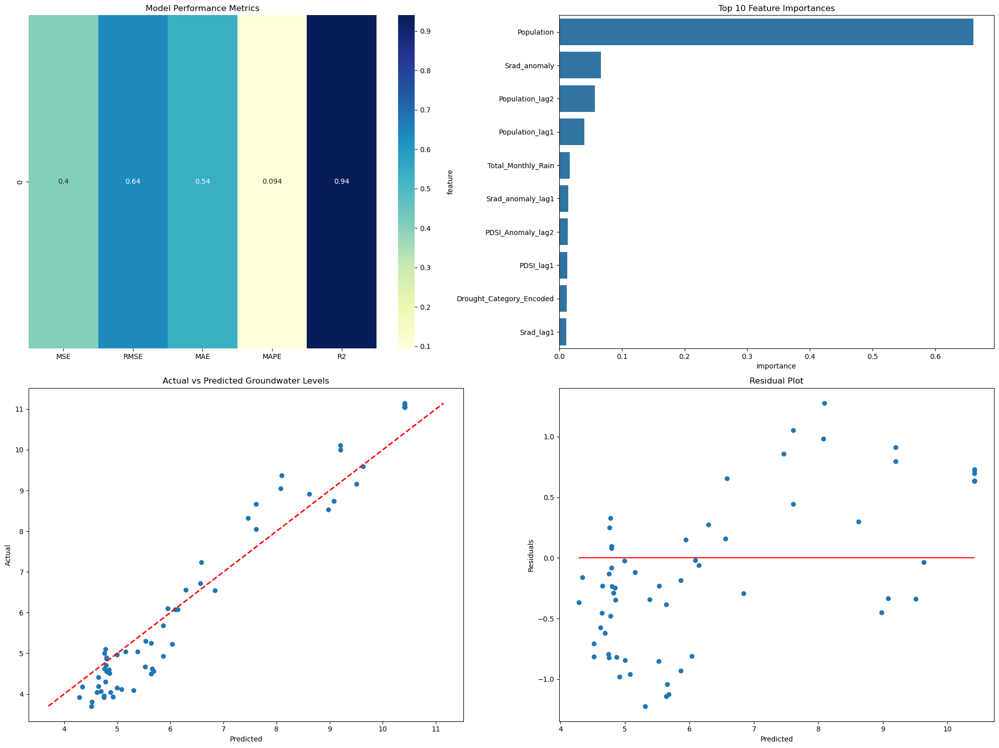

Evaluating Thrissur


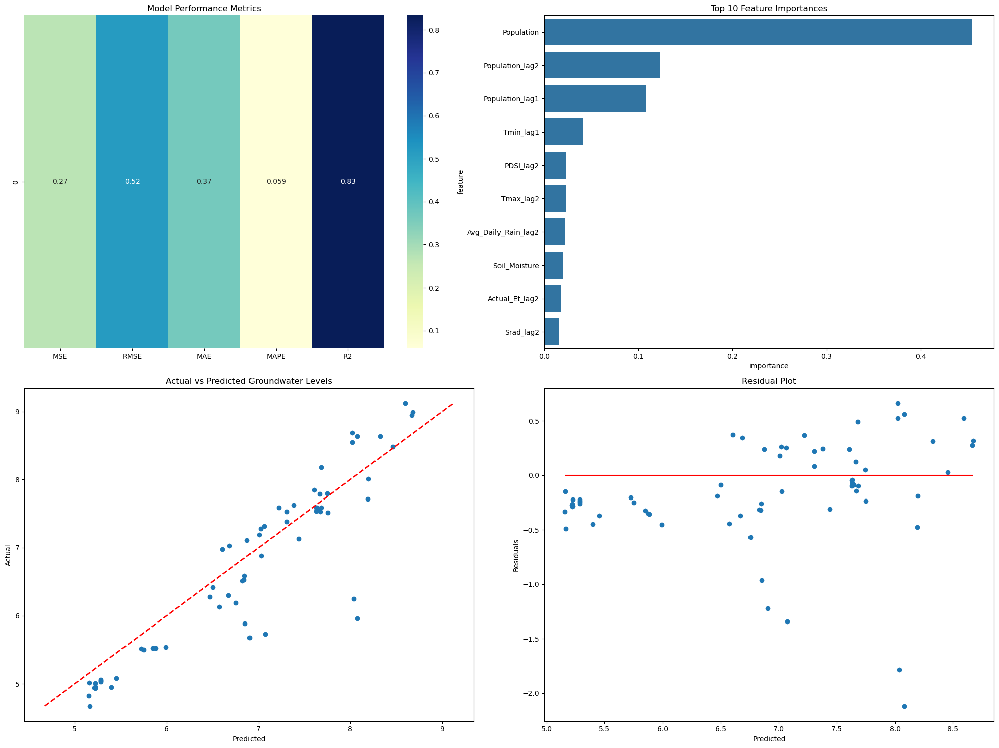

Evaluating Coimbatore


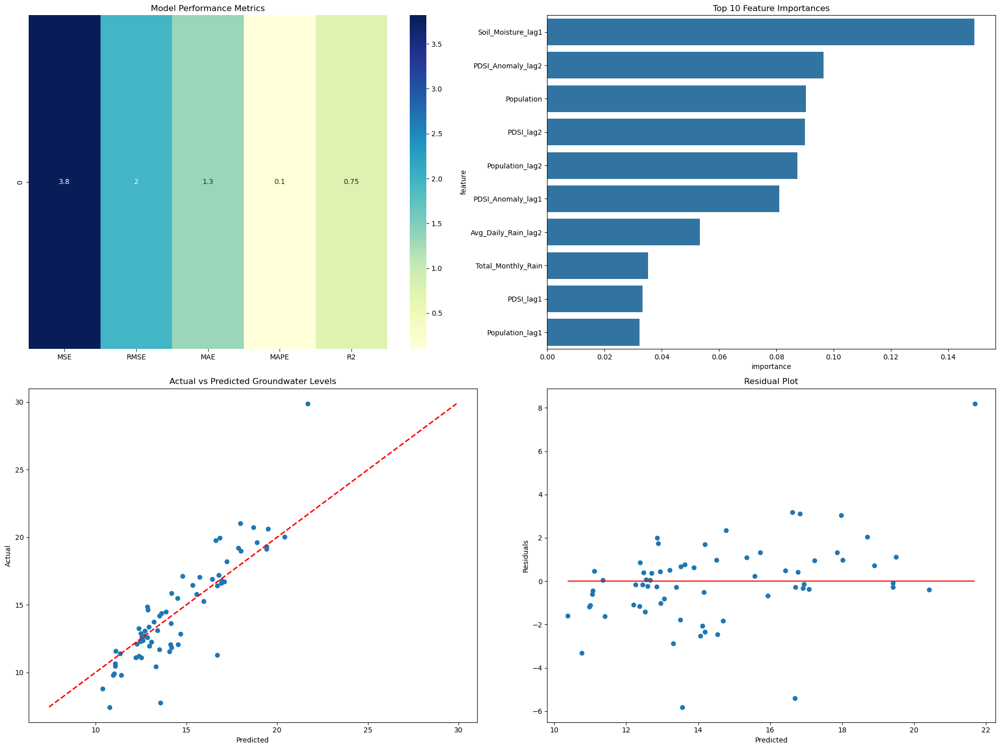

Evaluating Malappuram


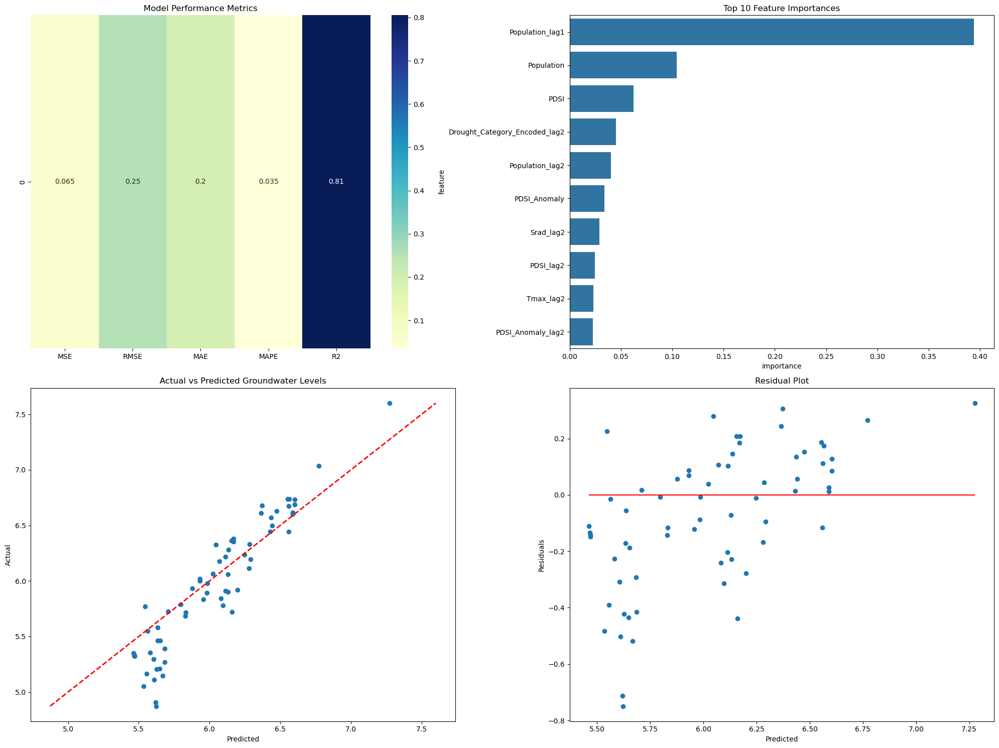

Evaluating Tiruppur


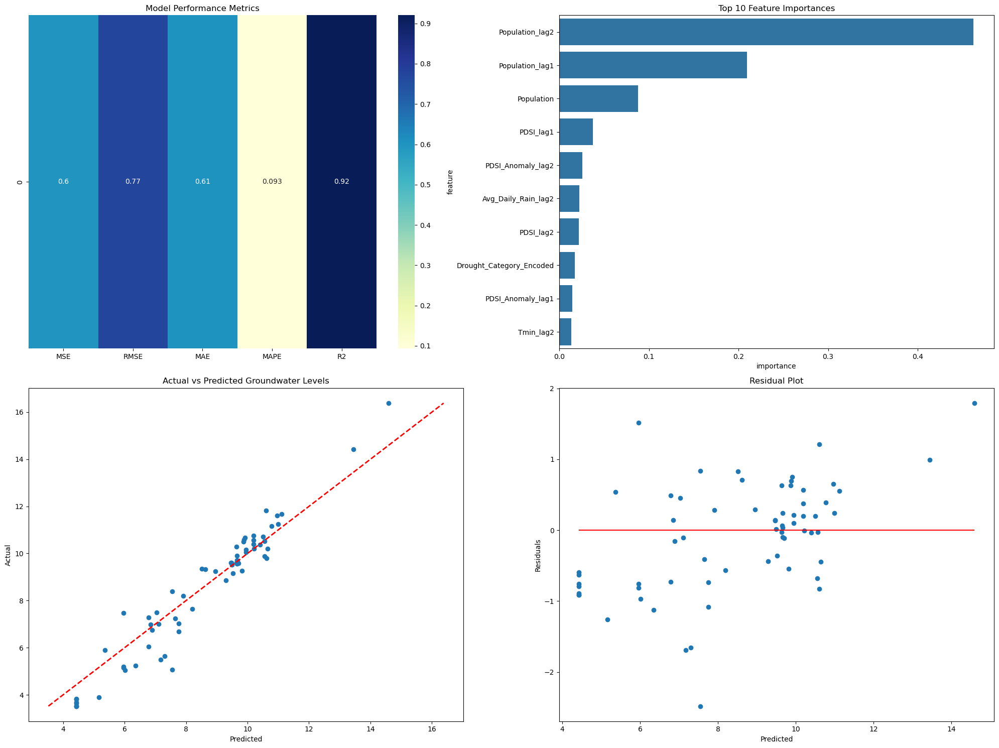

Evaluating Kozhikode (Calicut)


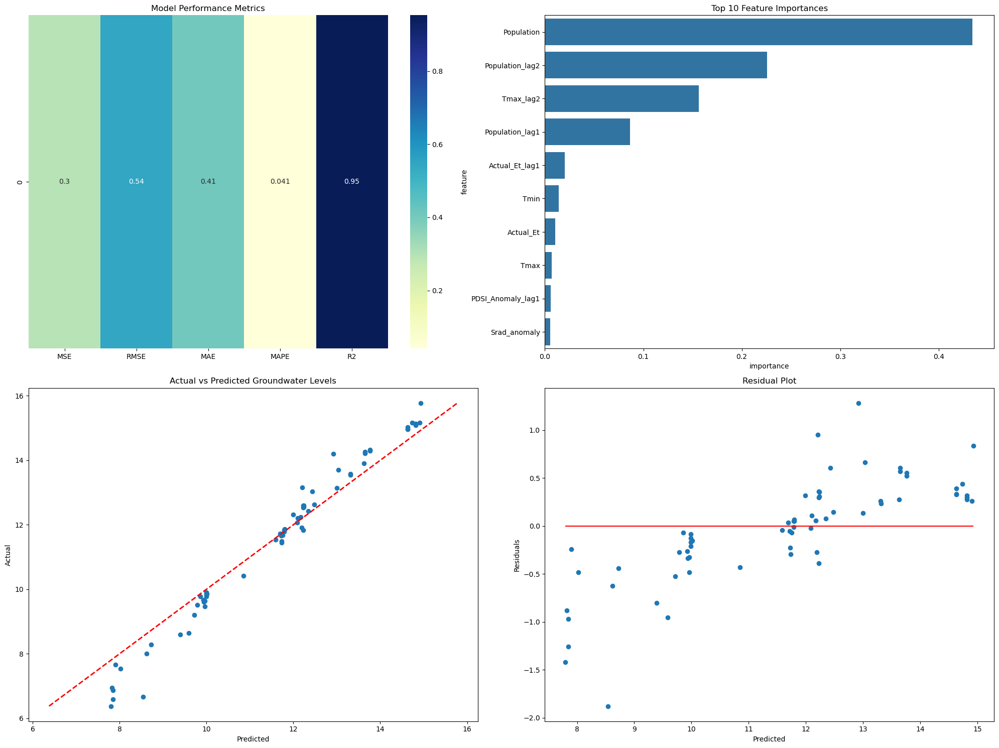

Evaluating Salem


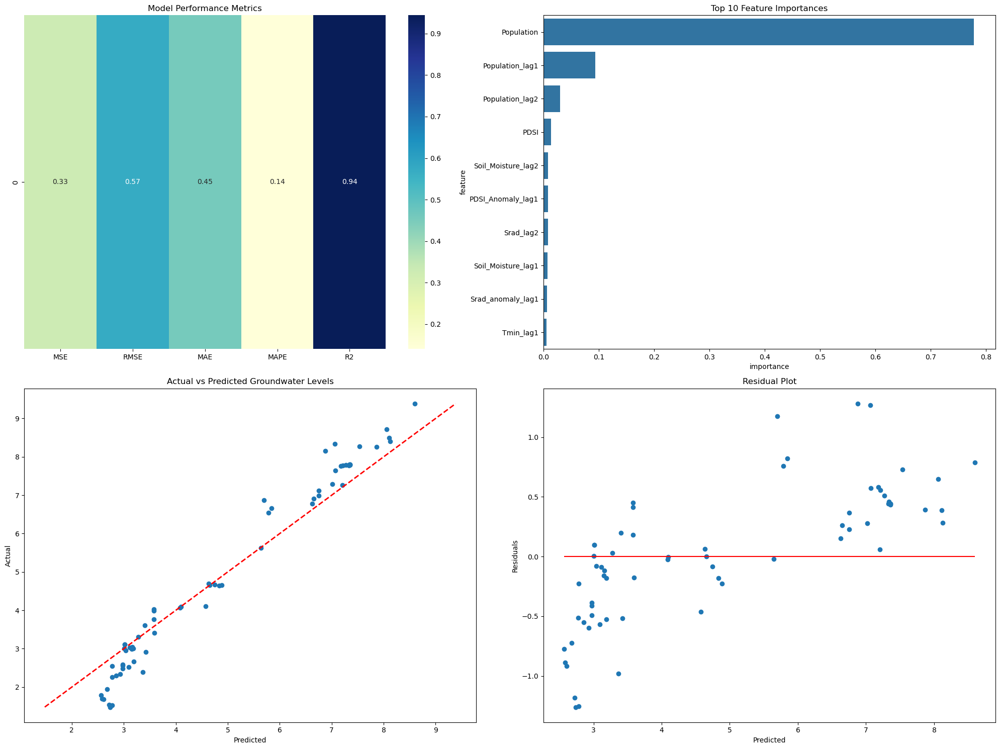

Evaluating Mysore


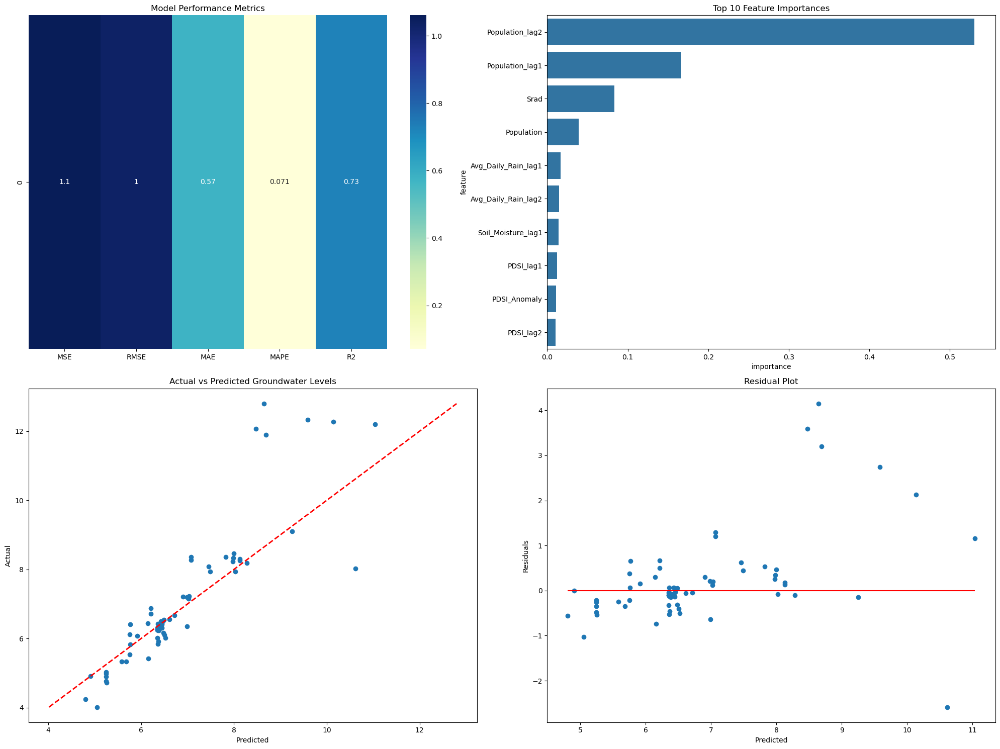

Evaluating Bengaluru


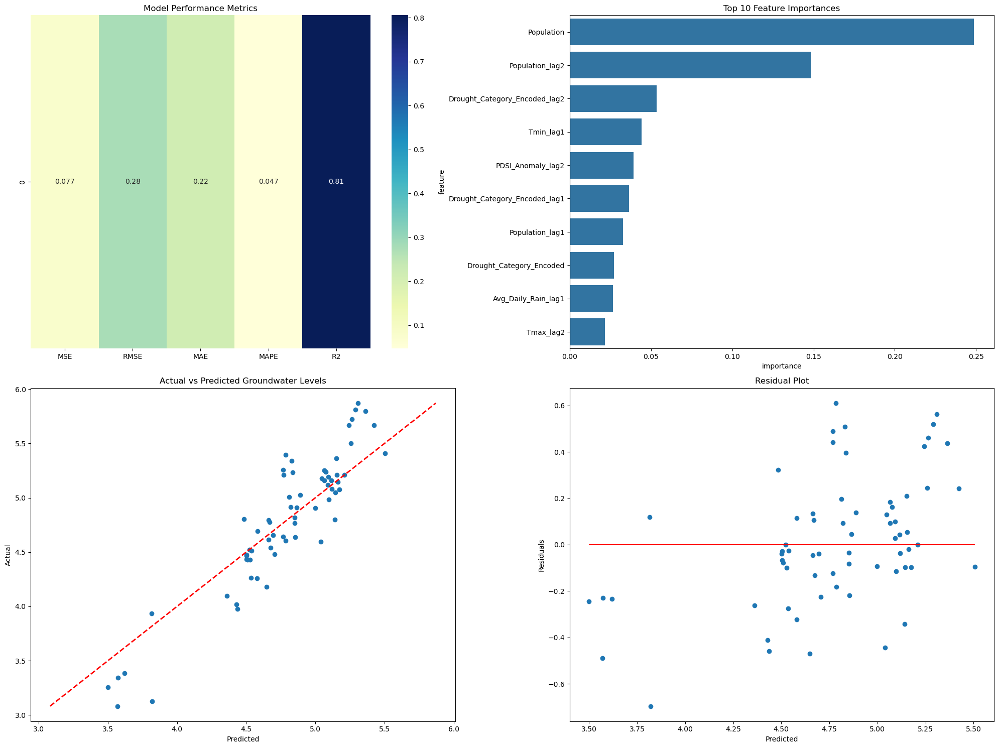

Evaluating Chennai (Madras)


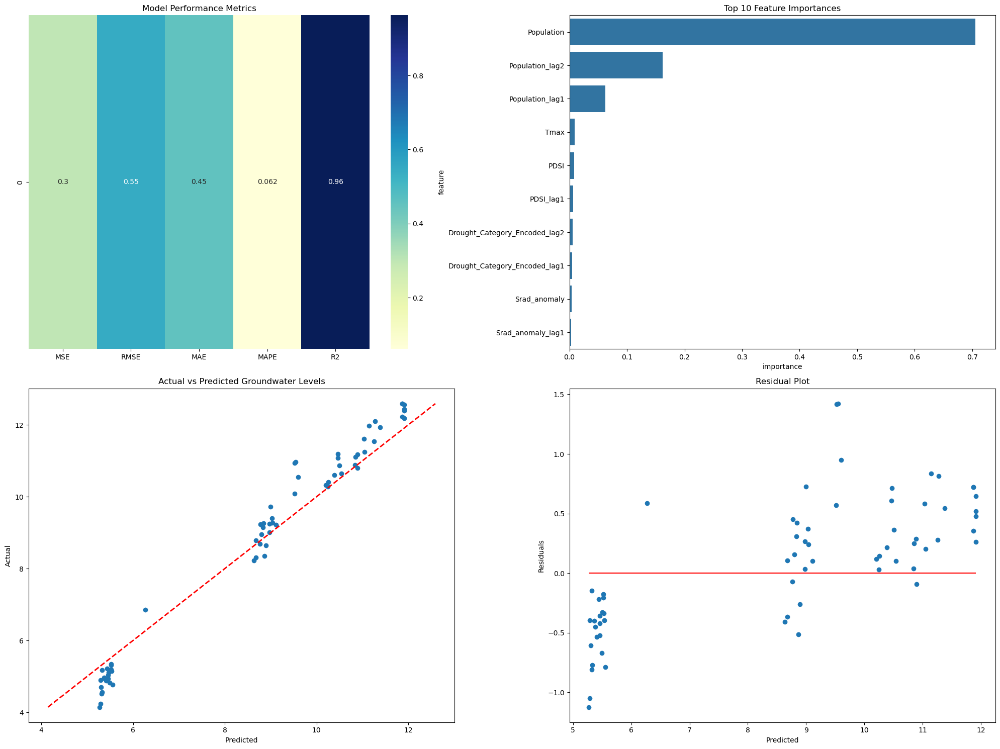

Evaluating Hubli-Dharwad


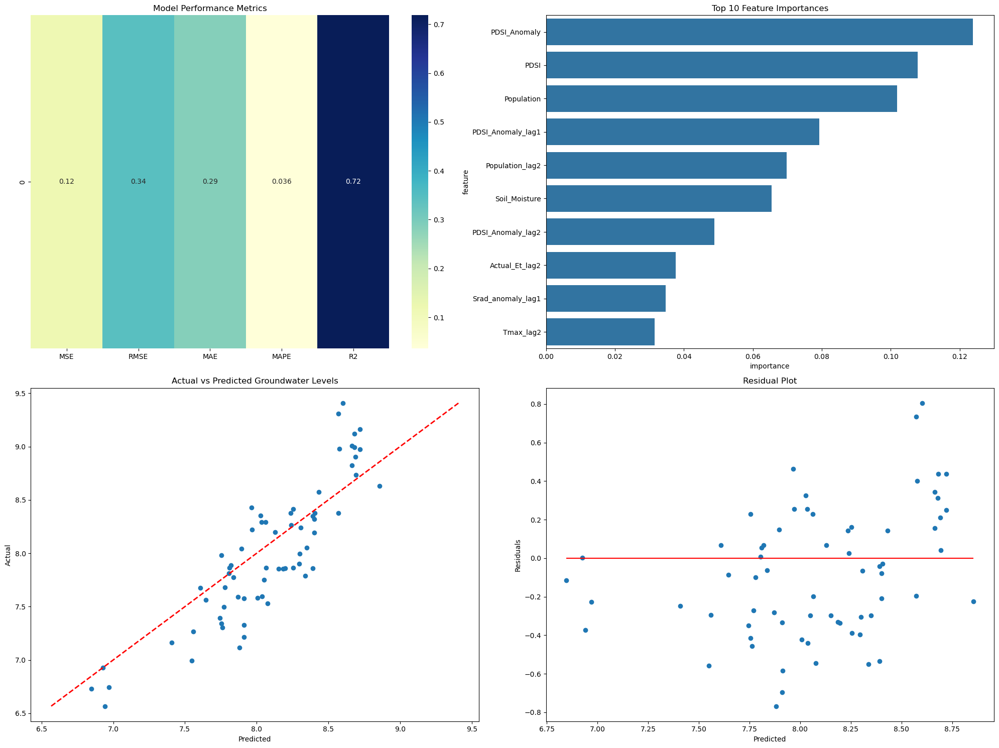

Evaluating Hyderabad


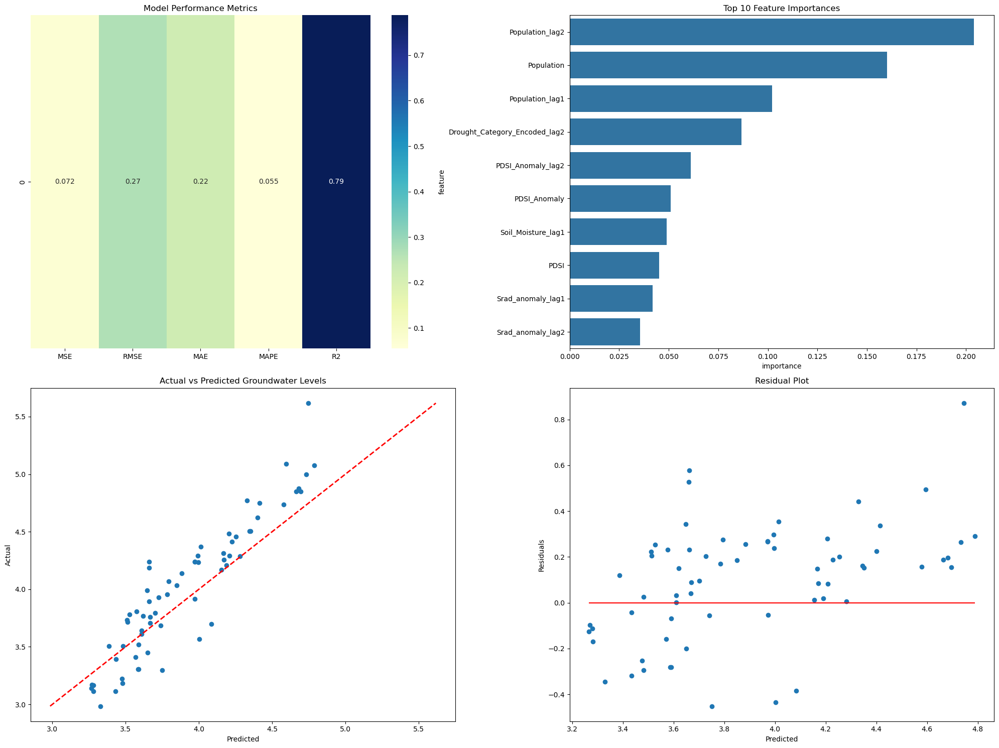

Evaluating Warangal


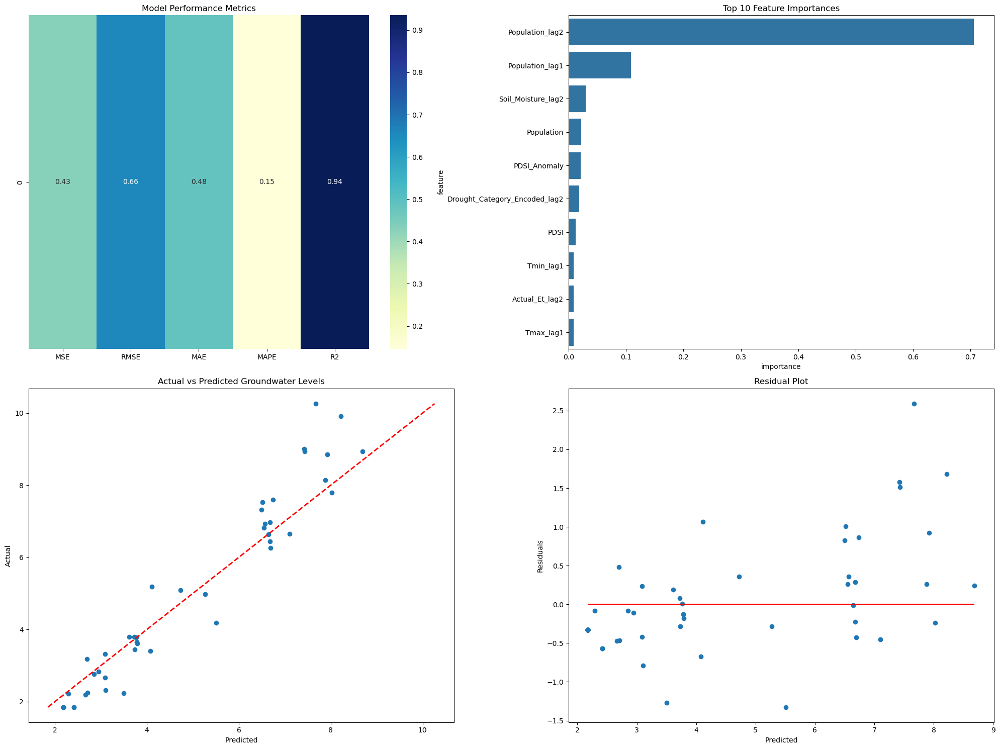

Evaluating Pune (Poona)


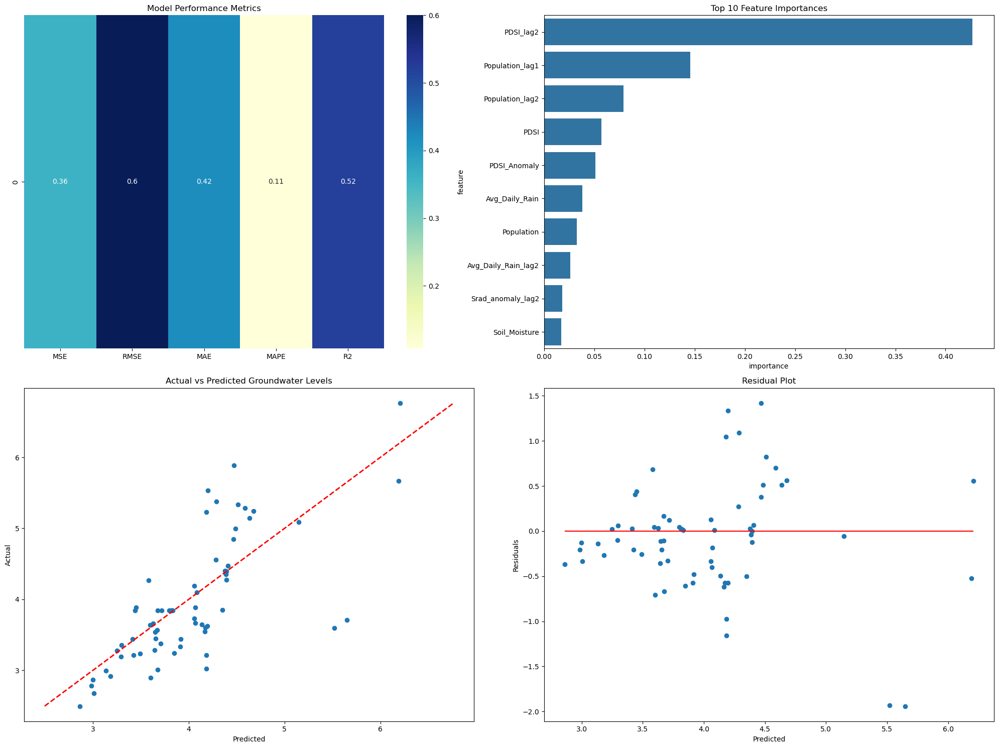

Evaluating Mumbai


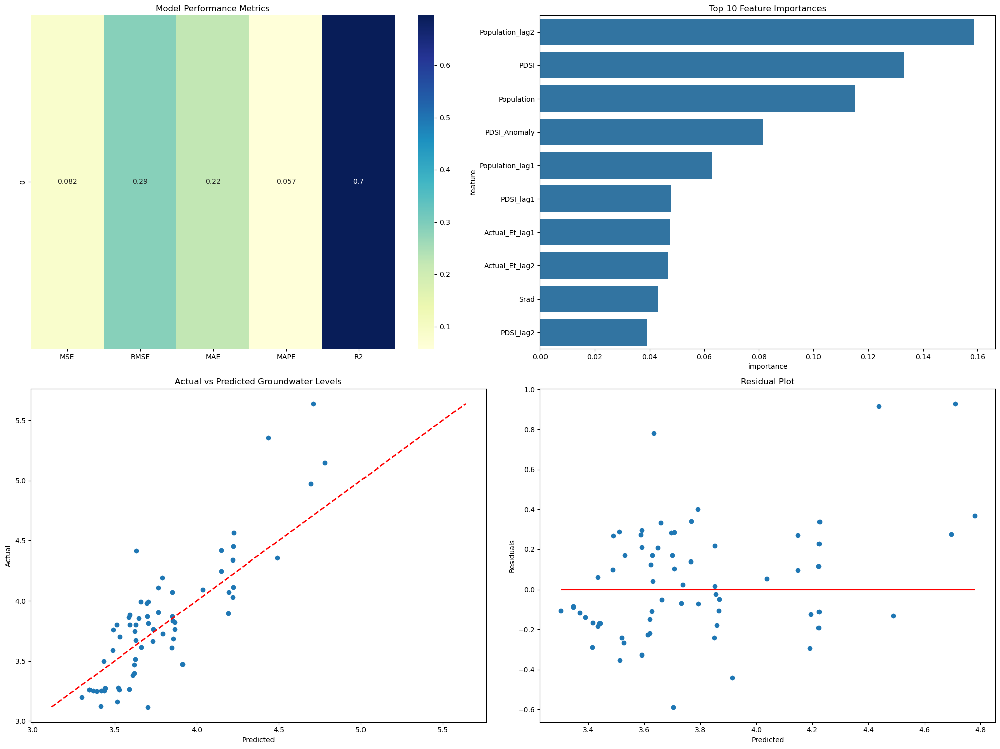

Evaluating Aurangabad


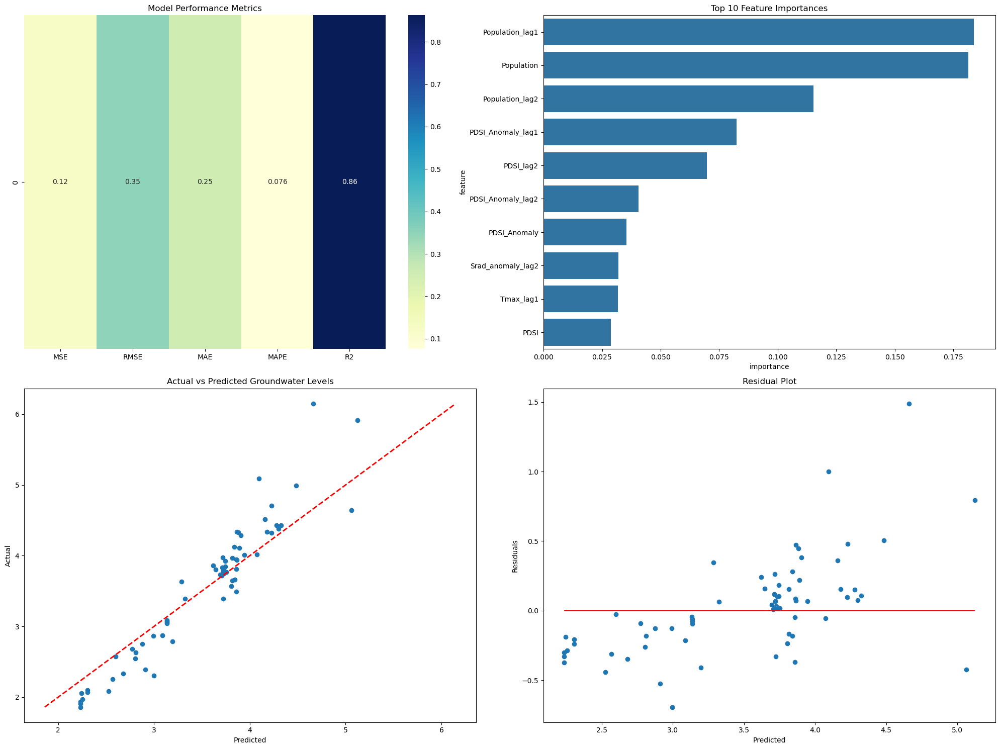

Evaluating Nashik


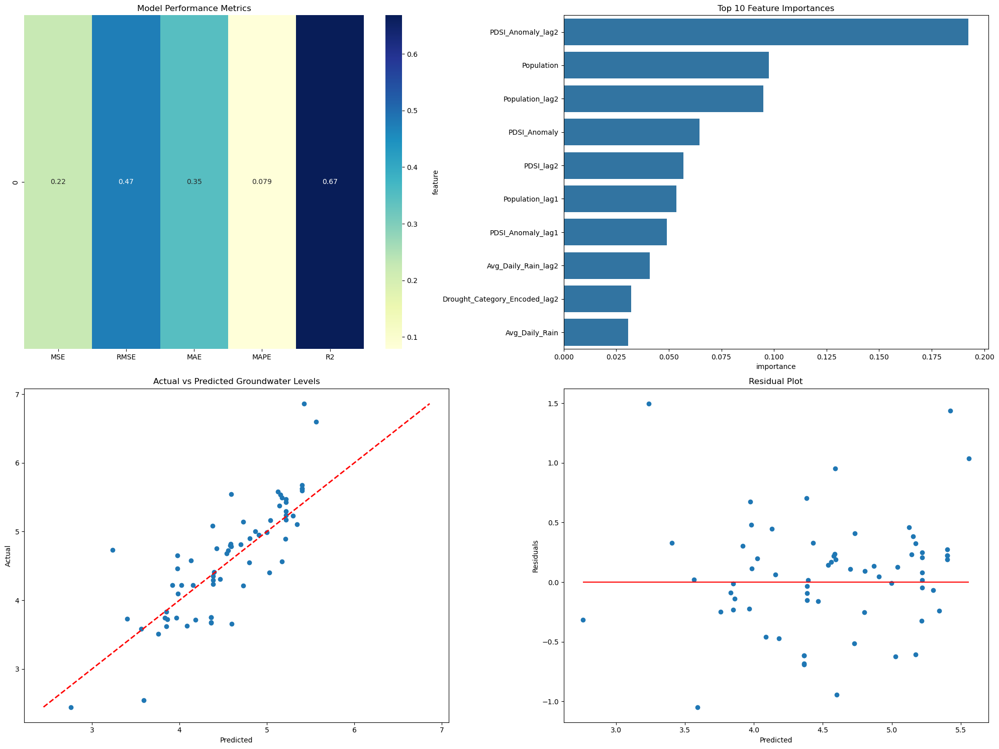

Evaluating Bhubaneswar


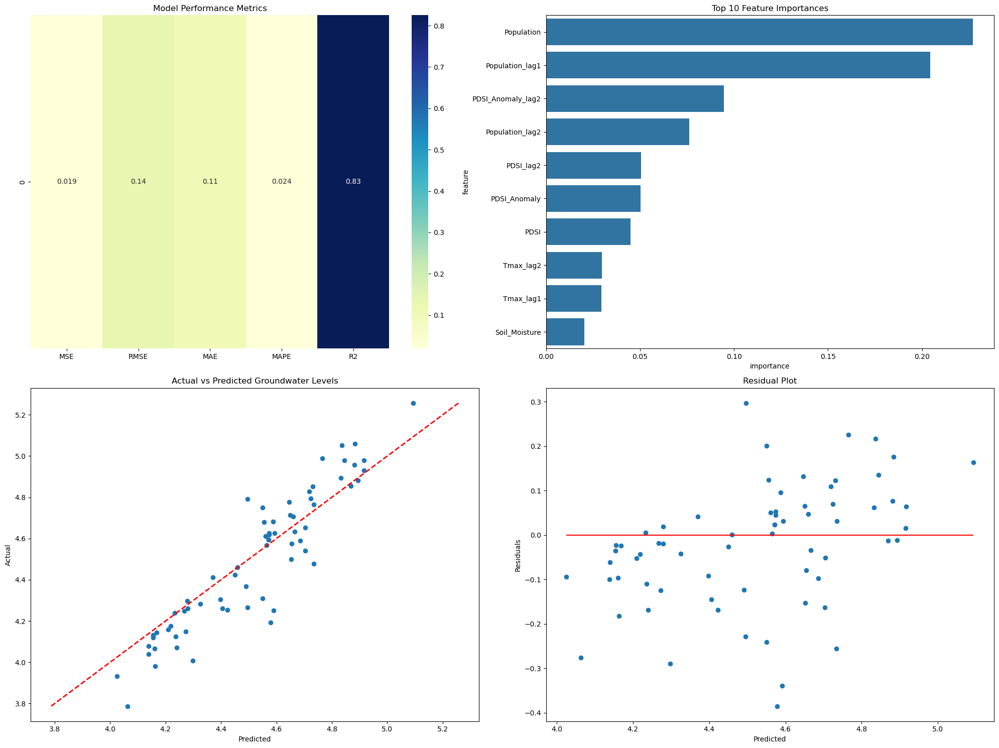

Evaluating Nagpur


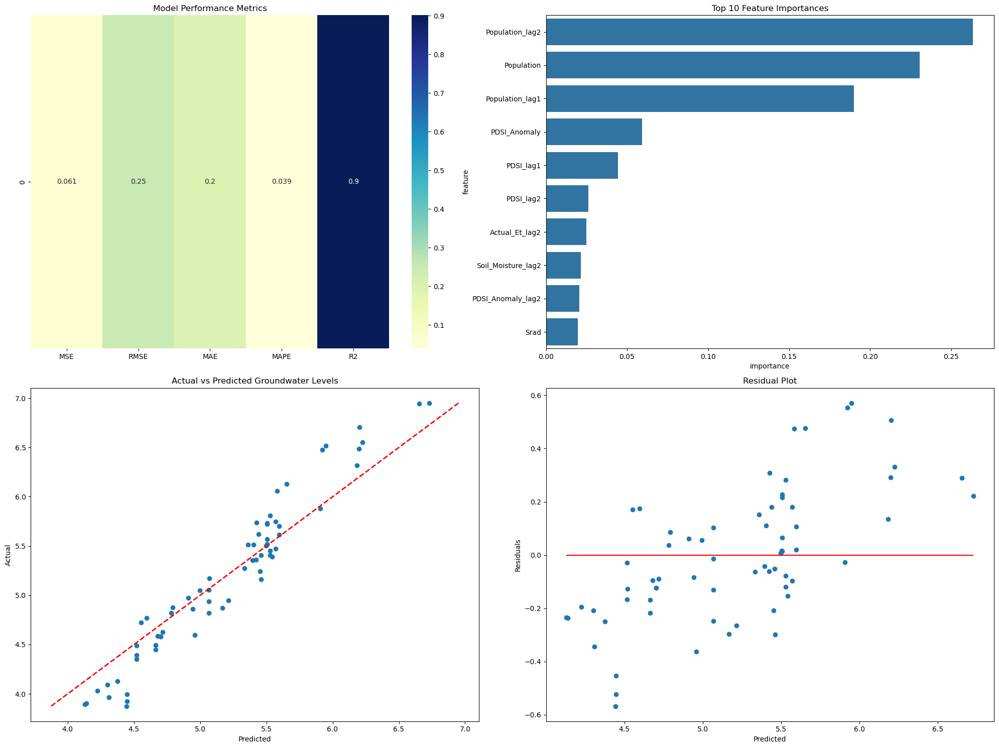

Evaluating Surat


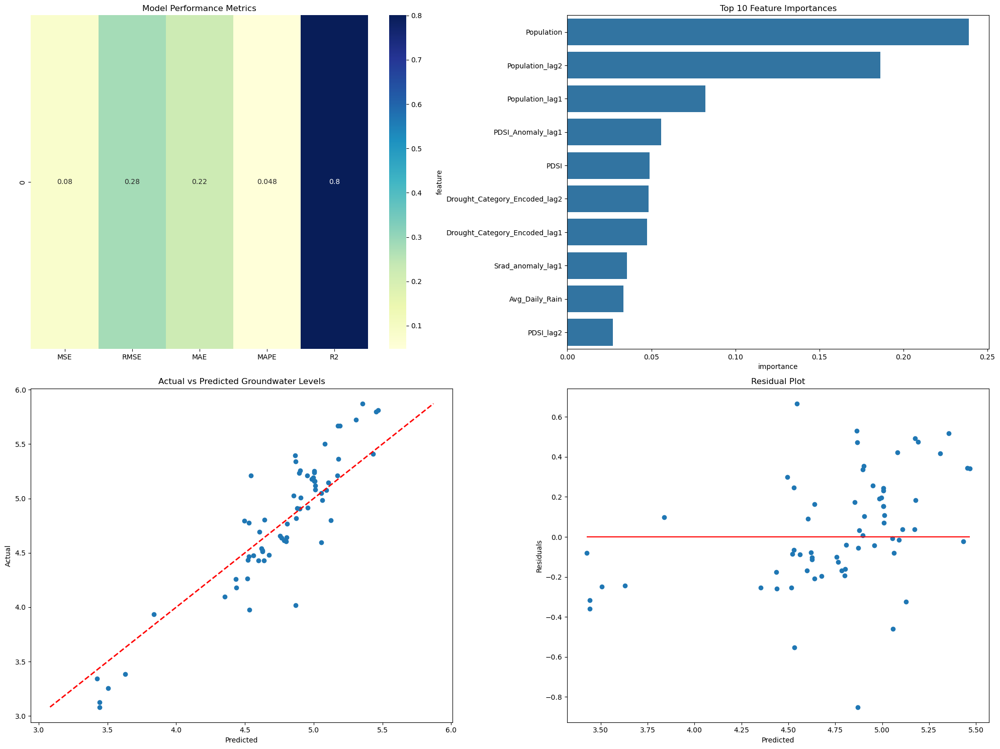

Evaluating Durg-Bhilainagar


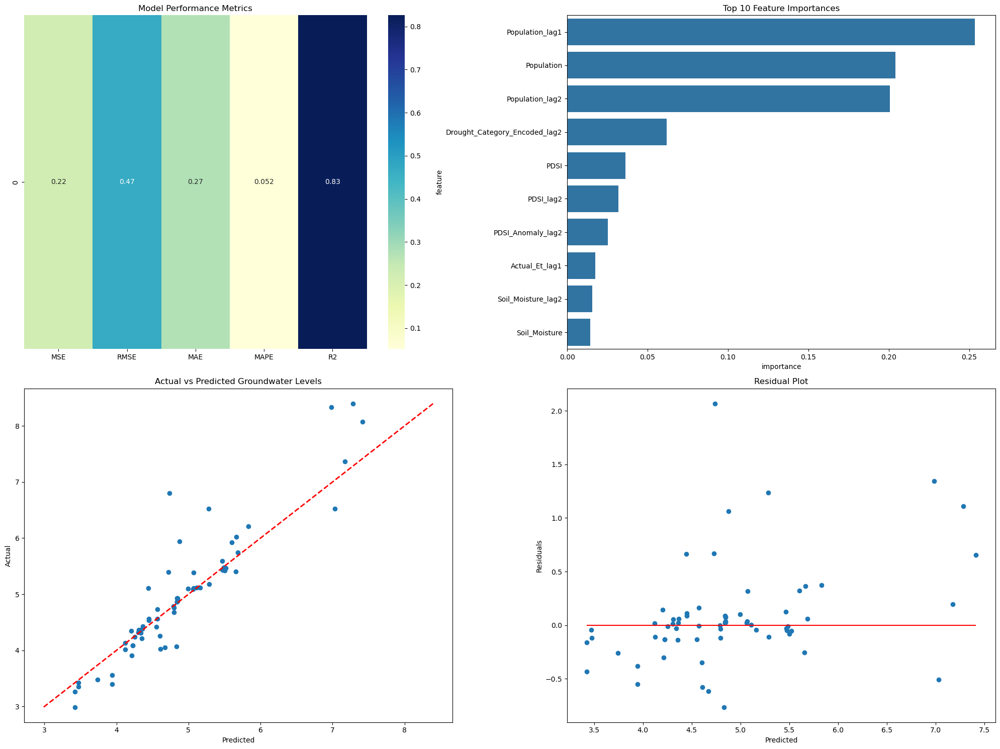

Evaluating Raipur


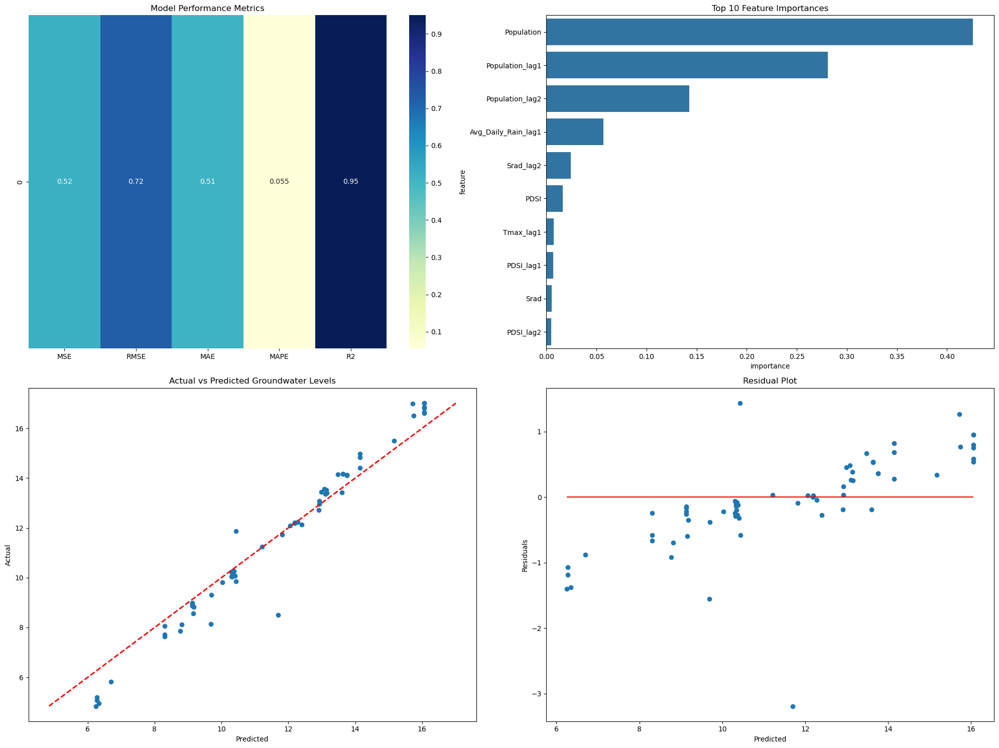

Evaluating Rajkot


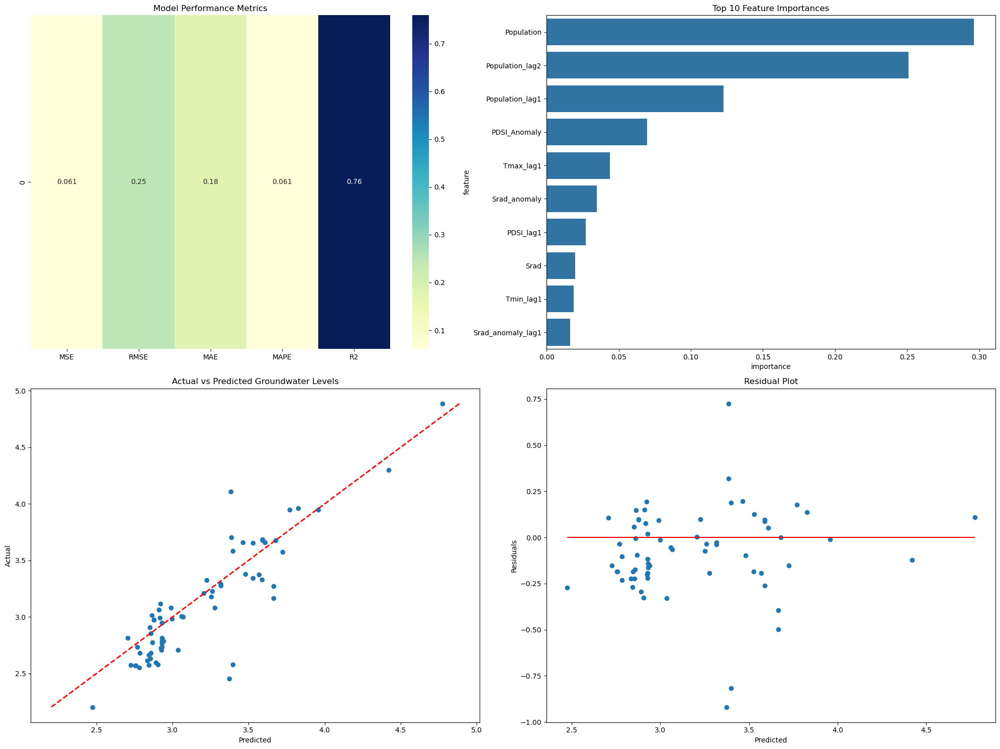

Evaluating Vadodara


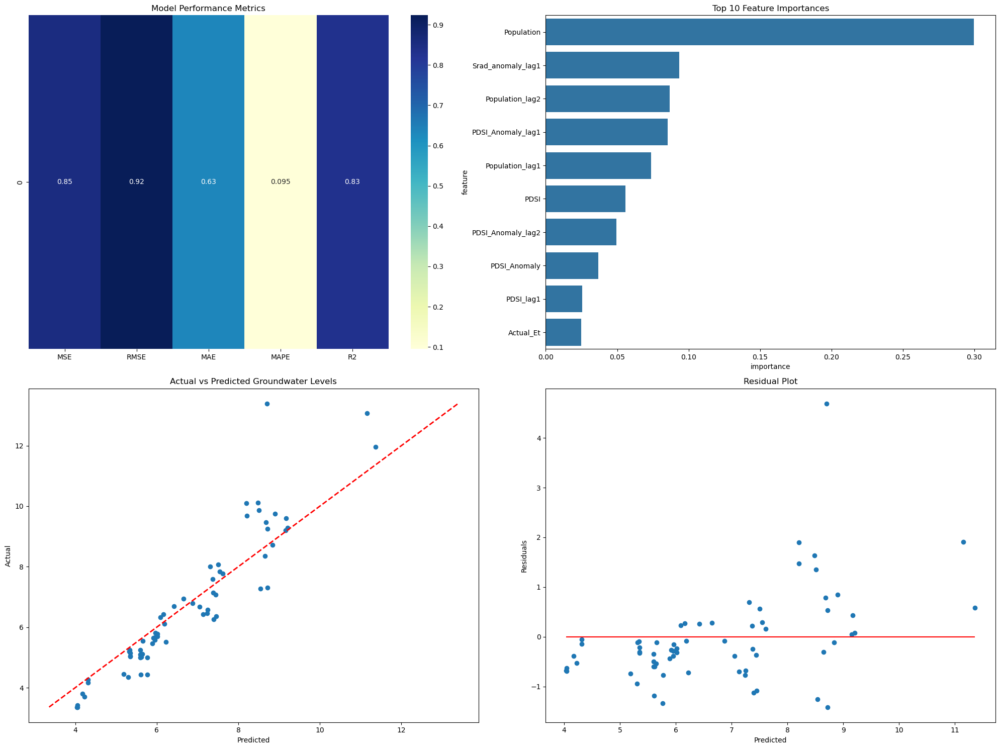

Evaluating Kolkata


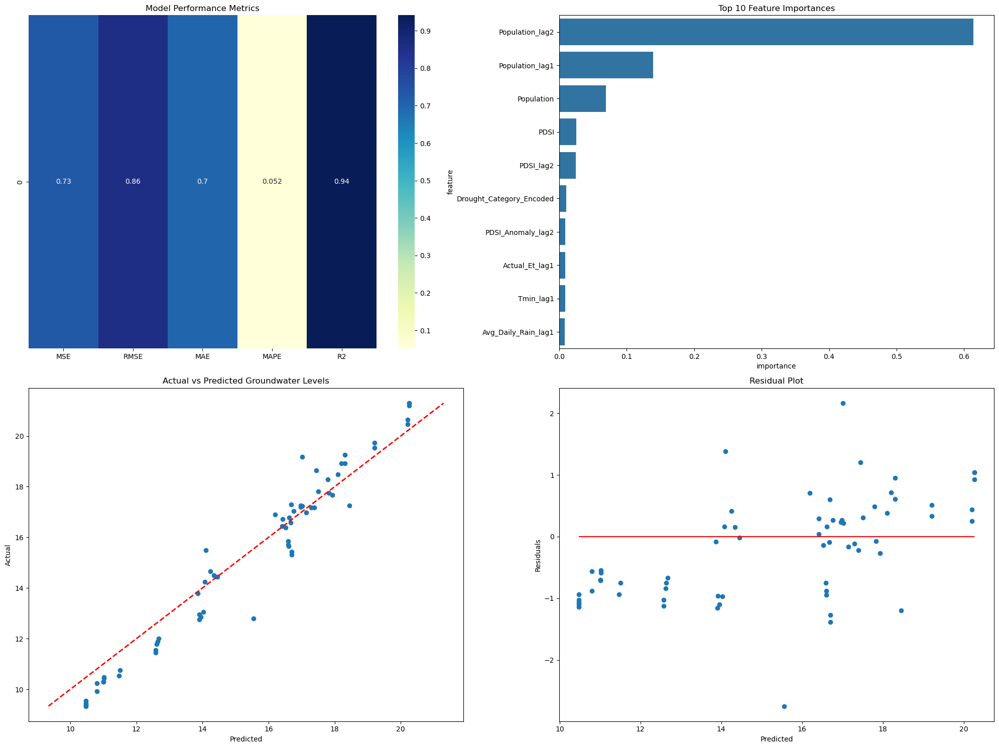

Evaluating Indore


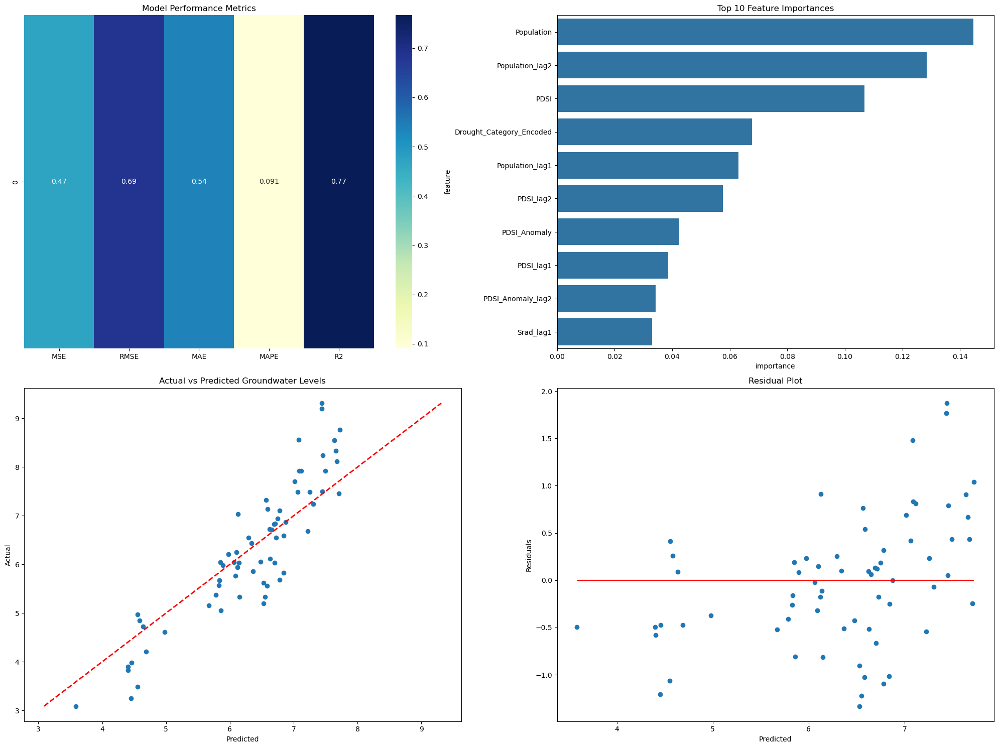

Evaluating Jamshedpur


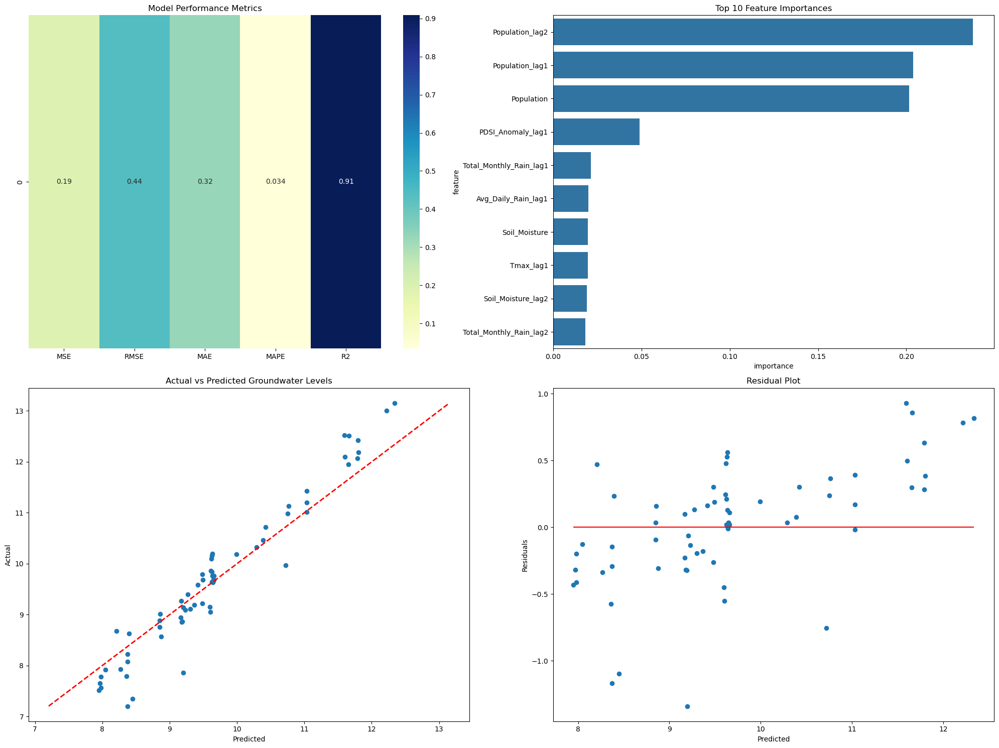

Evaluating Jabalpur


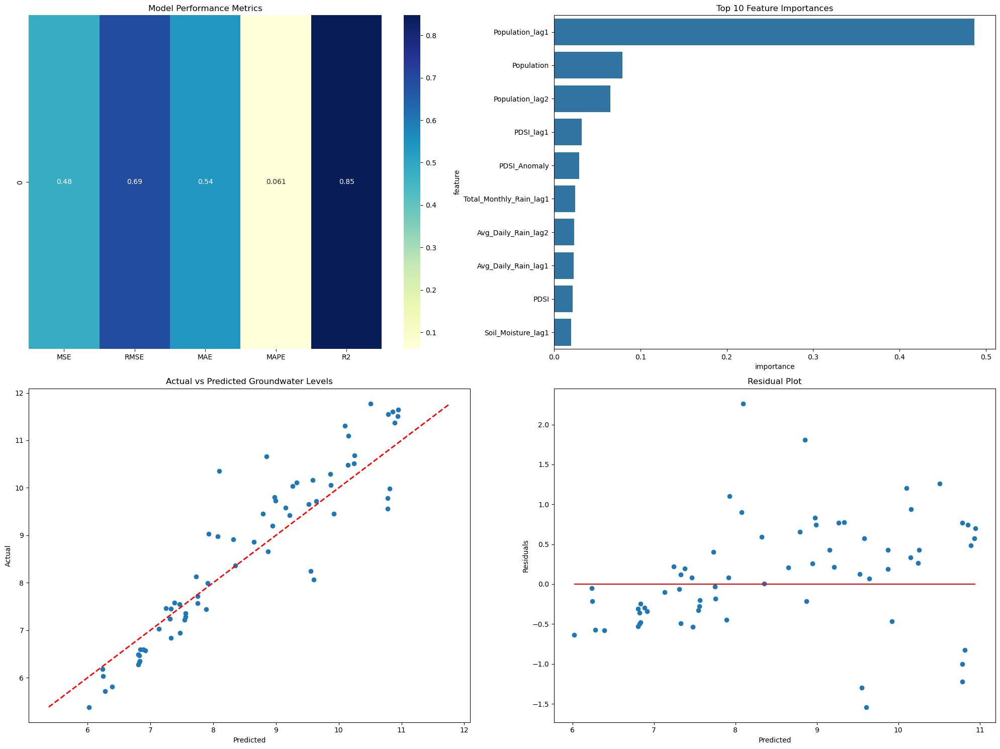

Evaluating Bhopal


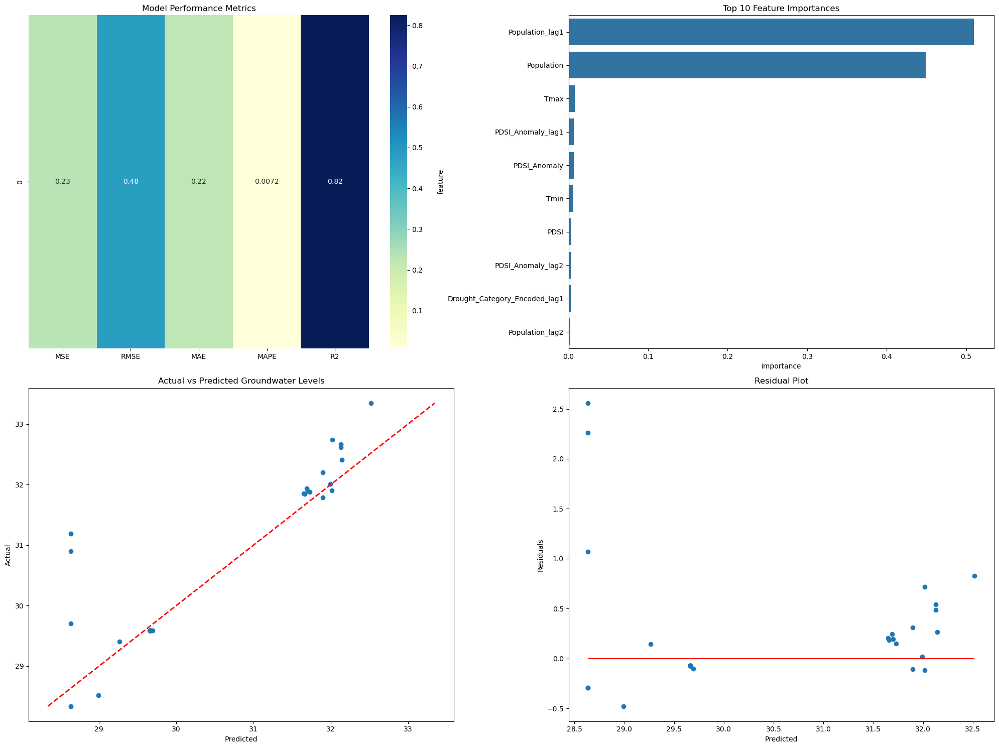

Evaluating Ranchi


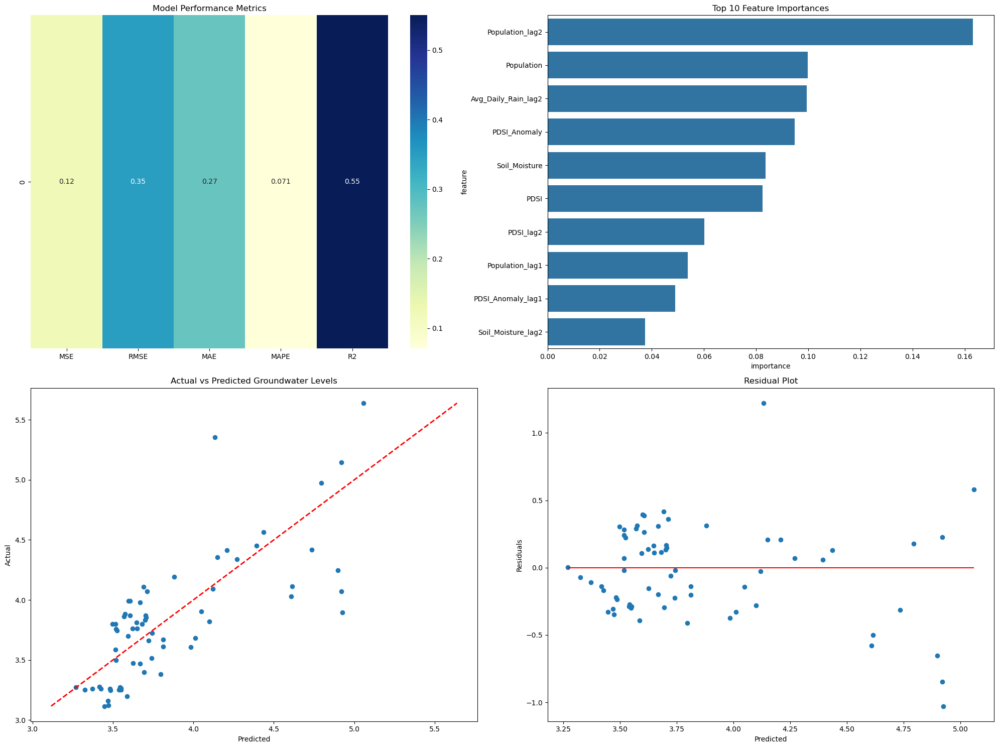

Evaluating Asansol


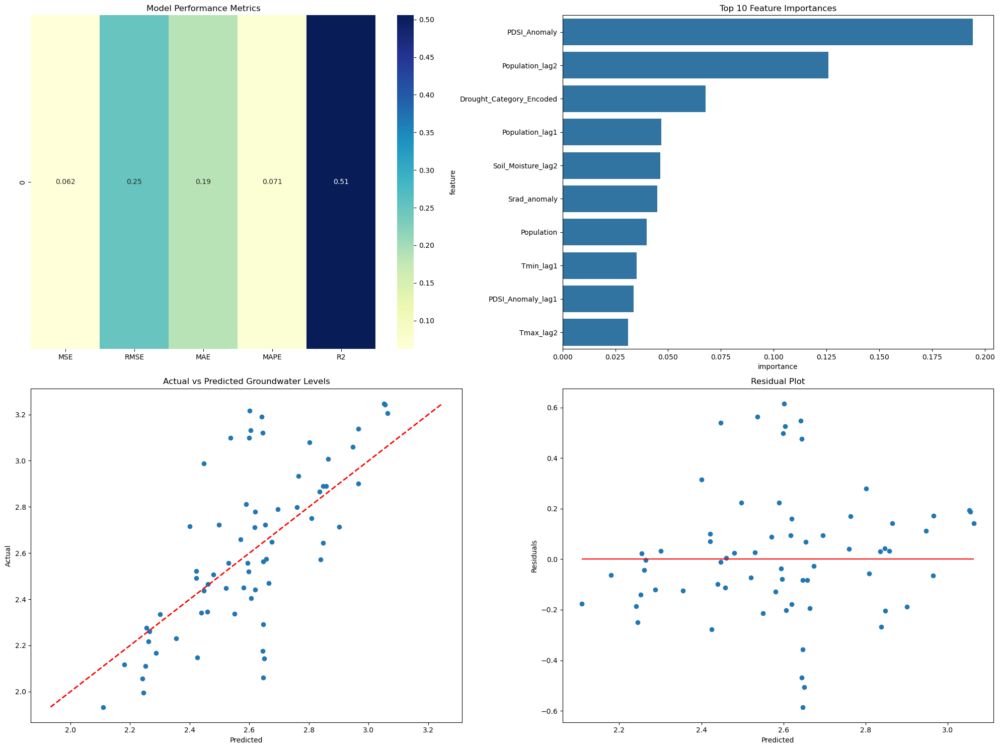

Evaluating Dhanbad


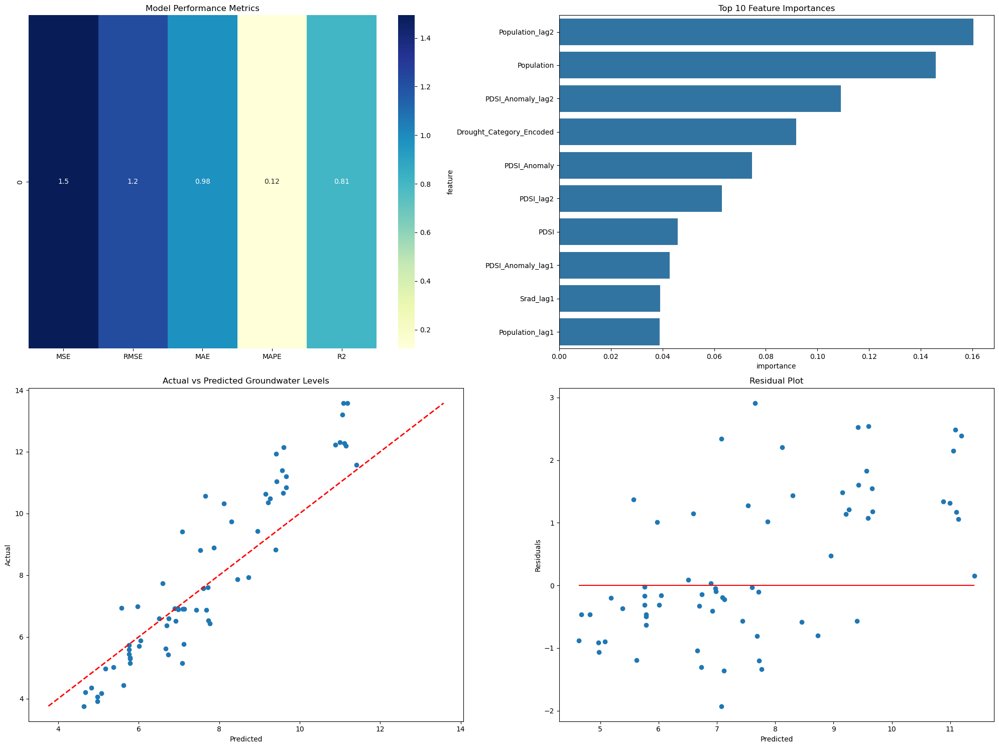

Evaluating Kota


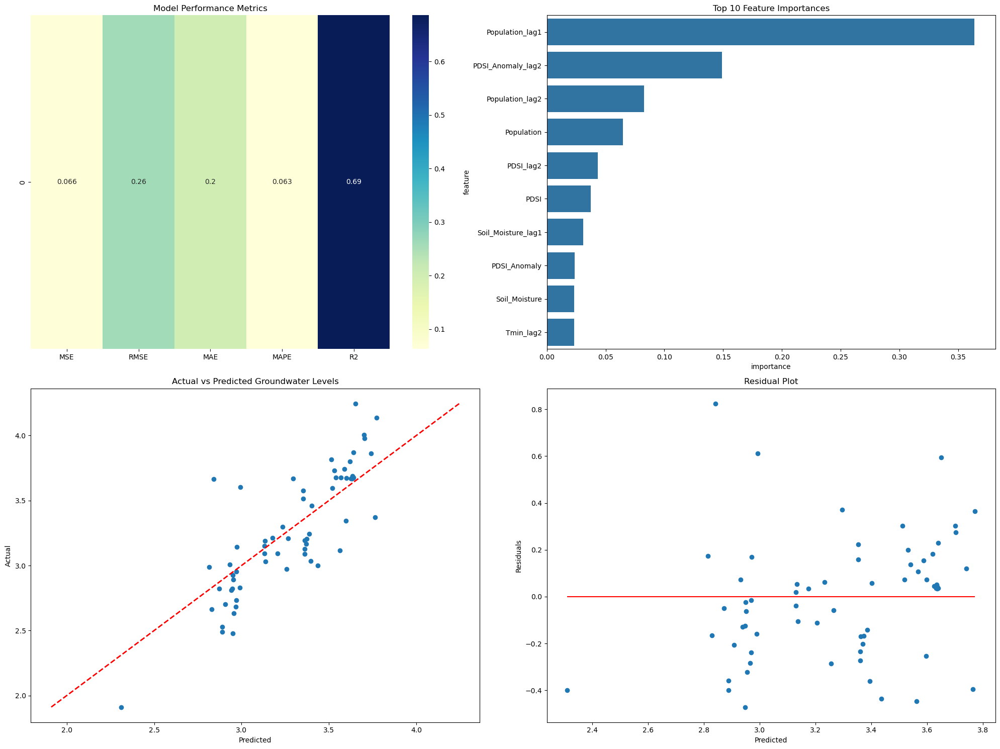

Evaluating Varanasi (Benares)


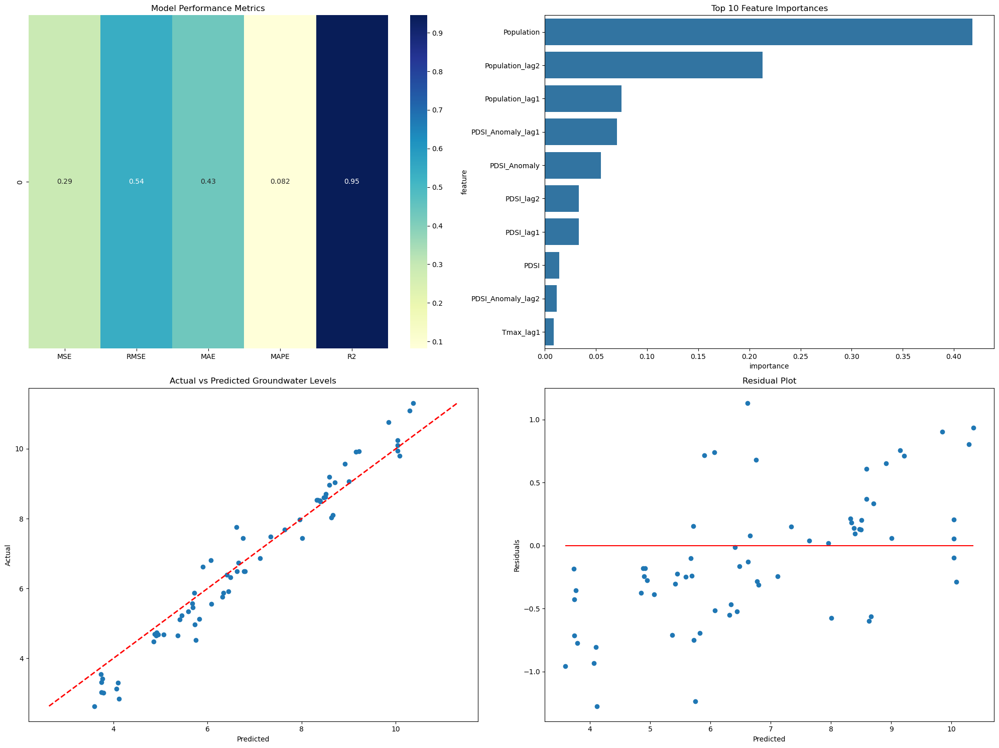

Evaluating Patna


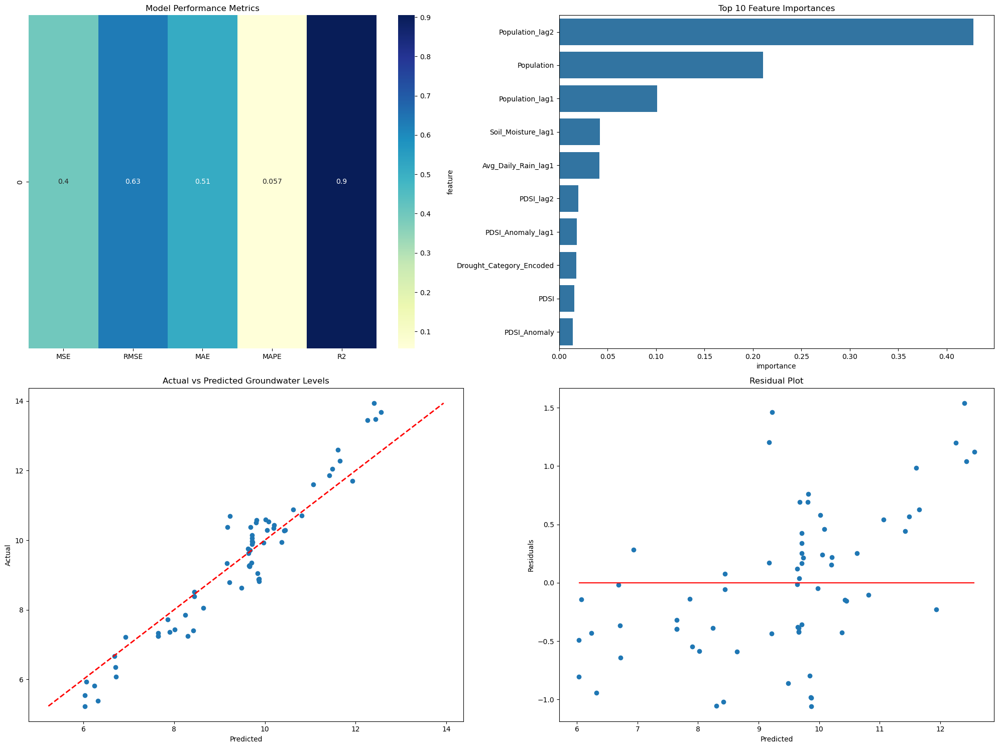

Evaluating Guwahati (Gauhati)


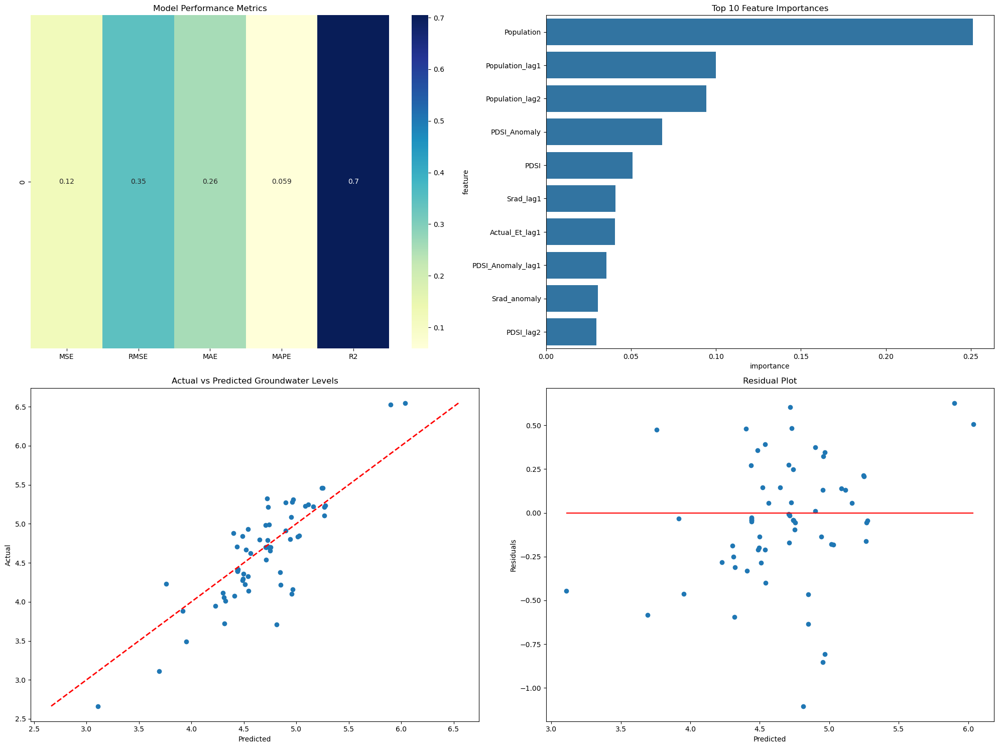

Evaluating Gwalior


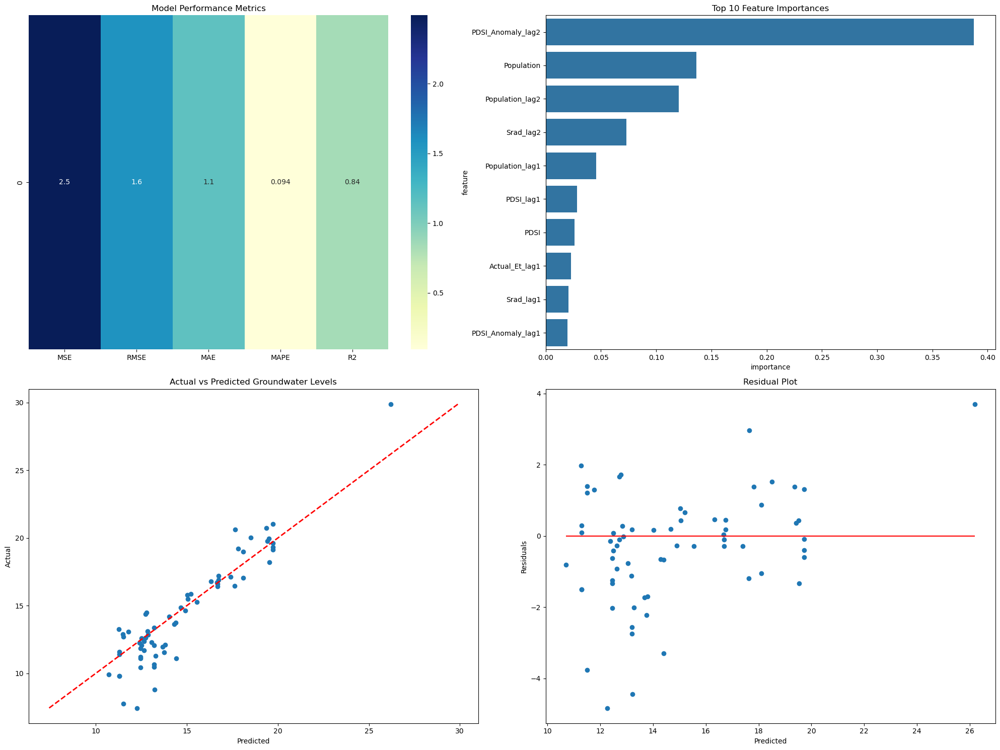

Evaluating Jodhpur


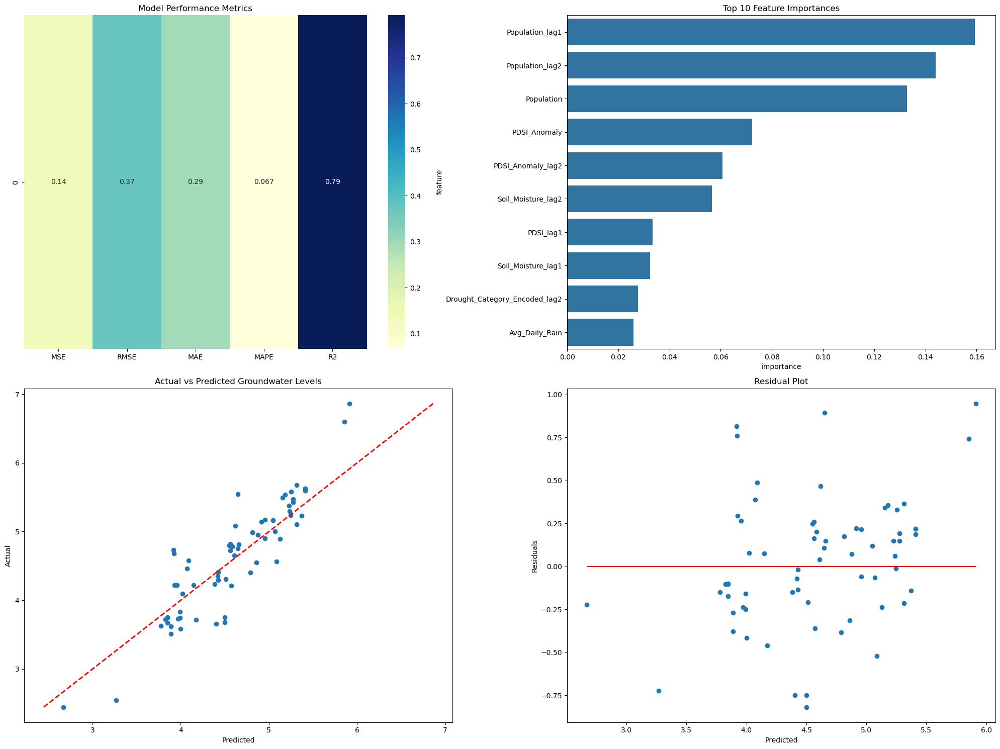

Evaluating Kanpur


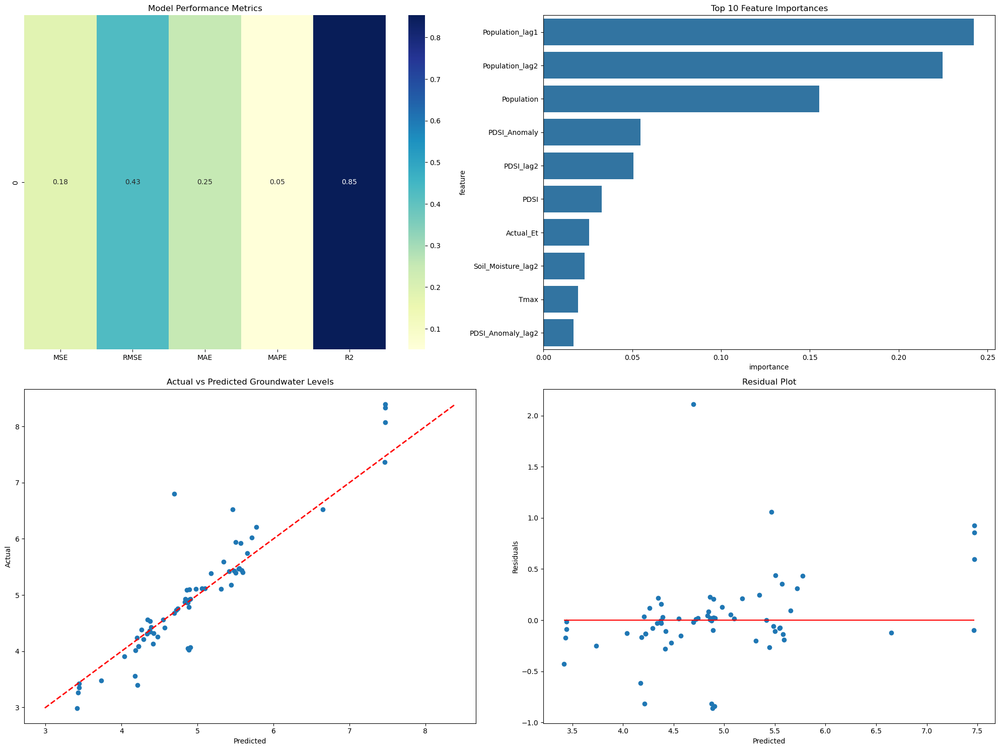

Evaluating Lucknow


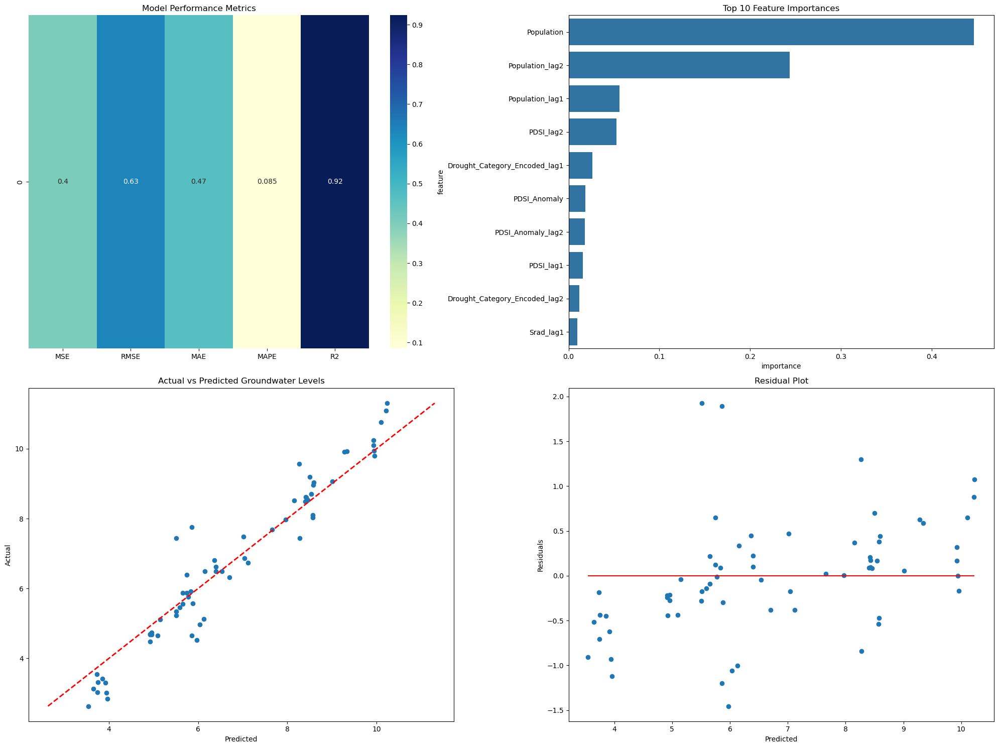

Evaluating Jaipur


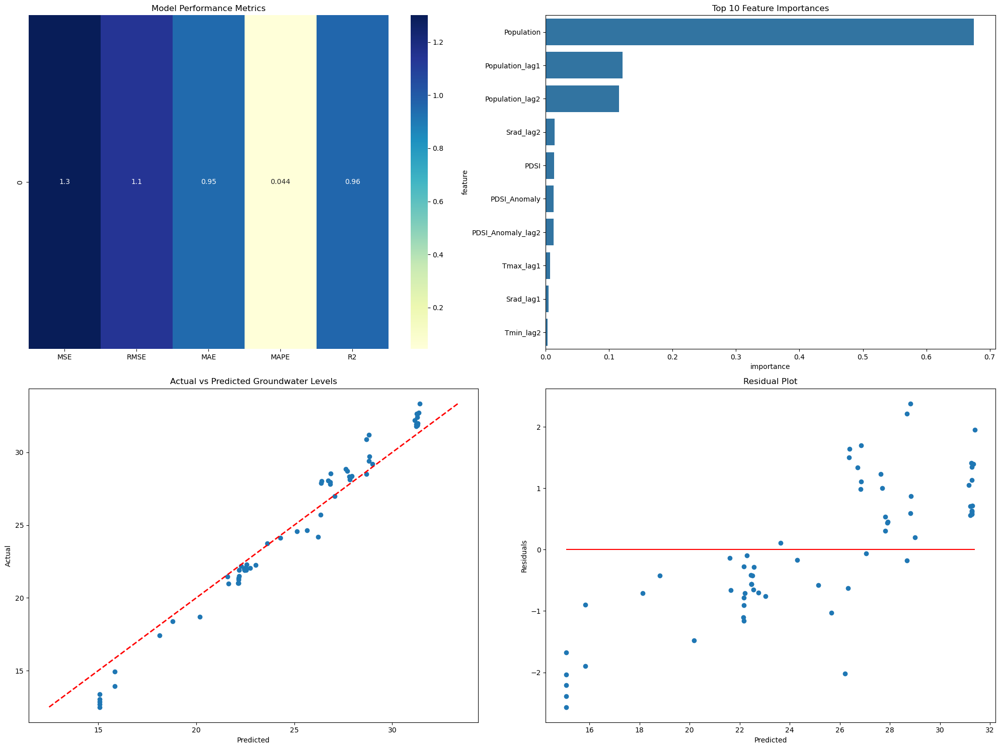

Evaluating Agra


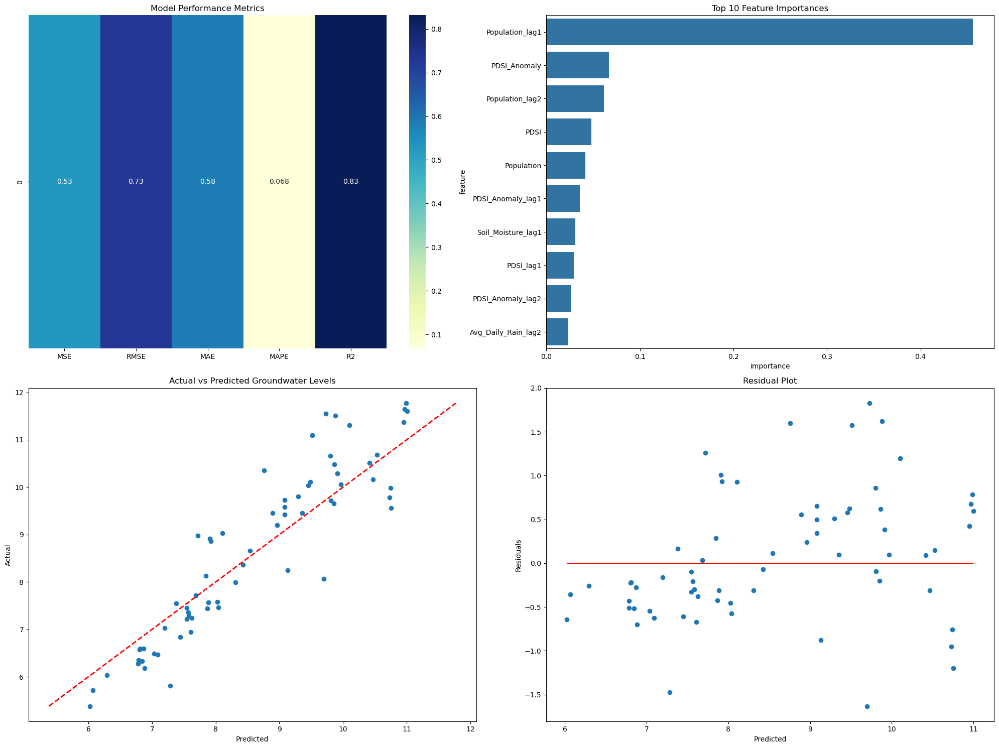

Evaluating Aligarh


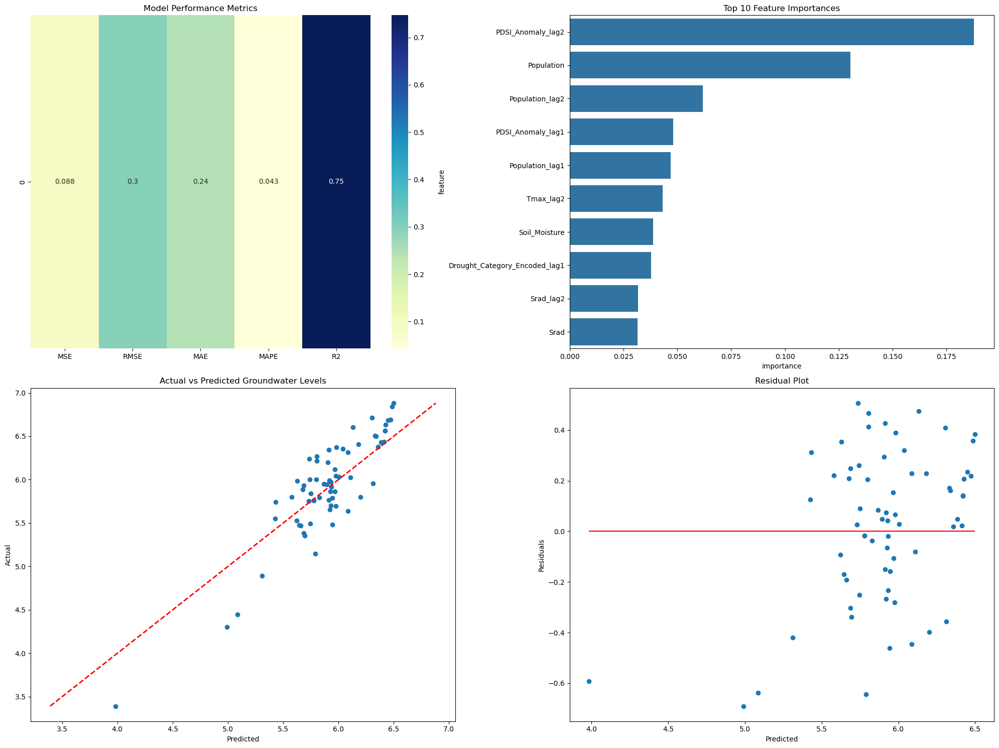

Evaluating Bareilly


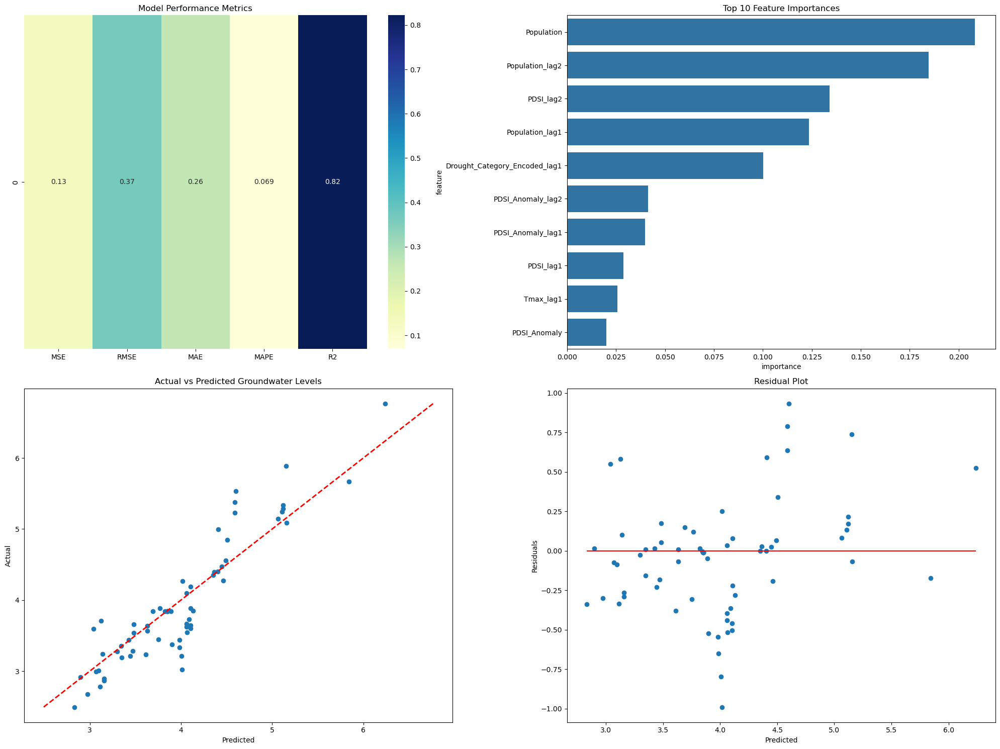

Evaluating Moradabad


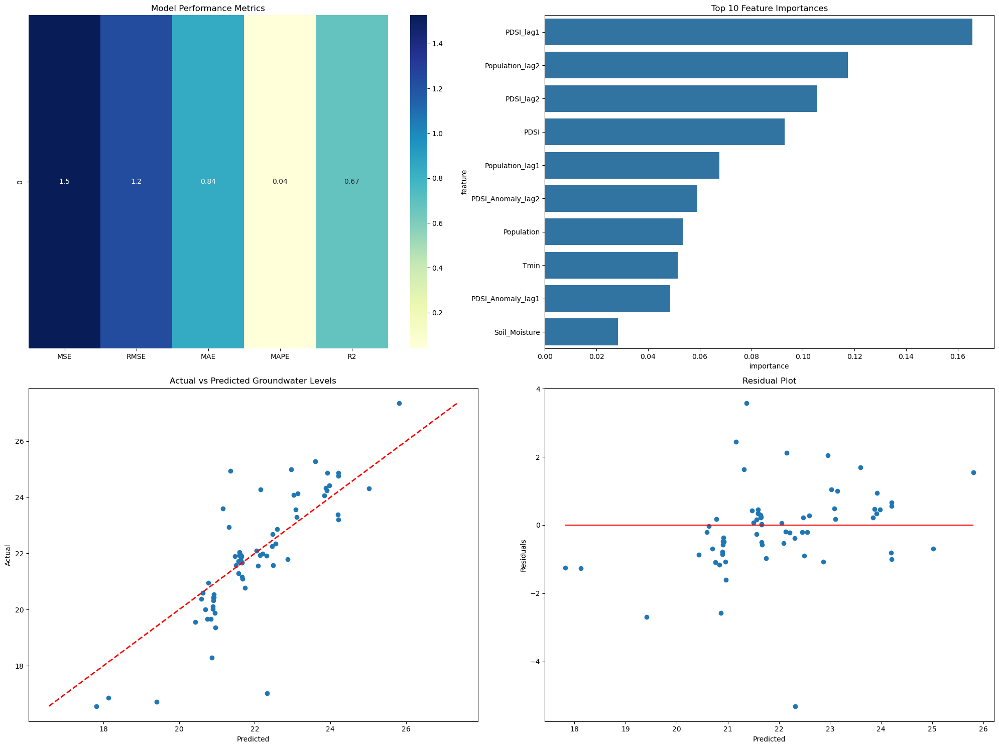

Evaluating Meerut


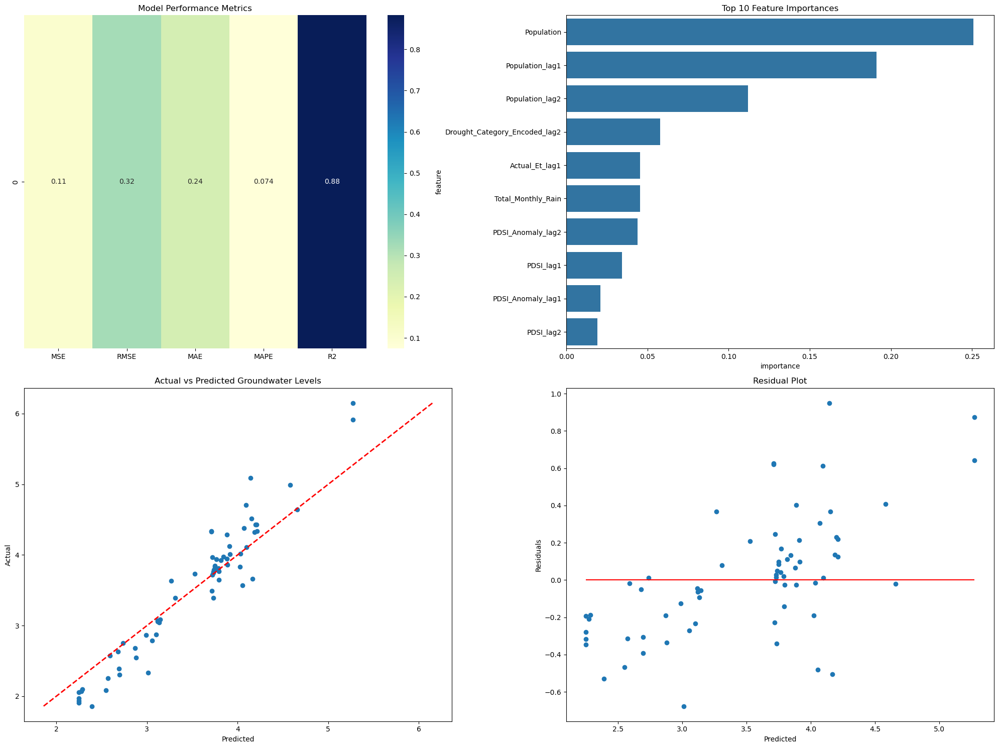

Evaluating Saharanpur


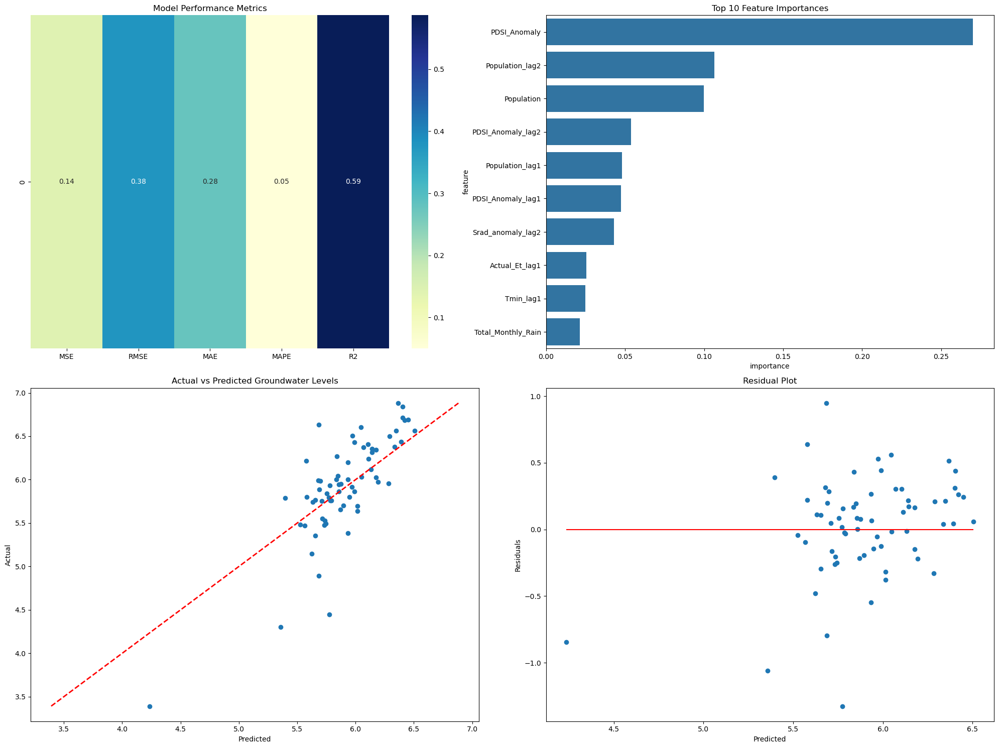

Evaluating Chandigarh


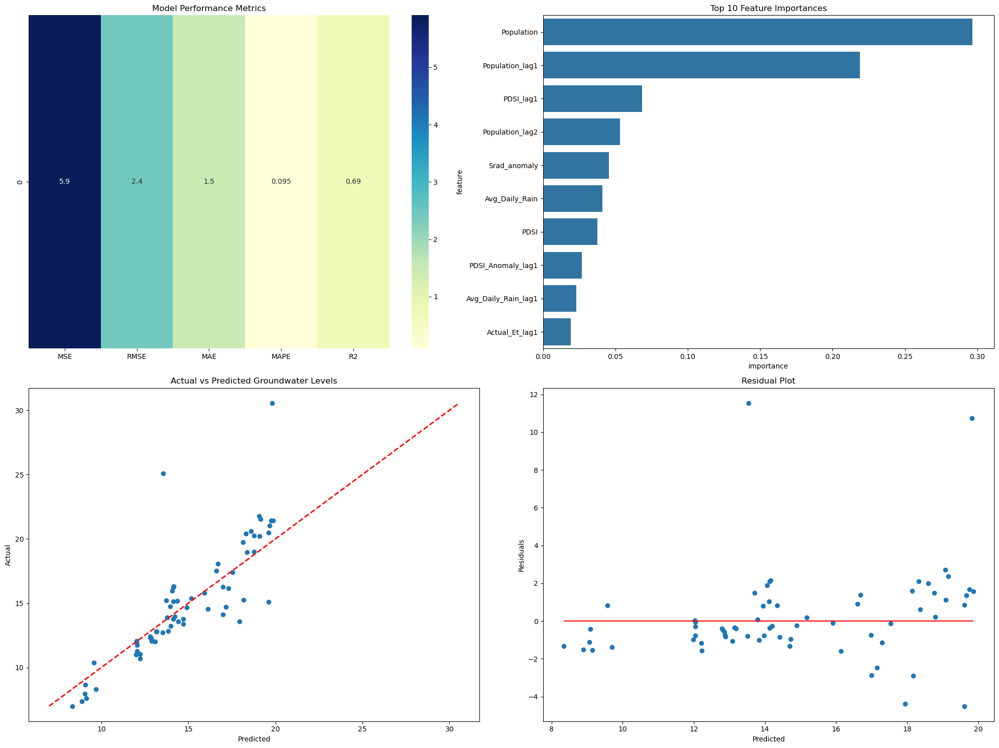

Evaluating Ludhiana


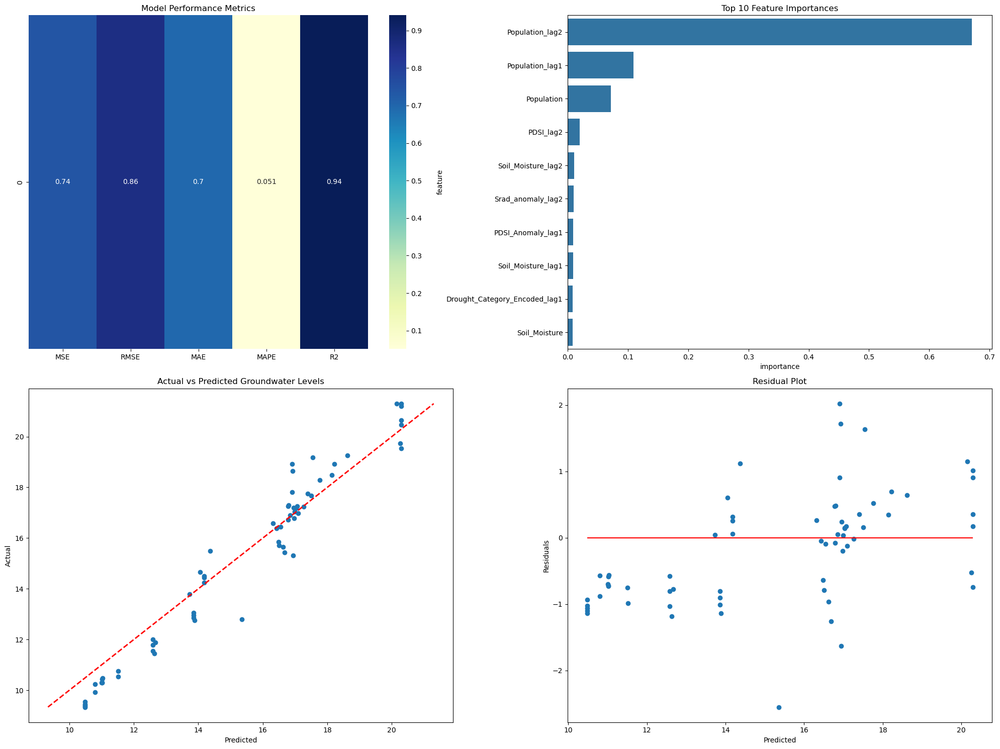

Evaluating Jalandhar


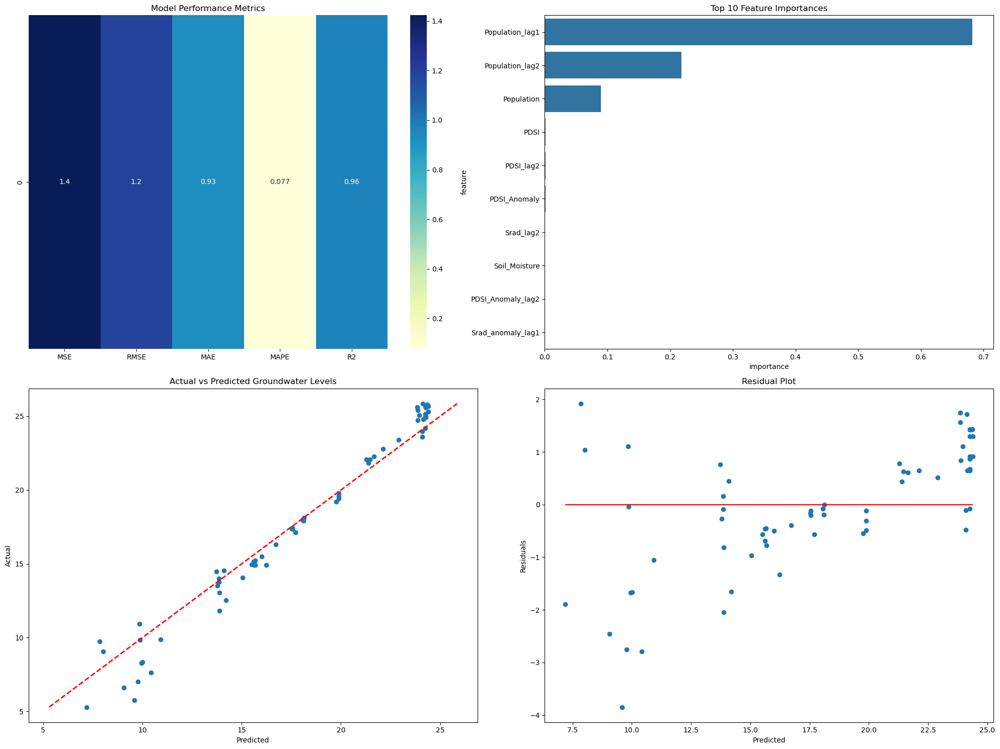

Evaluating Amritsar


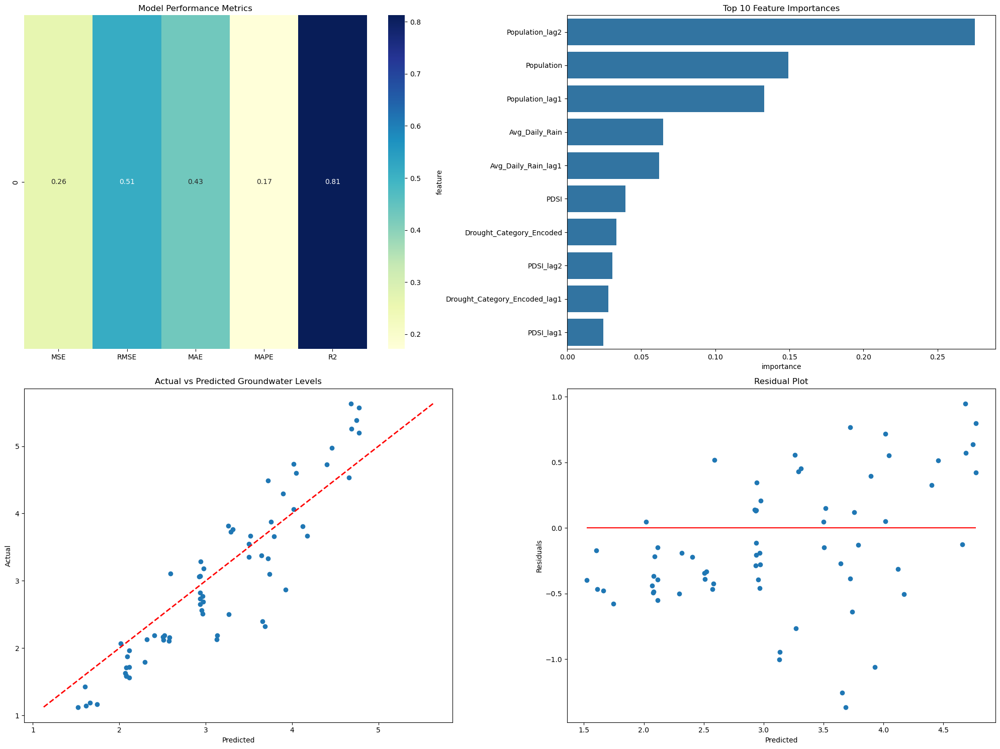

PermissionError: [Errno 13] Permission denied: 'groundwater_prediction_metrics.csv'

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, 
    r2_score, mean_absolute_percentage_error
)
import xgboost as xgb

class GroundwaterModelEvaluator:
    def __init__(self, file_path):
        self.data = pd.read_csv(file_path)
        self.cities = self.data['City'].unique()
    
    def prepare_city_data(self, city):
        city_data = self.data[self.data['City'] == city].copy()
        
        # Encode categorical variables
        le = LabelEncoder()
        city_data['Drought_Category_Encoded'] = le.fit_transform(city_data['Drought_Category'])
        
        # Feature selection
        features = [
            'Latitude', 'Longitude', 'Tmax', 'Tmin', 
            'Actual_Et', 'Avg_Daily_Rain', 'Total_Monthly_Rain', 
            'Soil_Moisture', 'PDSI', 'PDSI_Anomaly', 
            'Drought_Category_Encoded', 'Srad', 'Srad_anomaly', 
            'Population'
        ]
        
        # Create DataFrame with features and lagged features
        X = city_data[features].copy()
        for feature in features:
            X[f'{feature}_lag1'] = X[feature].shift(1)
            X[f'{feature}_lag2'] = X[feature].shift(2)
        
        # Remove NaN rows
        X.dropna(inplace=True)
        y = city_data.loc[X.index, 'Groundwater_Level']
        
        # Scaling
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        return X_scaled, y, X.columns
    
    def evaluate_model(self, city):
        # Prepare data
        X_scaled, y, feature_names = self.prepare_city_data(city)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42
        )
        
        # Train XGBoost model
        model = xgb.XGBRegressor(
            n_estimators=200, 
            learning_rate=0.01, 
            max_depth=5, 
            random_state=42
        )
        model.fit(X_train, y_train)
        
        # Predictions
        y_pred = model.predict(X_test)
        
        # Metrics
        metrics = {
            'MSE': mean_squared_error(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred),
            'MAPE': mean_absolute_percentage_error(y_test, y_pred),
            'R2': r2_score(y_test, y_pred)
        }
        
        return {
            'metrics': metrics,
            'model': model,
            'X_test': X_test,
            'y_test': y_test,
            'y_pred': y_pred,
            'feature_names': feature_names
        }
    
    def plot_results(self, results):
        # Create figure with multiple subplots
        plt.figure(figsize=(20, 15))
        
        # 1. Metrics Heatmap
        plt.subplot(2, 2, 1)
        metrics_df = pd.DataFrame([results['metrics']])
        sns.heatmap(metrics_df, annot=True, cmap='YlGnBu')
        plt.title('Model Performance Metrics')
        
        # 2. Feature Importance
        plt.subplot(2, 2, 2)
        feature_importances = results['model'].feature_importances_
        feature_importance_df = pd.DataFrame({
            'feature': results['feature_names'],
            'importance': feature_importances
        }).sort_values('importance', ascending=False).head(10)
        
        sns.barplot(x='importance', y='feature', data=feature_importance_df)
        plt.title('Top 10 Feature Importances')
        
        # 3. Actual vs Predicted
        plt.subplot(2, 2, 3)
        plt.scatter(results['y_pred'], results['y_test'])
        plt.plot([results['y_test'].min(), results['y_test'].max()], 
                 [results['y_test'].min(), results['y_test'].max()], 
                 'r--', lw=2)
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.title('Actual vs Predicted Groundwater Levels')
        
        # 4. Residual Plot
        plt.subplot(2, 2, 4)
        residuals = results['y_test'] - results['y_pred']
        plt.scatter(results['y_pred'], residuals)
        plt.hlines(y=0, xmin=results['y_pred'].min(), xmax=results['y_pred'].max(), color='r')
        plt.xlabel('Predicted')
        plt.ylabel('Residuals')
        plt.title('Residual Plot')
        
        plt.tight_layout()
        plt.show()

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
all_results = {}

# Evaluate for each city
for city in evaluator.cities:
    print(f"Evaluating {city}")
    results = evaluator.evaluate_model(city)
    evaluator.plot_results(results)
    all_results[city] = results

# Save comprehensive results
results_df = pd.DataFrame.from_dict(
    {city: results['metrics'] for city, results in all_results.items()}, 
    orient='index'
)
results_df.to_csv('groundwater_prediction_metrics.csv')

Analyzing feature importance for Thiruvananthapuram
Analyzing feature importance for Kollam
Analyzing feature importance for Madurai
Analyzing feature importance for Kochi (Cochin)
Analyzing feature importance for Thrissur
Analyzing feature importance for Coimbatore
Analyzing feature importance for Malappuram
Analyzing feature importance for Tiruppur
Analyzing feature importance for Kozhikode (Calicut)
Analyzing feature importance for Salem
Analyzing feature importance for Mysore
Analyzing feature importance for Bengaluru
Analyzing feature importance for Chennai (Madras)
Analyzing feature importance for Hubli-Dharwad
Analyzing feature importance for Hyderabad
Analyzing feature importance for Warangal
Analyzing feature importance for Pune (Poona)
Analyzing feature importance for Mumbai
Analyzing feature importance for Aurangabad
Analyzing feature importance for Nashik
Analyzing feature importance for Bhubaneswar
Analyzing feature importance for Nagpur
Analyzing feature importance for Su

C:\Users\Abhishek\AppData\Local\Temp\ipykernel_6608\2585176412.py:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=top_features, palette='viridis')
C:\Users\Abhishek\AppData\Local\Temp\ipykernel_6608\2585176412.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='feature', y='importance', data=city_importance_subset, palette='viridis')


# Feature Importance Analysis for Groundwater Level Prediction

## Top Features and Their Significance

### Population
- **Average Importance**: 0.2248
### Population_lag2
- **Average Importance**: 0.1869
### Population_lag1
- **Average Importance**: 0.1567
### PDSI_Anomaly_lag2
- **Average Importance**: 0.0410
### PDSI_Anomaly
- **Average Importance**: 0.0389
### PDSI_lag2
- **Average Importance**: 0.0361
### PDSI
- **Average Importance**: 0.0304
### PDSI_Anomaly_lag1
- **Average Importance**: 0.0235
### PDSI_lag1
- **Average Importance**: 0.0211
### Drought_Category_Encoded_lag2
- **Average Importance**: 0.0134

## Model Performance Metrics Across Cities

|                     |       MSE |     RMSE |      MAE |       MAPE |       R2 |
|:--------------------|----------:|---------:|---------:|-----------:|---------:|
| Thiruvananthapuram  | 1.49149   | 1.22126  | 0.977069 | 0.0702372  | 0.906205 |
| Kollam              | 0.634746  | 0.796709 | 0.585227 | 0.125753   | 0.809617 |
| Madu

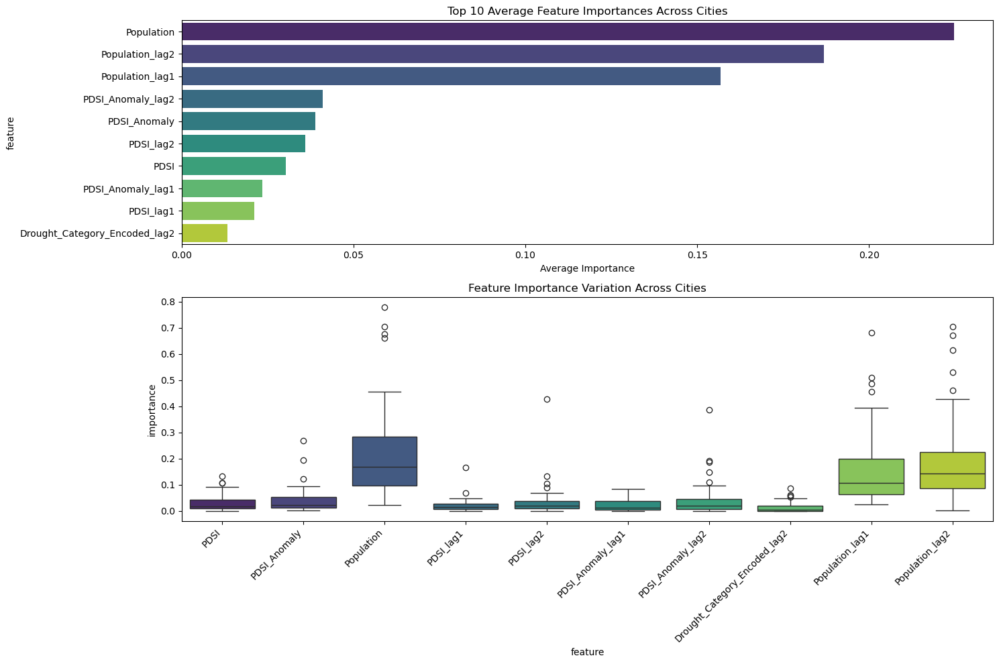

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

class FeatureImportanceExtractor:
    def __init__(self, groundwater_evaluator):
        self.evaluator = groundwater_evaluator
        self.all_results = {}
        self.comprehensive_feature_importance = {}
    
    def extract_feature_importance(self):
        """
        Extract and aggregate feature importance across all cities
        """
        for city in self.evaluator.cities:
            print(f"Analyzing feature importance for {city}")
            results = self.evaluator.evaluate_model(city)
            
            # Extract feature importances
            feature_importances = results['model'].feature_importances_
            feature_names = results['feature_names']
            
            # Create DataFrame for this city
            city_importance_df = pd.DataFrame({
                'feature': feature_names,
                'importance': feature_importances,
                'city': city
            })
            
            self.all_results[city] = results
            self.comprehensive_feature_importance[city] = city_importance_df
        
        return self.comprehensive_feature_importance
    
    def plot_comprehensive_feature_importance(self, top_n=15):
        """
        Create a comprehensive feature importance visualization
        """
        # Combine feature importances from all cities
        combined_importance = pd.concat(
            list(self.comprehensive_feature_importance.values()), 
            ignore_index=True
        )
        
        # Aggregate feature importance across cities
        aggregated_importance = combined_importance.groupby('feature')['importance'].mean().reset_index()
        aggregated_importance = aggregated_importance.sort_values('importance', ascending=False)
        
        # Plot top N features
        plt.figure(figsize=(15, 10))
        
        # Bar plot of average feature importance
        plt.subplot(2, 1, 1)
        top_features = aggregated_importance.head(top_n)
        sns.barplot(x='importance', y='feature', data=top_features, palette='viridis')
        plt.title(f'Top {top_n} Average Feature Importances Across Cities')
        plt.xlabel('Average Importance')
        plt.tight_layout()
        
        # Box plot to show feature importance variation across cities
        plt.subplot(2, 1, 2)
        top_feature_names = top_features['feature'].tolist()
        city_importance_subset = pd.concat([
            df[df['feature'].isin(top_feature_names)] 
            for df in self.comprehensive_feature_importance.values()
        ])
        
        sns.boxplot(x='feature', y='importance', data=city_importance_subset, palette='viridis')
        plt.title(f'Feature Importance Variation Across Cities')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        
        plt.savefig('comprehensive_feature_importance.png', dpi=300, bbox_inches='tight')
        
        return aggregated_importance
    
    def generate_feature_importance_summary(self, top_n=10):
        """
        Generate a textual summary of feature importances
        """
        aggregated_importance = self.plot_comprehensive_feature_importance(top_n)
        
        summary = "# Feature Importance Analysis for Groundwater Level Prediction\n\n"
        summary += "## Top Features and Their Significance\n\n"
        
        for _, row in aggregated_importance.head(top_n).iterrows():
            summary += f"### {row['feature']}\n"
            summary += f"- **Average Importance**: {row['importance']:.4f}\n"
        
        # Performance metrics summary
        performance_metrics = pd.DataFrame.from_dict(
            {city: results['metrics'] for city, results in self.all_results.items()}, 
            orient='index'
        )
        
        summary += "\n## Model Performance Metrics Across Cities\n\n"
        summary += performance_metrics.to_markdown()
        
        # Save summary
        with open('feature_importance_summary.md', 'w') as f:
            f.write(summary)
        
        return summary

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
feature_extractor = FeatureImportanceExtractor(evaluator)

# Extract and visualize feature importance
feature_extractor.extract_feature_importance()
summary = feature_extractor.generate_feature_importance_summary()

print(summary)

C:\Users\Abhishek\AppData\Local\Temp\ipykernel_6608\3100606485.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='feature', y='importance', data=combined_city_data, palette='viridis')


Top Features Details:
      feature     mean      std
   Population 0.224820 0.182659
 PDSI_Anomaly 0.038864 0.047636
         PDSI 0.030395 0.029348
 Srad_anomaly 0.012575 0.015267
Soil_Moisture 0.011733 0.016139


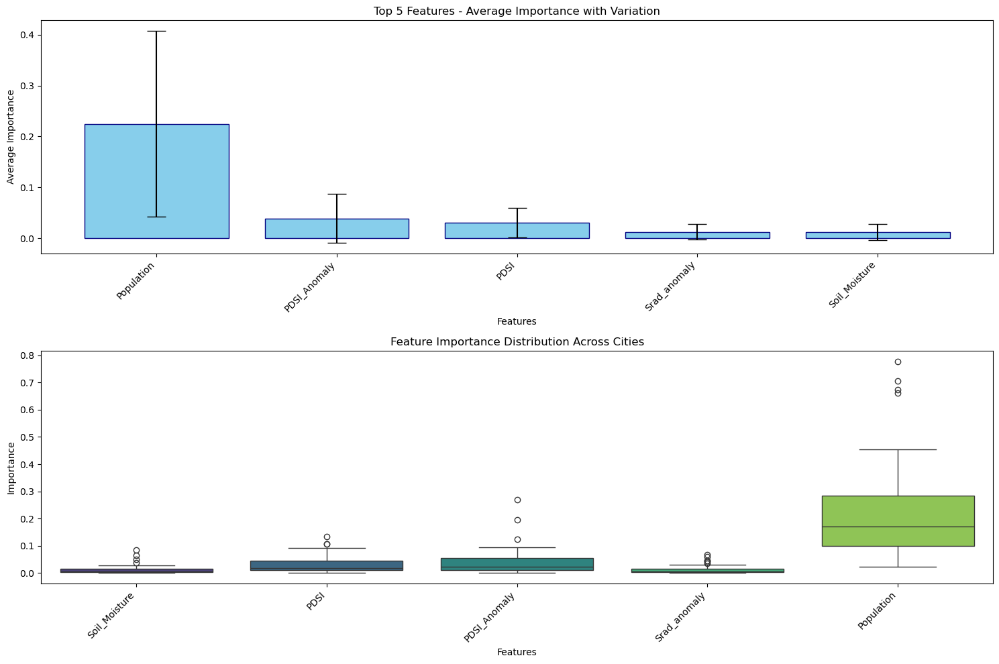

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

class FeatureImportancePlotter:
    def __init__(self, groundwater_evaluator):
        self.evaluator = groundwater_evaluator
        self.feature_importances = {}
    
    def extract_feature_importance(self):
        """
        Extract feature importance across all cities, excluding lag features
        """
        all_importances = []
        
        for city in self.evaluator.cities:
            results = self.evaluator.evaluate_model(city)
            
            # Get feature names and importances
            feature_names = results['feature_names']
            feature_importances = results['model'].feature_importances_
            
            # Create DataFrame, filtering out lag features
            city_importance_df = pd.DataFrame({
                'feature': feature_names,
                'importance': feature_importances,
                'city': city
            })
            
            # Filter out lag features
            city_importance_df = city_importance_df[
                ~city_importance_df['feature'].str.contains('_lag')
            ]
            
            all_importances.append(city_importance_df)
        
        # Combine and aggregate
        combined_importance = pd.concat(all_importances, ignore_index=True)
        aggregated_importance = combined_importance.groupby('feature')['importance'].agg(['mean', 'std']).reset_index()
        aggregated_importance = aggregated_importance.sort_values('mean', ascending=False)
        
        return aggregated_importance
    
    def plot_top_features(self, top_n=5):
        """
        Create comprehensive visualization of top features
        """
        # Extract feature importance
        feature_importance = self.extract_feature_importance()
        top_features = feature_importance.head(top_n)
        
        # Set up the plot
        plt.figure(figsize=(15, 10))
        
        # Bar plot with error bars
        plt.subplot(2, 1, 1)
        plt.bar(top_features['feature'], top_features['mean'], 
                yerr=top_features['std'], 
                capsize=10, 
                color='skyblue', 
                edgecolor='navy')
        plt.title(f'Top {top_n} Features - Average Importance with Variation')
        plt.xlabel('Features')
        plt.ylabel('Average Importance')
        plt.xticks(rotation=45, ha='right')
        
        # Box plot to show distribution
        plt.subplot(2, 1, 2)
        # Prepare data for box plot
        box_data = self.extract_feature_importance()
        top_feature_names = box_data.head(top_n)['feature'].tolist()
        
        # Get all cities' data for these features
        all_cities_data = []
        for city in self.evaluator.cities:
            results = self.evaluator.evaluate_model(city)
            city_df = pd.DataFrame({
                'feature': results['feature_names'],
                'importance': results['model'].feature_importances_,
                'city': city
            })
            city_df = city_df[city_df['feature'].isin(top_feature_names)]
            all_cities_data.append(city_df)
        
        combined_city_data = pd.concat(all_cities_data, ignore_index=True)
        
        # Create box plot
        sns.boxplot(x='feature', y='importance', data=combined_city_data, palette='viridis')
        plt.title('Feature Importance Distribution Across Cities')
        plt.xlabel('Features')
        plt.ylabel('Importance')
        plt.xticks(rotation=45, ha='right')
        
        plt.tight_layout()
        plt.savefig('top_features_importance.png', dpi=300, bbox_inches='tight')
        
        # Print top features details
        print("Top Features Details:")
        print(top_features.to_string(index=False))
        
        return top_features

# Usage
evaluator = GroundwaterModelEvaluator('final for code.csv')
plotter = FeatureImportancePlotter(evaluator)
top_features = plotter.plot_top_features()